# Investigate RNA-seq attributions for causal variant detection

In [1]:
import h5py 
import numpy as np
import sys
import os

hdf5_path = './data/ATAC-seq-preprocessed.hdf5'

with h5py.File(hdf5_path, 'r') as f:
    # List all groups
    for key in f.keys():
        print("Key: %s" % key)
    #data = f[a_group_key][:]
    #print("Data shape: %s" % str(data.shape))

Key: B6_sequence
Key: Cast_sequence
Key: index
Key: original_peak_index
Key: peak_name
Key: sc.B6
Key: sc.CAST
Key: sc.ratio
Key: sum.B6
Key: sum.CAST
Key: sum.ratio


## Working with DeepAllele tools to predict and check attributions

In [3]:
import os

# Bcell model parameters 
b_mhckpt = 'bulk/models/mh/init0/model.ckpt'
b_shckpt = 'bulk/models/sh/init0/model.ckpt'

out_path = os.path.expanduser('~/Git/DeepAllele-public/data/atac/bulk/results/mh/init0/')
batch_id = 'sum'

split_by_chrom = True
device = 0  # GPU id, -1 for CPU

import numpy as np 
import pandas as pd
import sys
import torch
from DeepAllele import data, tools
import pytorch_lightning as pl
from torch.utils.data import TensorDataset, DataLoader

hdf5_path = './data/ATAC-seq-preprocessed.hdf5'
batch_size = 8
num_workers = 4

trainloader, valloader, train_feature, val_feature = data.load_h5(hdf5_path, 
                                                                  split_ratio=0.9,
                                                                  batch_size=batch_size,
                                                                  batch_id=batch_id, 
                                                                  split_by_chrom=split_by_chrom, 
                                                                  shuffle=False,
                                                                  num_workers=num_workers)

# first we need to separate the sequence pairs from the valloader
seqs_all = []
obs_all = []
for bid, (seqs, labels) in enumerate(valloader):
    seqs_all.append(seqs.cpu().numpy())
    obs_all.append(labels.cpu().numpy())
val_seqs = np.concatenate(seqs_all)
print(f'Input sequence shape {np.shape(val_seqs)}')
obs_all = np.concatenate(obs_all)
val_labels = val_feature

print(f'Input observation shape {np.shape(obs_all)}')
obs_df = pd.DataFrame(obs_all, columns=['count_A', 'count_B', 'log_ratio'])

trainer = pl.Trainer(devices=[device] if device>=0 else None, accelerator="gpu" if device>=0  else "cpu", logger=False)

# For multi-head model
mhmodel = tools.load_saved_model(b_mhckpt, 'mh', map_location=f'cuda:{device}' if device>=0 else 'cpu')
res = trainer.predict(mhmodel, valloader)
res=torch.cat(res).numpy()
mh_df = pd.DataFrame()
mh_df['count_A'] = res[:,0]
mh_df['count_B'] = res[:,1]
mh_df['ratioHead'] = res[:,2]
mh_df['ratio_count_A-B'] = res[:,0]-res[:,1]
mh_df['seq_label'] = val_feature

# For single-head model
shmodel = tools.load_saved_model(b_shckpt, 'sh', map_location=f'cuda:{device}' if device>=0 else 'cpu')
placeholder_y = np.zeros((len(val_seqs),1))
dataset_A = TensorDataset(torch.from_numpy(val_seqs[:,:,:,0]), torch.from_numpy(placeholder_y)) # y is placeholder 
dataset_B = TensorDataset(torch.from_numpy(val_seqs[:,:,:,1]), torch.from_numpy(placeholder_y)) # y is placeholder 
loader_A = DataLoader(dataset_A, batch_size=batch_size, shuffle=False, num_workers=num_workers)
loader_B = DataLoader(dataset_B, batch_size=batch_size, shuffle=False, num_workers=num_workers)

res_A = trainer.predict(shmodel, loader_A)
res_B = trainer.predict(shmodel, loader_B)
res_A=torch.cat(res_A).numpy()[:,0,0] # [:,1,0] is obs
res_B=torch.cat(res_B).numpy()[:,0,0] # [:,1,0] is obs

sh_df = pd.DataFrame()
sh_df['count_A'] = res_A
sh_df['count_B'] = res_B
sh_df['ratio_count_A-B'] = res_A -res_B
sh_df['seq_label'] = val_feature


sum
splitting train and val by chrom
splitting finished: using chromosomes ['16', '17', '18'] for validation
there are 24321 samples in val and 198355 samples in train
decode the peak name successfully


Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Lightning automatically upgraded your loaded checkpoint from v1.7.5 to v2.5.1.post0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint bulk/models/mh/init0/model.ckpt`
You are using a CUDA device ('NVIDIA RTX 2000 Ada Generation Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Input sequence shape (24321, 330, 4, 2)
Input observation shape (24321, 3)
Predicting DataLoader 0: 100%|██████████| 3041/3041 [00:09<00:00, 313.24it/s]


Lightning automatically upgraded your loaded checkpoint from v1.7.5 to v2.5.1.post0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint bulk/models/sh/init0/model.ckpt`
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 3041/3041 [00:06<00:00, 438.01it/s]


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 3041/3041 [00:06<00:00, 438.02it/s]


0.15425782
(24321, 6) (24321, 3) (24321,)
Well predicted sequences with mh: 346
(24321, 5) (24321, 3) (24321,)
Well predicted sequences with sh: 265


/home/sasse/Git/DeepAllele-public/DeepAllele/plotlib.py:1326: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scat = ax.scatter(x, y, alpha=alpha, s=size, c=color, cmap=cmap, linewidth=lw)


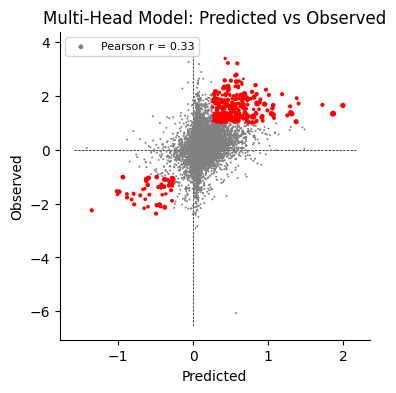

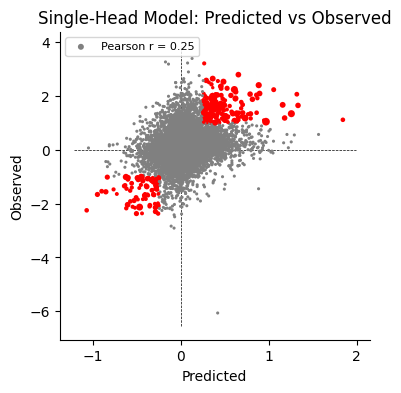

In [8]:
# Plot predicted versus observed values
from DeepAllele.plotlib import scatter_plot
import numpy as np
import matplotlib.pyplot as plt

# select well predicted sequences
ratio_cut=1.0
predz_cut=1.65
# compute std of predicted values
mh_std = np.sqrt(np.mean(mh_df['ratioHead']**2))
print(mh_std)
#transform to zscores
mh_df['ratioHead_z'] = mh_df['ratioHead']/mh_std
sh_df['ratio_count_A-B_z'] = sh_df['ratio_count_A-B']/mh_std

# select well predicted sequences
# If the indices do not match, pandas will align by index, and the result can be much larger.
# Convert both to NumPy arrays before the operation:
mh_well_pred_mask = (mh_df['ratioHead_z'].values * obs_df['log_ratio'].values > 0)  & (np.abs(mh_df['ratioHead_z'].values) >= predz_cut) & (np.abs(obs_df['log_ratio'].values) >= ratio_cut)
print(mh_df.shape, obs_df.shape, mh_well_pred_mask.shape)
print('Well predicted sequences with mh:', np.sum(mh_well_pred_mask))
sh_well_pred_mask = (sh_df['ratio_count_A-B_z'].values * obs_df['log_ratio'].values > 0) & (np.abs(sh_df['ratio_count_A-B_z'].values) >= predz_cut) & (np.abs(obs_df['log_ratio'].values) >= ratio_cut)
print(sh_df.shape, obs_df.shape, sh_well_pred_mask.shape)
print('Well predicted sequences with sh:', np.sum(sh_well_pred_mask))
# create array with grey color for all data points
mh_colors = np.full(mh_df.shape[0], 'grey')
mh_colors[mh_well_pred_mask] = 'red'

sh_colors = np.full(sh_df.shape[0], 'grey')
sh_colors[sh_well_pred_mask] = 'red'

# TODO: create array with sizes all 5, but the ones for significant dots should be scaled by max count of count_A and count_B 
mh_sizes = np.full(mh_df.shape[0], 2)
mh_sizes[mh_well_pred_mask] = 0.5* 2 ** mh_df[['count_A', 'count_B']].values[mh_well_pred_mask].max(axis = 1)
sh_sizes = np.full(sh_df.shape[0], 5)
sh_sizes[sh_well_pred_mask] = 0.5* 2 ** sh_df[['count_A', 'count_B']].values[sh_well_pred_mask].max(axis = 1)

figmh = scatter_plot(mh_df['ratioHead'].values, obs_df['log_ratio'].values, contour = False, color = mh_colors, size = mh_sizes, title='Multi-Head Model: Predicted vs Observed', xlabel='Predicted', ylabel='Observed')
figsh =scatter_plot(sh_df['ratio_count_A-B'], obs_df['log_ratio'], contour = False, color = sh_colors, size = sh_sizes, title='Single-Head Model: Predicted vs Observed', xlabel='Predicted', ylabel='Observed')

figmh.savefig(f'{out_path}{batch_id}mh_pred_vs_obs.png', dpi=200, bbox_inches='tight')
figsh.savefig(f'{out_path}{batch_id}sh_pred_vs_obs.png', dpi=200, bbox_inches='tight')
plt.show()
plt.close(figmh)
plt.close(figsh)

## Create attributions for these

In [9]:
from DeepAllele import model, tools, surrogate_model

def get_surrogate_model(ckpt_path, device = None):
    """
    Captum DeepLift does not allow for reuse of ReLU module, which is part of Deepallele's architecture. 
    To deal with this, we create a surrogate model for interpretation with the same weights as a provided deepallele model, 
    but no resued ReLU. This surrogate model has identical predicton performance to the original. 

    Parameters: 
    - ckpt_path: String path to ckeckpoint containing model paramters for DeepAllele (multi-head) model. 

    Returns: Surrogate model with identical performance to the one found at ckpt_path, but no reuse of ReLU module. 
    """
    # load original model from ckpt 
    if device is not None:
        if isinstance(device, int):
            if device >= 0:
                device = f'cuda:{device}'
            else:
                device = 'cpu'
    orig = model.SeparateMultiHeadResidualCNN.load_from_checkpoint(ckpt_path, map_location=device)
    surrogate = surrogate_model.SeparateMultiHeadResidualCNN_DeepliftSurrogate(
        kernel_number=orig.hparams['kernel_number'],
        kernel_length=orig.hparams['kernel_length'],
        filter_number=orig.hparams['filter_number'],
        kernel_size=orig.hparams['kernel_size'],
        pooling_size=orig.hparams['pooling_size'],
        input_length=orig.hparams['input_length'],
        conv_layers=orig.hparams['conv_layers'],
        hidden_size=orig.hparams['hidden_size'],
    )
    # transfer weights
    surrogate.conv0_b6.load_state_dict(orig.conv0.state_dict())
    for i in range(len(surrogate.convlayers_b6)):
        surrogate.convlayers_b6[i].load_state_dict(orig.convlayers[i].state_dict())

    surrogate.conv0_cast.load_state_dict(orig.conv0.state_dict())
    for i in range(len(surrogate.convlayers_cast)):
        surrogate.convlayers_cast[i].load_state_dict(orig.convlayers[i].state_dict())

    surrogate.fc0_b6.load_state_dict(orig.fc0.state_dict())
    for i in range(len(surrogate.fclayers_b6)):
        surrogate.fclayers_b6[i].load_state_dict(orig.fclayers[i].state_dict())

    surrogate.fc0_cast.load_state_dict(orig.fc0.state_dict())
    for i in range(len(surrogate.fclayers_b6)):
        surrogate.fclayers_cast[i].load_state_dict(orig.fclayers[i].state_dict())

    surrogate.counts_out_b6.load_state_dict(orig.counts_out.state_dict())
    surrogate.counts_out_cast.load_state_dict(orig.counts_out.state_dict())

    surrogate.ratio_out.load_state_dict(orig.ratio_out.state_dict())
    for i in range(len(surrogate.ratio_fclayers)):
        surrogate.ratio_fclayers[i].load_state_dict(orig.ratio_fclayers[i].state_dict())
    surrogate.eval()
    return surrogate

def get_gradient_based_attributions(x, model, baseline,attrib_type='deeplift',target_idx=2,multiply_by_inputs=False,n_steps=50,internal_batch_size=4): 
    """
    Get gradient-based model attributions for a given input sequence and model. 

    Parameters: 
    - x: Tensor model input of shape [batch_size, input length, 4] (4 is for the 4 nucleotides of the one-hot encoded sequence). 
    - model: DeepAllele model (either single-head or multi-head). 
    - baseline: Tensor baseline (only used if attrib_type is 'deeplift' or 'ig'). Baseline should be of the same shape as x: [batch_size, input length, 4]. 
    - attrib_type: String attribution type, of {'deeplift', 'ig', 'grad'}. 
    - target_idx: Integer index of the model output to use for getting attributions. 
    - multiply_by_inputs: Boolean input to DeepLift indicating whether local (if multiply_by_inputs=False) or global (if multiply_by_inputs=True) should be returned. 
    - n_steps: Integer input to IntegratedGradients. 
    - internal_batch_size: Integer input to IntegratedGradients. 

    Returns: Numpy array of attributions of shape [batch_size, input length, 4]. 
    """

    if attrib_type=='deeplift': 
        from captum.attr import DeepLift

        attrib_funct = DeepLift(model.eval(),multiply_by_inputs=multiply_by_inputs)
        attributions = attrib_funct.attribute(x, baseline, target=target_idx, return_convergence_delta=False)
        attributions = attributions.detach().cpu().numpy()

    if attrib_type=='ig': 
        from captum.attr import IntegratedGradients
        ig = IntegratedGradients(model, multiply_by_inputs=multiply_by_inputs)
        attributions = ig.attribute(x,baselines=baseline,return_convergence_delta=False,target=target_idx,n_steps=n_steps,internal_batch_size=internal_batch_size)
        attributions = attributions.detach().cpu().numpy()
    
    if attrib_type=='grad': 
        input_seq = x.clone().requires_grad_(True)
        model_output = model(input_seq)[0]
        model_output[target_idx].backward(retain_graph=True)
        attributions = input_seq.grad.clone().cpu().numpy()
        
    return attributions 

In [10]:
import numpy as np
import torch

torch.cuda.empty_cache()

attribution_type = 'ig' # deeplift ig grad
selected_sequence_labels = val_labels[mh_well_pred_mask]
selected_sequences = val_seqs[mh_well_pred_mask]
selected_obs = obs_all[mh_well_pred_mask]
selected_mhratio = mh_df['ratioHead'].values[mh_well_pred_mask]
selected_mhA = mh_df['count_A'].values[mh_well_pred_mask]
selected_mhB = mh_df['count_B'].values[mh_well_pred_mask]
selected_shratio = sh_df['ratio_count_A-B'].values[mh_well_pred_mask]
device = 0 

# For mh model load check point to surrogate model
mhmodel = get_surrogate_model(b_mhckpt, device=device)
if device>=0:
    mhmodel.to(device)

mh_selected_attributions = np.ones_like(selected_sequences)

for seq_idx in range(selected_sequences.shape[0]):
    print(selected_sequence_labels[seq_idx])
    print('Observed', selected_obs[seq_idx])
    print('Predicted', selected_mhA[seq_idx], selected_mhB[seq_idx], selected_mhratio[seq_idx], 'sh:', selected_shratio[seq_idx])
    curr_seq = selected_sequences[[seq_idx],:,:,:]
    tensor_seq = torch.Tensor(curr_seq)
    # uniform baseline if needed
    baseline = torch.ones_like(tensor_seq)*0.25
    if device>=0: 
        tensor_seq=tensor_seq.to(device)
        baseline=baseline.to(device)
    # check predictions
    mh_pred = mhmodel(tensor_seq)
    mh_pred_baseline = mhmodel(baseline)
    print('Surrogate', mh_pred.detach().cpu().numpy(), mh_pred_baseline.detach().cpu().numpy())
    mh_res = get_gradient_based_attributions(tensor_seq,mhmodel,baseline,target_idx=2,attrib_type=attribution_type)
    mh_res[..., 1] = -mh_res[..., 1]
    mh_selected_attributions[seq_idx,:,:,:] = mh_res
    print(mh_res.shape, tensor_seq.shape, baseline.shape)
    approximated_pred = -np.diff(np.sum(mh_res * (tensor_seq.detach().cpu().numpy()-baseline.detach().cpu().numpy()), axis = (0,1,2)))
    print('Approximated', approximated_pred)




Lightning automatically upgraded your loaded checkpoint from v1.7.5 to v2.5.1.post0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint bulk/models/mh/init0/model.ckpt`


chr16-3988639-3988889
Observed [5.521461  4.248495  1.2729657]
Predicted 3.740211 3.6208887 0.30859277 sh: 0.09417867660522461
Surrogate [[3.740222   3.620891   0.30860716]] [[1.027904   1.027904   0.05026917]]
(1, 330, 4, 2) torch.Size([1, 330, 4, 2]) torch.Size([1, 330, 4, 2])
Approximated [0.25046775]
chr16-4503490-4503740
Observed [4.6821313 3.4339871 1.248144 ]
Predicted 3.855497 3.5806503 0.5569947 sh: 0.4966874122619629
Surrogate [[3.8555105 3.580667  0.5569806]] [[1.027904   1.027904   0.05026917]]
(1, 330, 4, 2) torch.Size([1, 330, 4, 2]) torch.Size([1, 330, 4, 2])
Approximated [0.48921314]
chr16-4781907-4782157
Observed [4.0073333 2.9957323 1.011601 ]
Predicted 3.3819394 3.2898915 0.3131016 sh: 0.04384279251098633
Surrogate [[3.3819554  3.2899036  0.31310642]] [[1.027904   1.027904   0.05026917]]
(1, 330, 4, 2) torch.Size([1, 330, 4, 2]) torch.Size([1, 330, 4, 2])
Approximated [0.24431898]
chr16-10392662-10392912
Observed [4.0943446 2.0794415 2.014903 ]
Predicted 4.234149 3.6

In [24]:
torch.cuda.empty_cache()
# For sh model
shmodel = tools.load_saved_model(b_shckpt, 'sh', map_location=f'cuda:{device}' if device>=0 else 'cpu')
if device>=0:
    shmodel.to(device)

sh_selected_attributions = np.ones_like(selected_sequences)
for seq_idx in range(selected_sequences.shape[0]):
    curr_seq = selected_sequences[[seq_idx],:,:,:]
    tensor_seq = torch.Tensor(curr_seq)
    # uniform baseline if needed
    baseline = torch.ones_like(tensor_seq)*0.25
    if device>=0: 
        tensor_seq=tensor_seq.to(device)
        baseline=baseline.to(device)
    res_0 = get_gradient_based_attributions(tensor_seq[:,:,:,0],shmodel,baseline[:,:,:,0],target_idx=0,attrib_type=attribution_type)
    res_1 = get_gradient_based_attributions(tensor_seq[:,:,:,1],shmodel,baseline[:,:,:,1],target_idx=0,attrib_type=attribution_type)
    sh_selected_attributions[seq_idx,:,:,0] = res_0
    sh_selected_attributions[seq_idx,:,:,1] = res_1

Lightning automatically upgraded your loaded checkpoint from v1.7.2 to v2.5.1.post0. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint Bcell/models/sh/init0/model.ckpt`


chr16-3988639-3988889 [0.47409263 0.3917013 ]
Ylim [np.float64(-0.09027884155511856), np.float64(0.10002423822879791)]
Ylim [np.float64(-0.09027884155511856), np.float64(0.10002423822879791)]


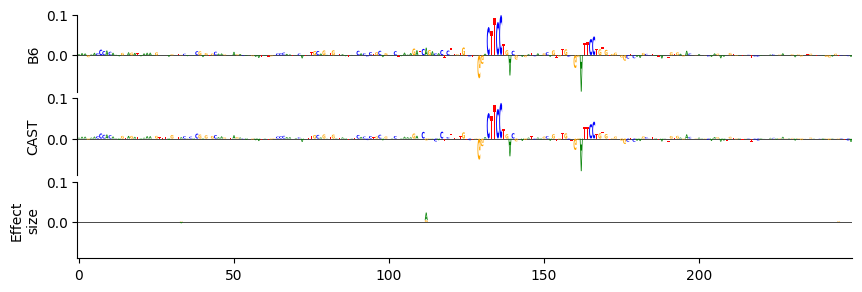

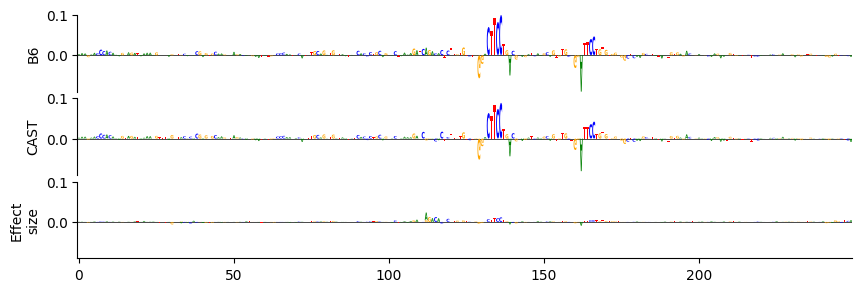

chr16-3988639-3988889mh_ig_sum.jpg
chr16-4503490-4503740 [0.74380875 0.5891931 ]
Ylim [np.float64(-0.032083235681056976), np.float64(0.10131572186946869)]
Ylim [np.float64(-0.032083235681056976), np.float64(0.10131572186946869)]


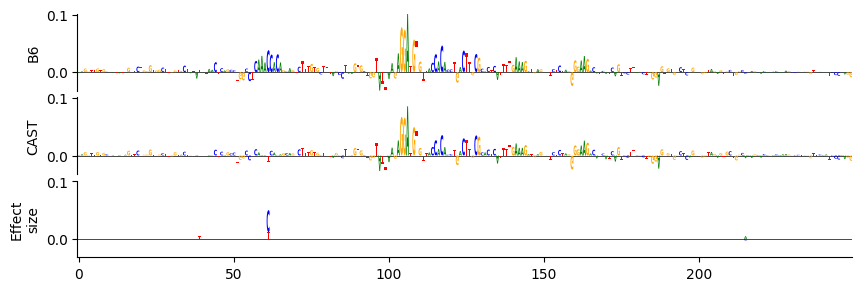

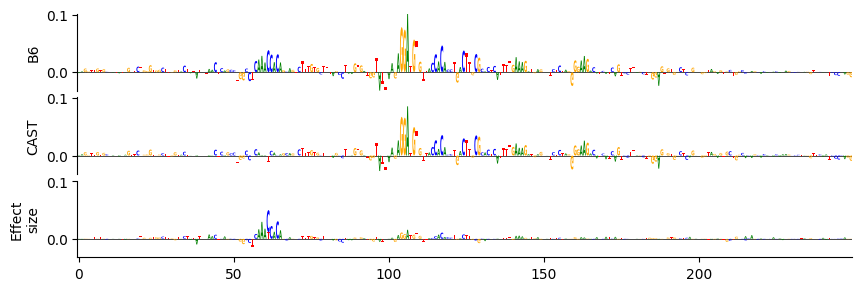

chr16-4503490-4503740mh_ig_sum.jpg
chr16-4781907-4782157 [0.2823753 0.1886582]
Ylim [np.float64(-0.027835454791784286), np.float64(0.04617449268698692)]
Ylim [np.float64(-0.027835454791784286), np.float64(0.04617449268698692)]


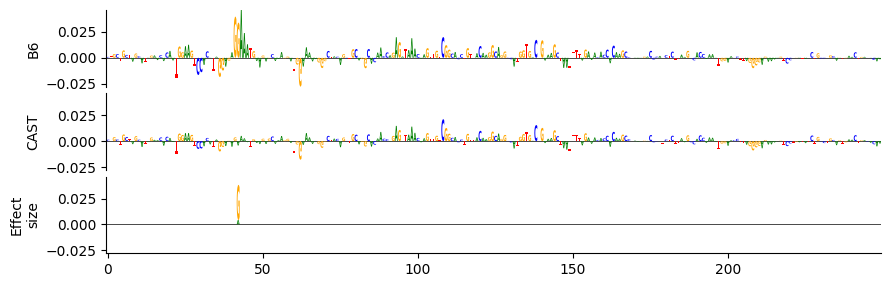

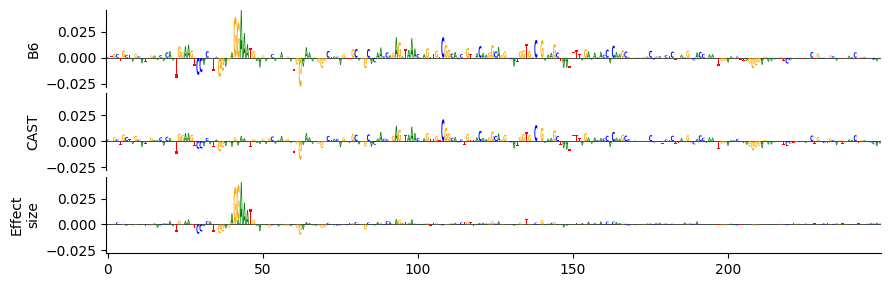

chr16-4781907-4782157mh_ig_sum.jpg
chr16-10392662-10392912 [0.90242714 0.64319336]
Ylim [np.float64(-0.039274897426366806), np.float64(0.10971126705408096)]
Ylim [np.float64(-0.039274897426366806), np.float64(0.10971126705408096)]


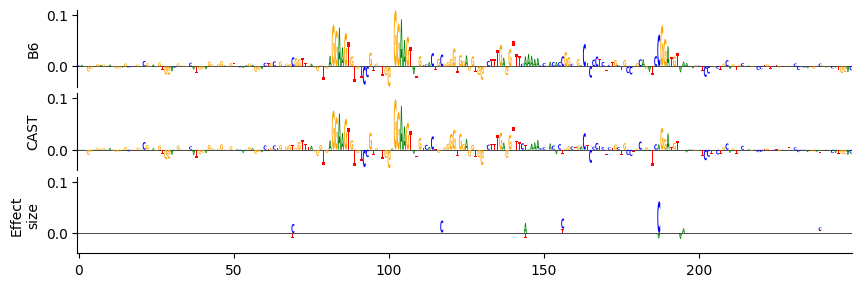

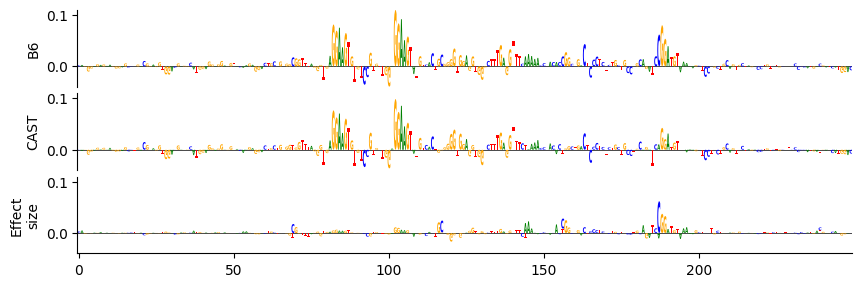

chr16-10392662-10392912mh_ig_sum.jpg
chr16-10541641-10541891 [0.5346766 0.3409358]
Ylim [np.float64(-0.028682764619588852), np.float64(0.0729060247540474)]
Ylim [np.float64(-0.028682764619588852), np.float64(0.0729060247540474)]


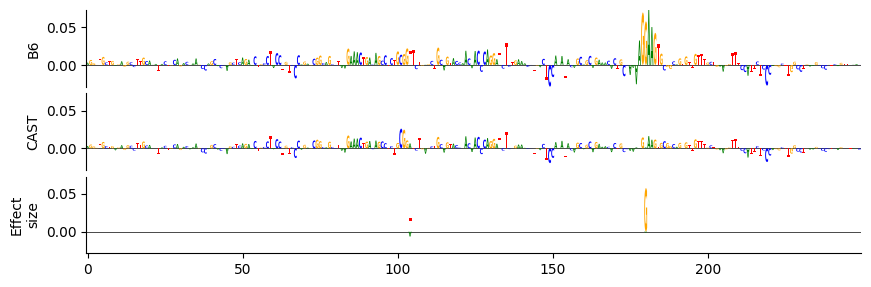

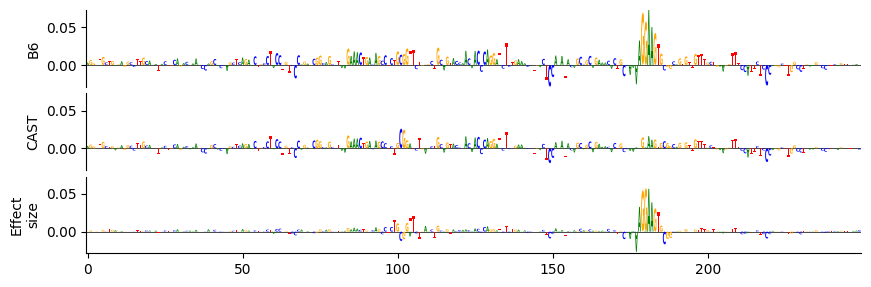

chr16-10541641-10541891mh_ig_sum.jpg
chr16-10740056-10740306 [0.77447146 0.57633823]
Ylim [np.float64(-0.02947383001446724), np.float64(0.06416971236467361)]
Ylim [np.float64(-0.02947383001446724), np.float64(0.06416971236467361)]


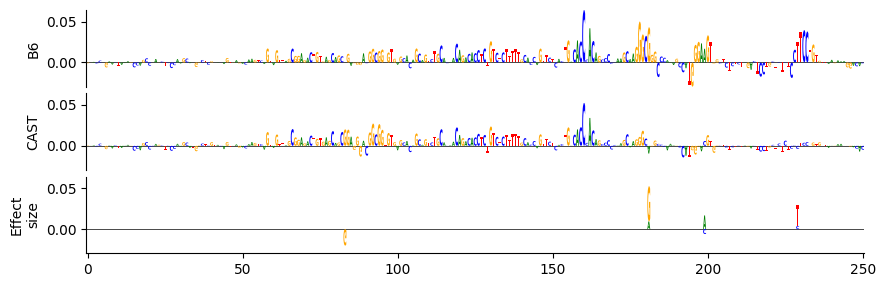

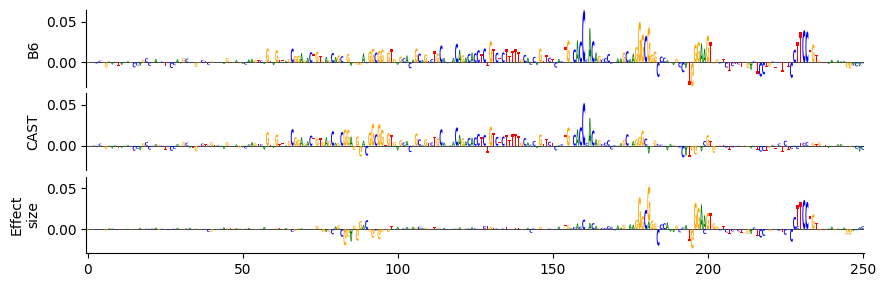

chr16-10740056-10740306mh_ig_sum.jpg
chr16-10840095-10840345 [0.3634079  0.31058526]
Ylim [np.float64(-0.029411910101771355), np.float64(0.06941187381744385)]
Ylim [np.float64(-0.029411910101771355), np.float64(0.06941187381744385)]


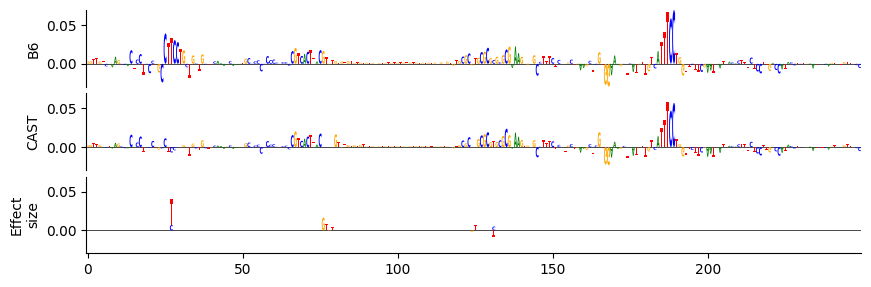

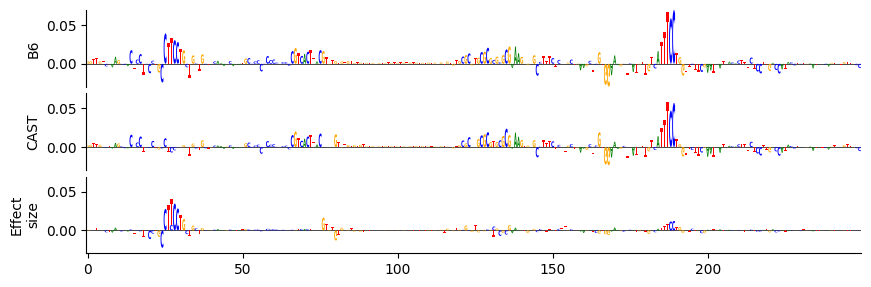

chr16-10840095-10840345mh_ig_sum.jpg
chr16-11519831-11520081 [0.33786753 0.72366583]
Ylim [np.float64(-0.04711126163601875), np.float64(0.09835374355316162)]
Ylim [np.float64(-0.04711126163601875), np.float64(0.09835374355316162)]


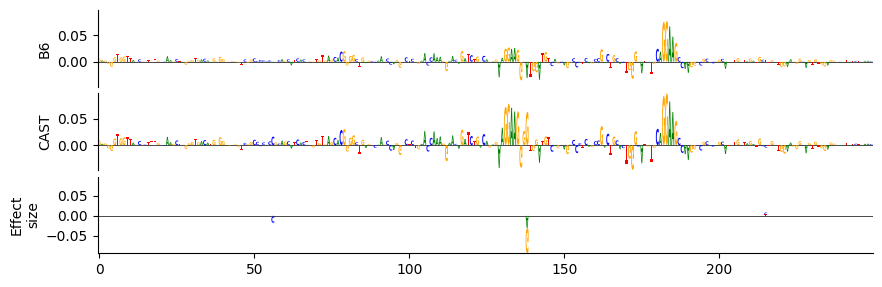

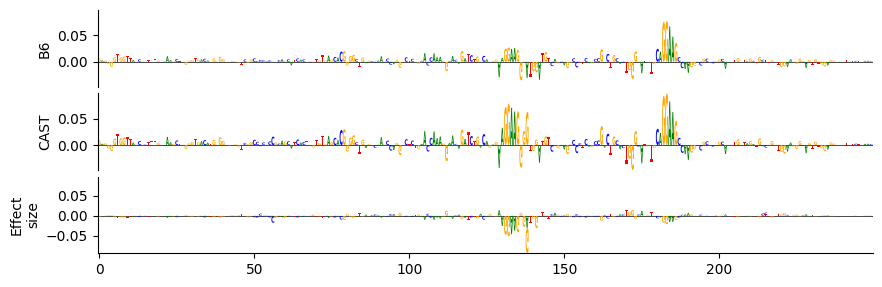

chr16-11519831-11520081mh_ig_sum.jpg
chr16-11631597-11631847 [0.8339107  0.47121638]
Ylim [np.float64(-0.03006301447749138), np.float64(0.15033866465091705)]
Ylim [np.float64(-0.03006301447749138), np.float64(0.15033866465091705)]


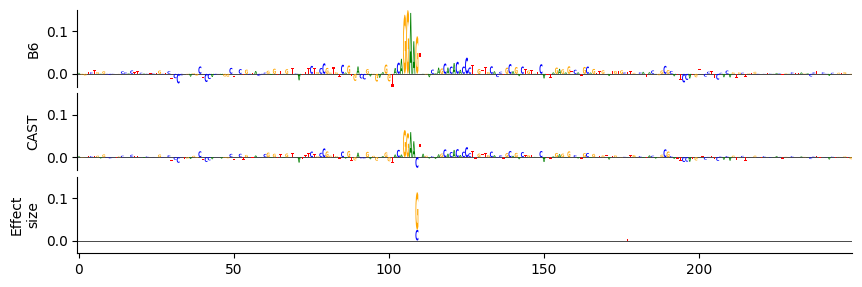

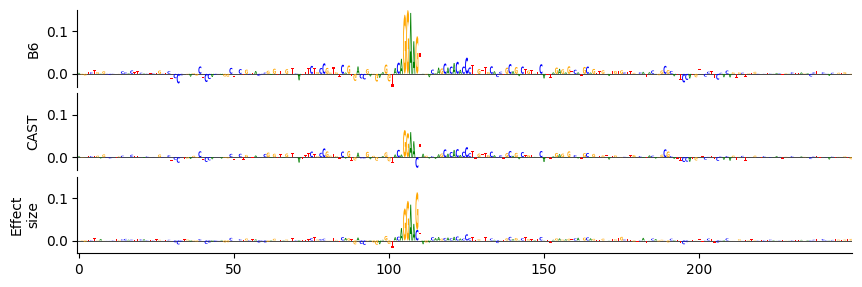

chr16-11631597-11631847mh_ig_sum.jpg
chr16-11658897-11659147 [0.5587002 0.3040716]
Ylim [np.float64(-0.021886229515075684), np.float64(0.10474813729524612)]
Ylim [np.float64(-0.021886229515075684), np.float64(0.10474813729524612)]


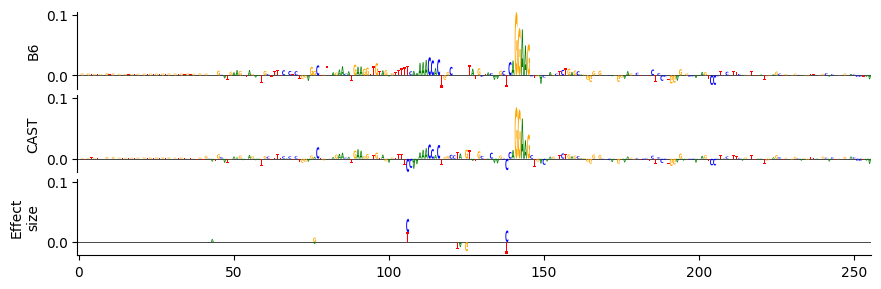

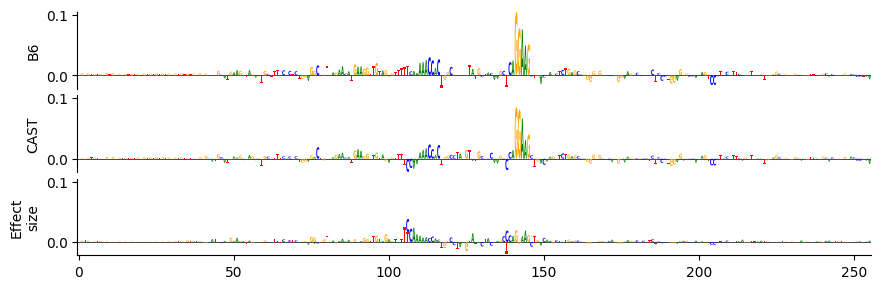

chr16-11658897-11659147mh_ig_sum.jpg
chr16-11659474-11659724 [0.76950246 0.60502136]
Ylim [np.float64(-0.05826231464743614), np.float64(0.10373197495937347)]
Ylim [np.float64(-0.05826231464743614), np.float64(0.10373197495937347)]


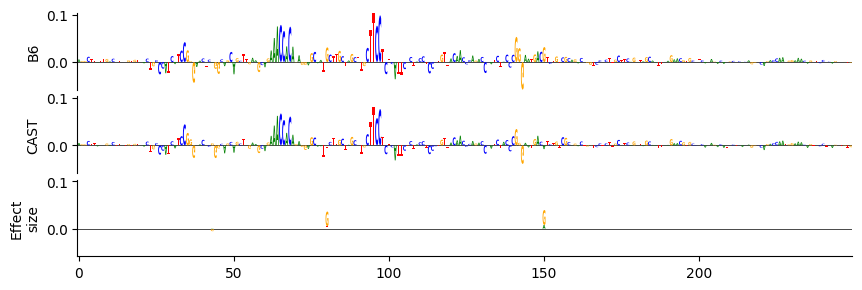

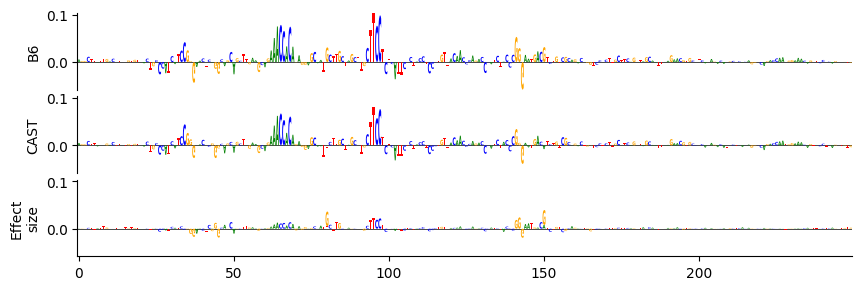

chr16-11659474-11659724mh_ig_sum.jpg
chr16-16234058-16234308 [0.8004794  0.33106354]
Ylim [np.float64(-0.040235936641693115), np.float64(0.12500418722629547)]
Ylim [np.float64(-0.040235936641693115), np.float64(0.12500418722629547)]


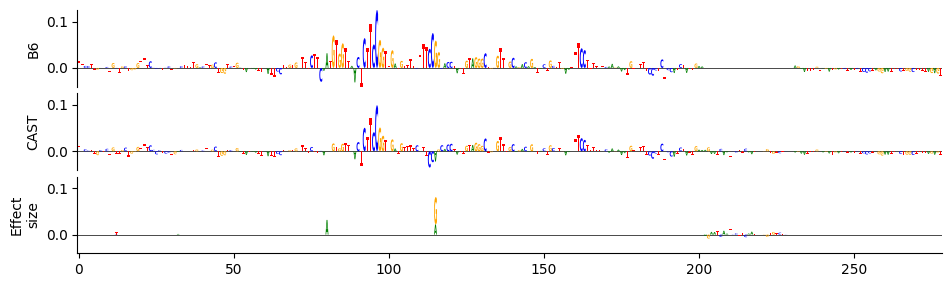

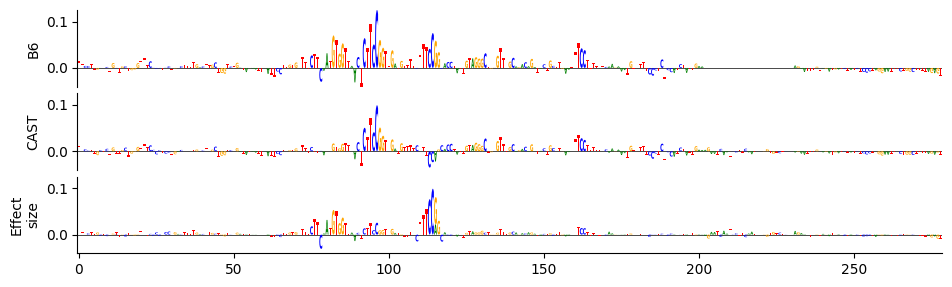

chr16-16234058-16234308mh_ig_sum.jpg
chr16-17553975-17554225 [0.9099072  0.71188515]
Ylim [np.float64(-0.03394712880253792), np.float64(0.1343722939491272)]
Ylim [np.float64(-0.03394712880253792), np.float64(0.1343722939491272)]


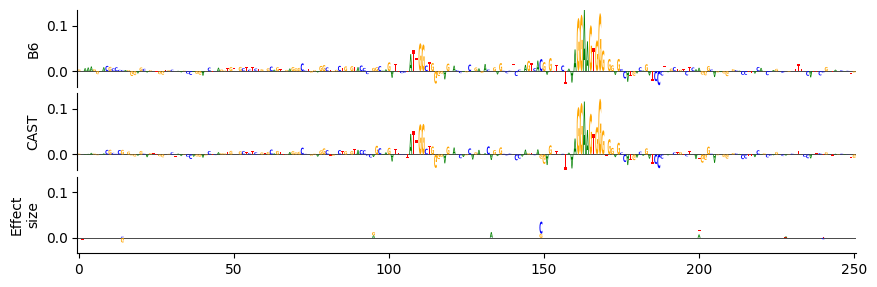

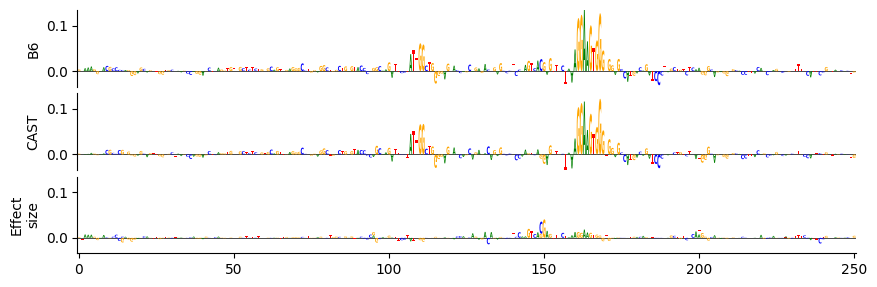

chr16-17553975-17554225mh_ig_sum.jpg
chr16-17554715-17554965 [0.8798042 0.5288172]
Ylim [np.float64(-0.02047838643193245), np.float64(0.0696149468421936)]
Ylim [np.float64(-0.02047838643193245), np.float64(0.0696149468421936)]


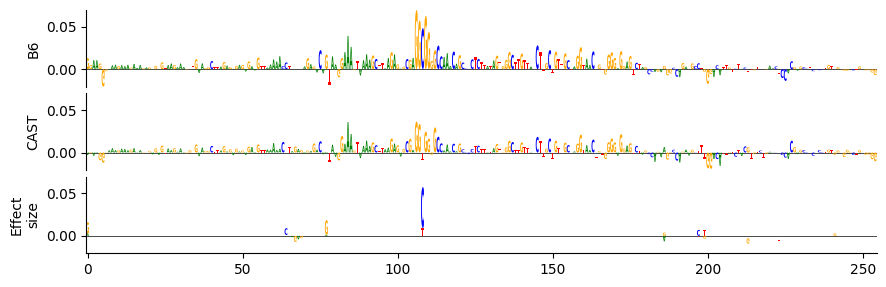

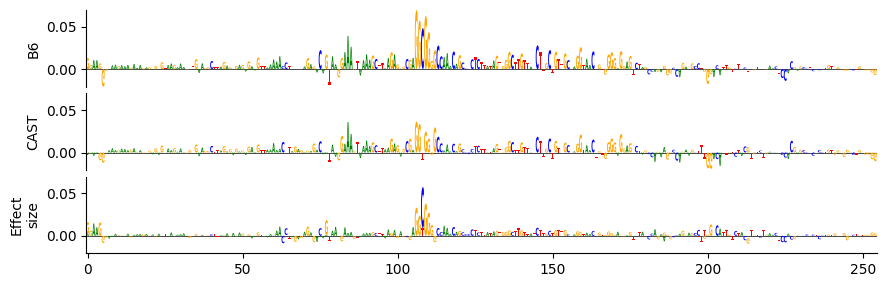

chr16-17554715-17554965mh_ig_sum.jpg
chr16-17858660-17858910 [0.13358766 0.02481388]
Ylim [np.float64(-0.029161686077713966), np.float64(0.05668094754219055)]
Ylim [np.float64(-0.029161686077713966), np.float64(0.05668094754219055)]


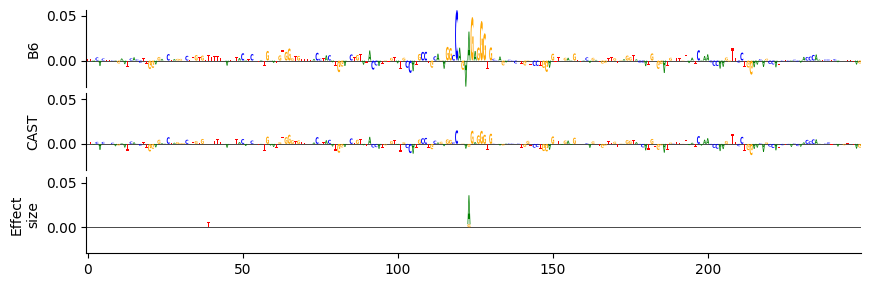

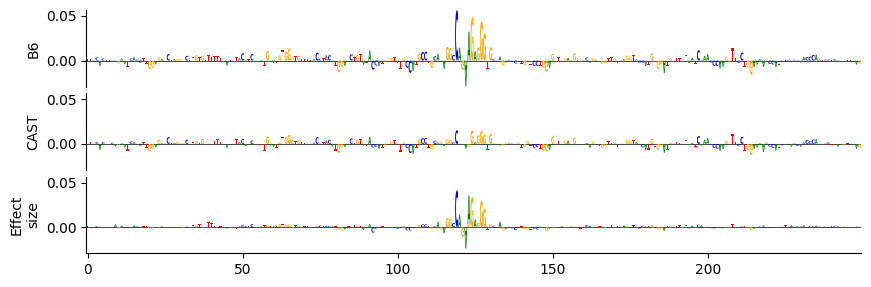

chr16-17858660-17858910mh_ig_sum.jpg
chr16-19884201-19884451 [0.7584697 0.7192887]
Ylim [np.float64(-0.03330158069729805), np.float64(0.06213293969631195)]
Ylim [np.float64(-0.03330158069729805), np.float64(0.06213293969631195)]


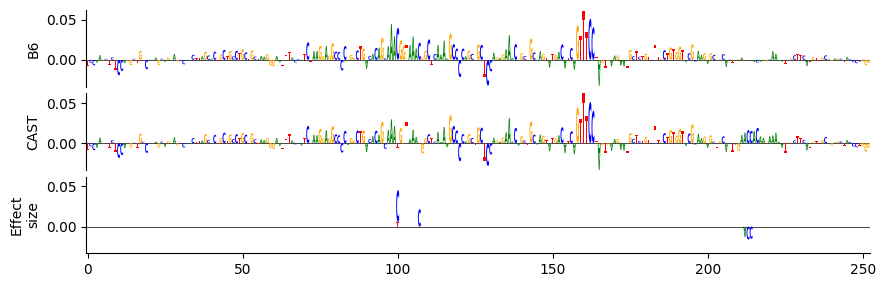

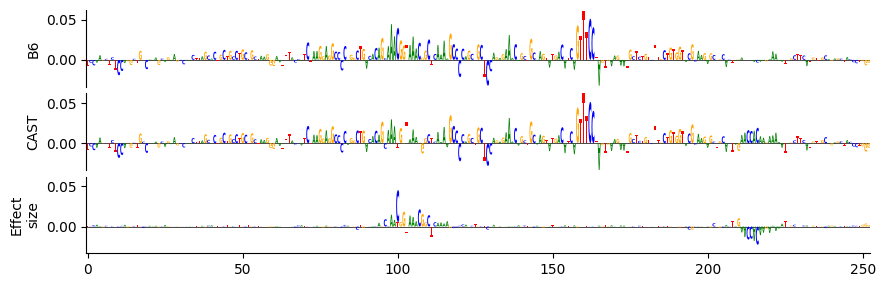

chr16-19884201-19884451mh_ig_sum.jpg
chr16-20014157-20014407 [0.29094934 0.12853792]
Ylim [np.float64(-0.033866915851831436), np.float64(0.0874158963561058)]
Ylim [np.float64(-0.033866915851831436), np.float64(0.0874158963561058)]


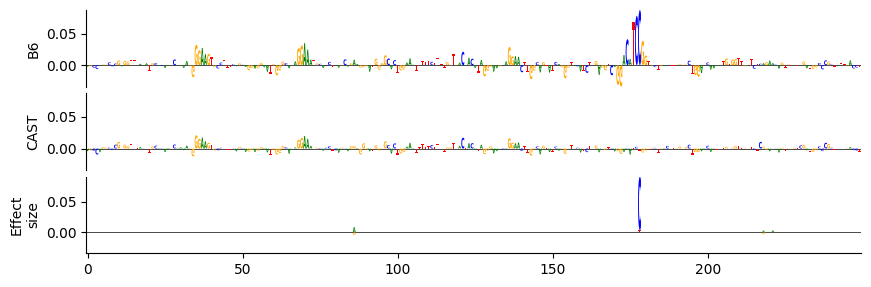

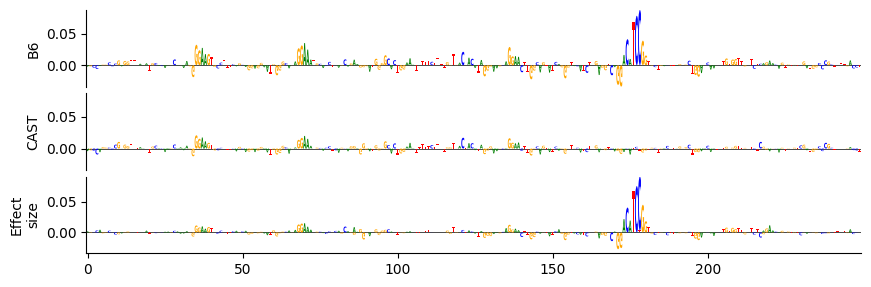

chr16-20014157-20014407mh_ig_sum.jpg
chr16-20185445-20185695 [0.9980705 0.3429834]
Ylim [np.float64(-0.05591630935668945), np.float64(0.12043407559394836)]
Ylim [np.float64(-0.05591630935668945), np.float64(0.12043407559394836)]


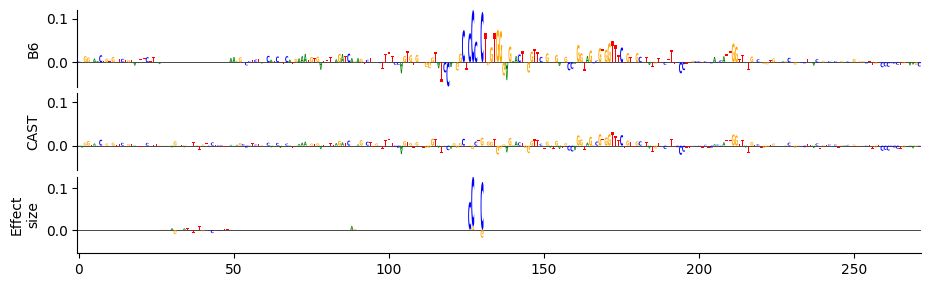

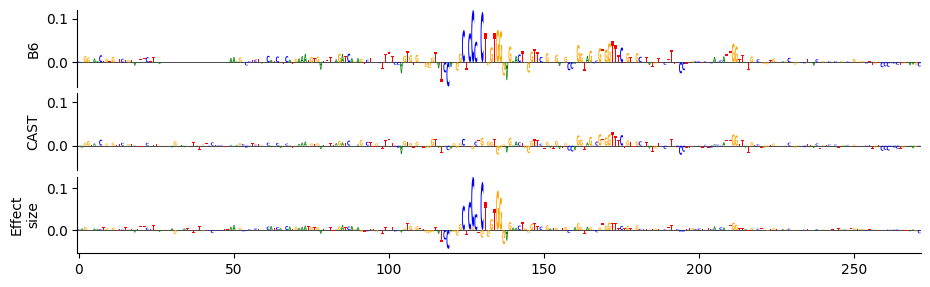

chr16-20185445-20185695mh_ig_sum.jpg
chr16-20830113-20830363 [1.5002583  0.46105203]
Ylim [np.float64(-0.04203781485557556), np.float64(0.20159059762954712)]
Ylim [np.float64(-0.04203781485557556), np.float64(0.20159059762954712)]


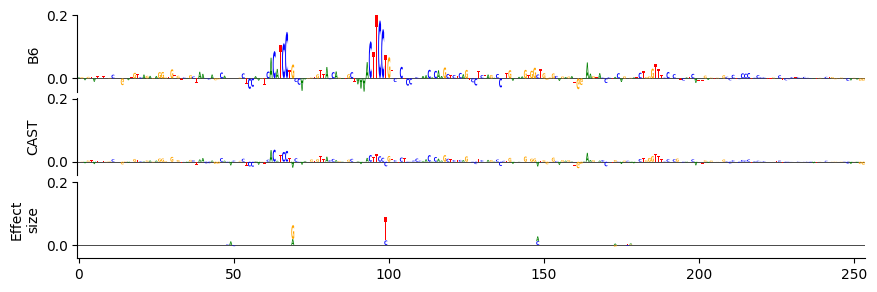

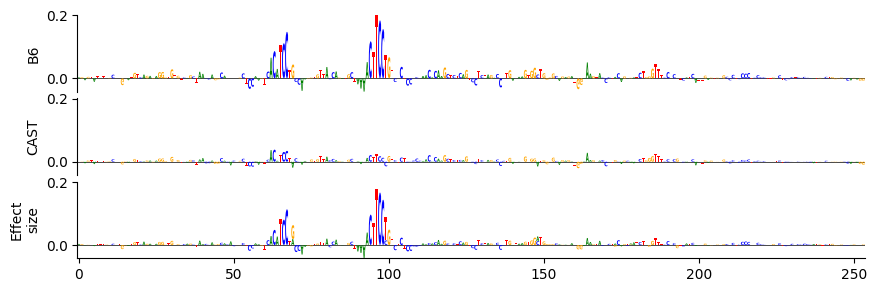

chr16-20830113-20830363mh_ig_sum.jpg
chr16-22075113-22075363 [1.4419451 0.7729114]
Ylim [np.float64(-0.06242283433675766), np.float64(0.161921888589859)]
Ylim [np.float64(-0.06242283433675766), np.float64(0.161921888589859)]


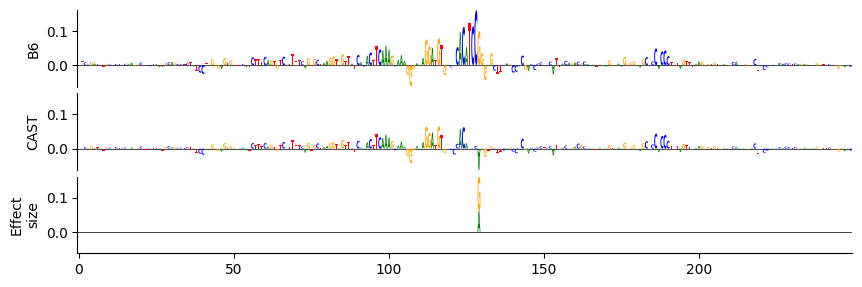

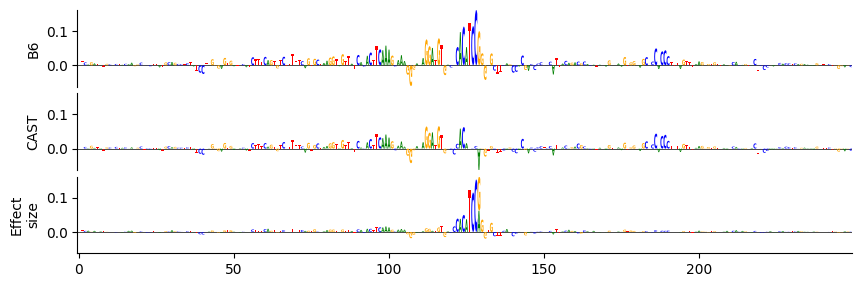

chr16-22075113-22075363mh_ig_sum.jpg
chr16-23152153-23152403 [0.30273846 0.14809191]
Ylim [np.float64(-0.015982255339622498), np.float64(0.0382218100130558)]
Ylim [np.float64(-0.015982255339622498), np.float64(0.0382218100130558)]


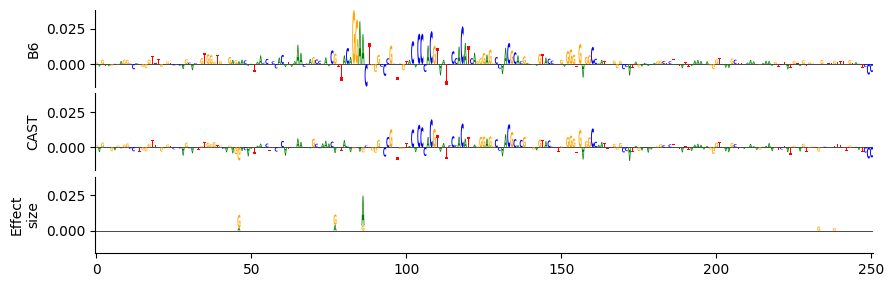

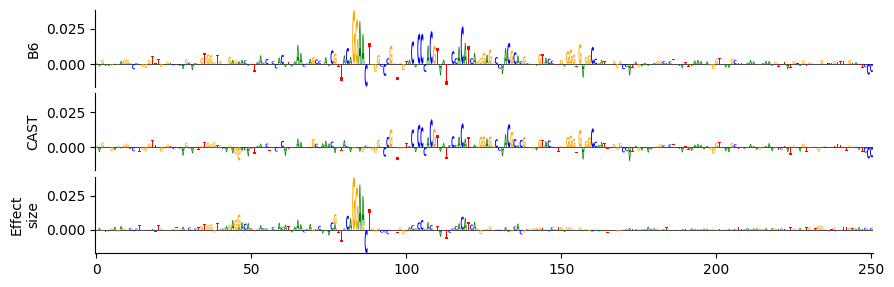

chr16-23152153-23152403mh_ig_sum.jpg
chr16-23362440-23362690 [0.43677482 0.10198656]
Ylim [np.float64(-0.04407080262899399), np.float64(0.16757288575172424)]
Ylim [np.float64(-0.04407080262899399), np.float64(0.16757288575172424)]


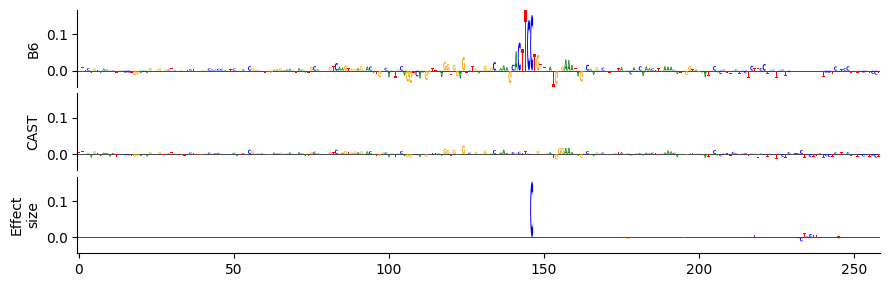

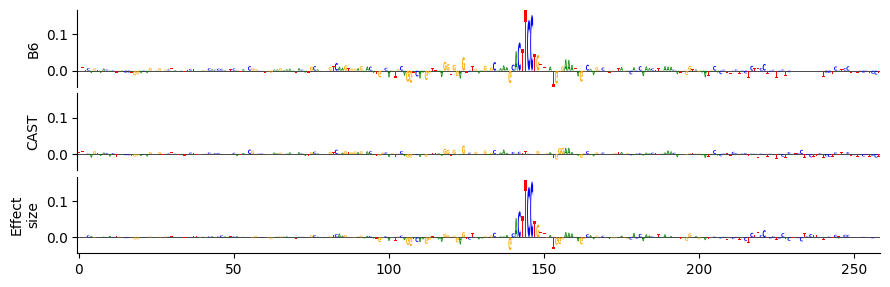

chr16-23362440-23362690mh_ig_sum.jpg
chr16-24129654-24129904 [0.9642426 0.903114 ]
Ylim [np.float64(-0.04608751833438873), np.float64(0.16527210175991058)]
Ylim [np.float64(-0.04608751833438873), np.float64(0.16527210175991058)]


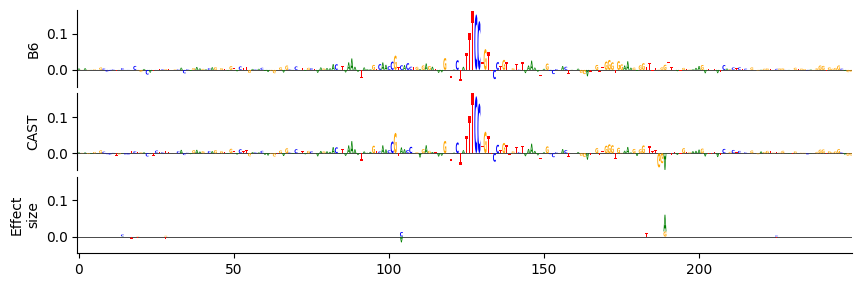

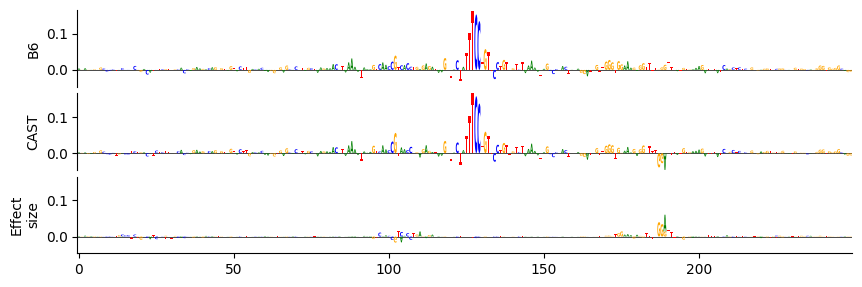

chr16-24129654-24129904mh_ig_sum.jpg
chr16-24193638-24193888 [0.42916226 0.40727517]
Ylim [np.float64(-0.02568448893725872), np.float64(0.08891884237527847)]
Ylim [np.float64(-0.02568448893725872), np.float64(0.08891884237527847)]


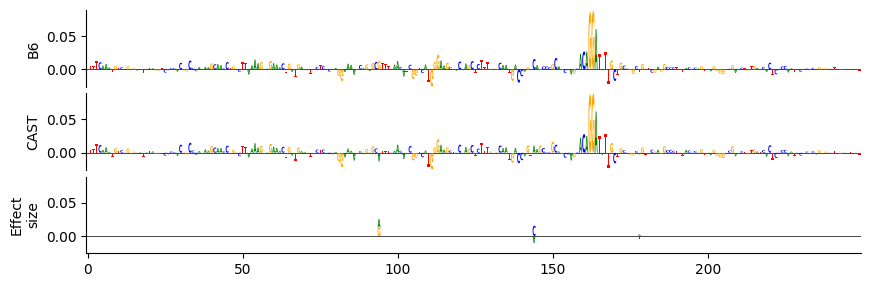

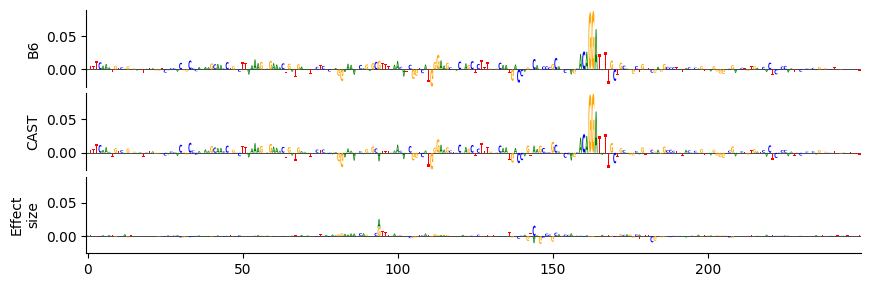

chr16-24193638-24193888mh_ig_sum.jpg
chr16-24391198-24391448 [0.7206407  0.35884356]
Ylim [np.float64(-0.04342753812670708), np.float64(0.16316956281661987)]
Ylim [np.float64(-0.04342753812670708), np.float64(0.16316956281661987)]


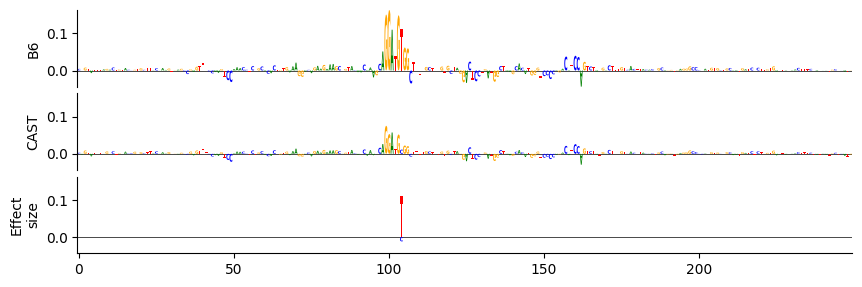

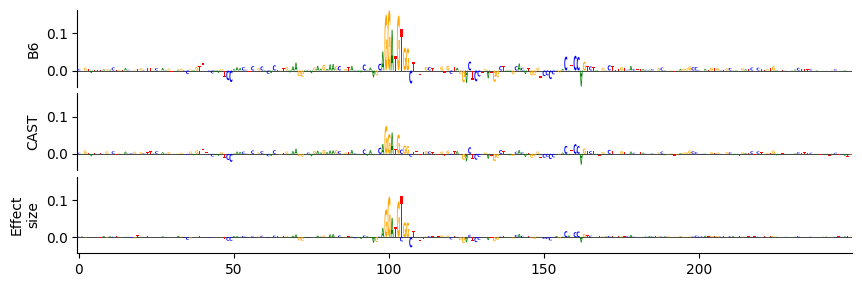

chr16-24391198-24391448mh_ig_sum.jpg
chr16-24518852-24519102 [0.9182082  0.65574646]
Ylim [np.float64(-0.06077713891863823), np.float64(0.08665604144334793)]
Ylim [np.float64(-0.06077713891863823), np.float64(0.08665604144334793)]


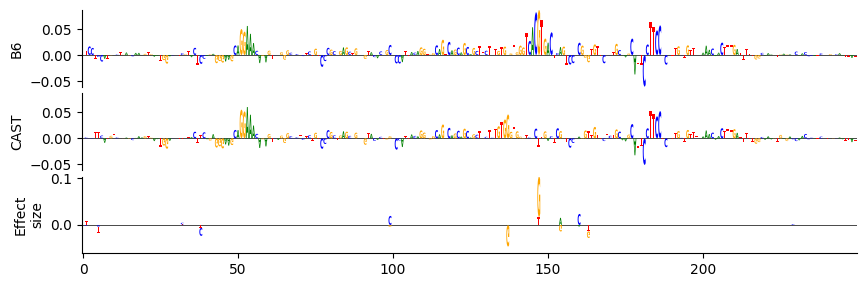

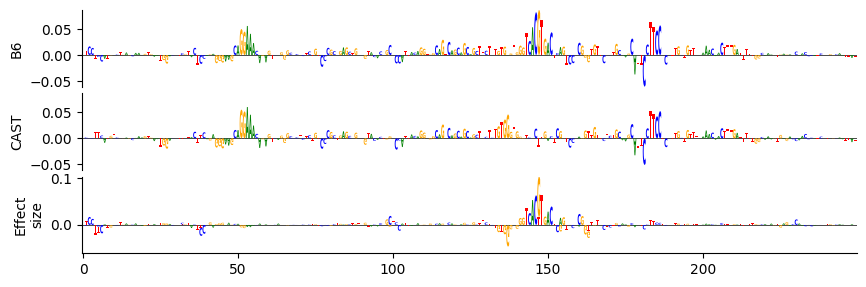

chr16-24518852-24519102mh_ig_sum.jpg
chr16-25423839-25424089 [0.83476764 0.6680989 ]
Ylim [np.float64(-0.02995646931231022), np.float64(0.09910246729850769)]
Ylim [np.float64(-0.02995646931231022), np.float64(0.09910246729850769)]


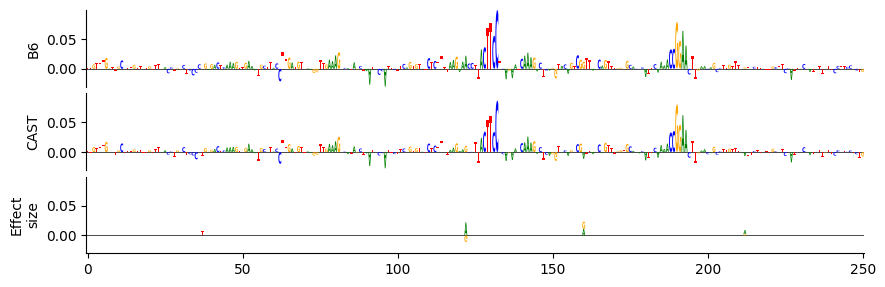

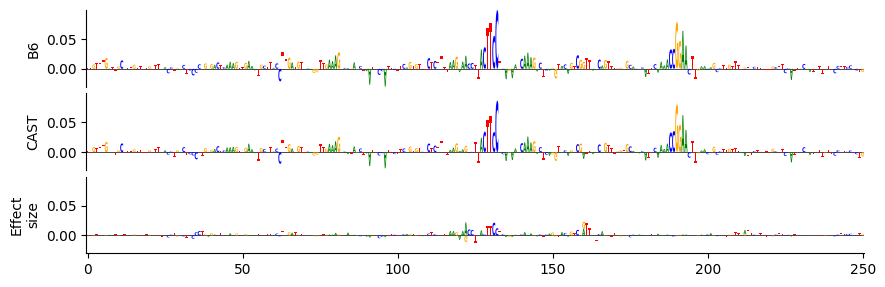

chr16-25423839-25424089mh_ig_sum.jpg
chr16-27395306-27395556 [0.68128115 0.483281  ]
Ylim [np.float64(-0.027592003345489502), np.float64(0.11595965176820755)]
Ylim [np.float64(-0.027592003345489502), np.float64(0.11595965176820755)]


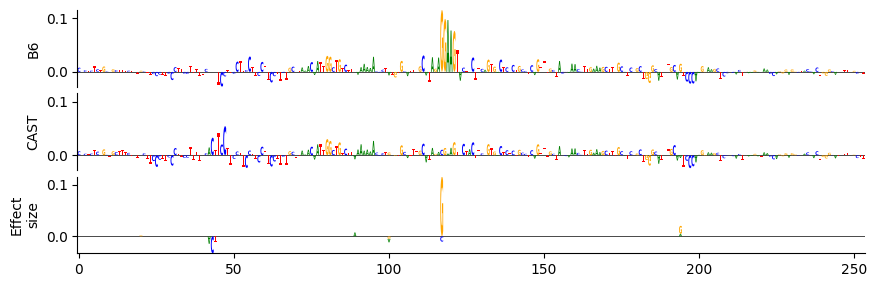

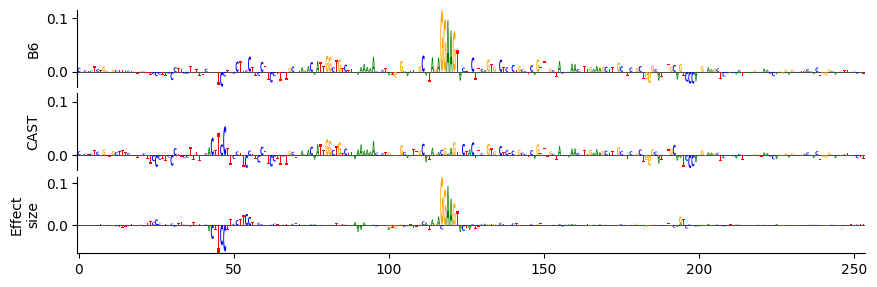

chr16-27395306-27395556mh_ig_sum.jpg
chr16-30177842-30178092 [0.51180494 0.41924667]
Ylim [np.float64(-0.051818303763866425), np.float64(0.09339078515768051)]
Ylim [np.float64(-0.051818303763866425), np.float64(0.09339078515768051)]


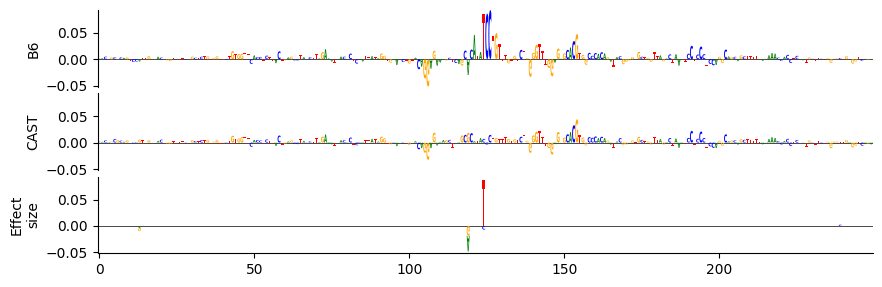

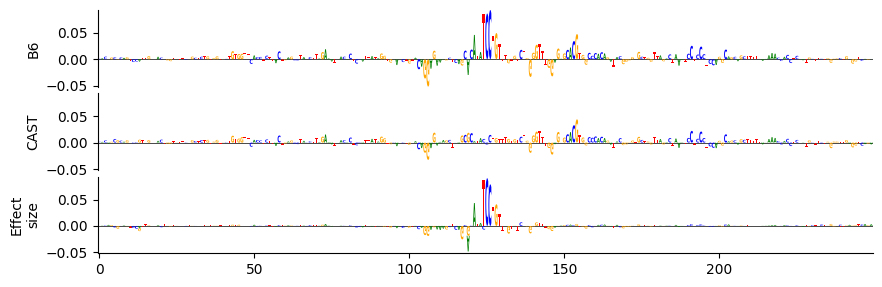

chr16-30177842-30178092mh_ig_sum.jpg
chr16-30284023-30284273 [0.448398  0.3819943]
Ylim [np.float64(-0.03319469839334488), np.float64(0.06751515716314316)]
Ylim [np.float64(-0.03319469839334488), np.float64(0.06751515716314316)]


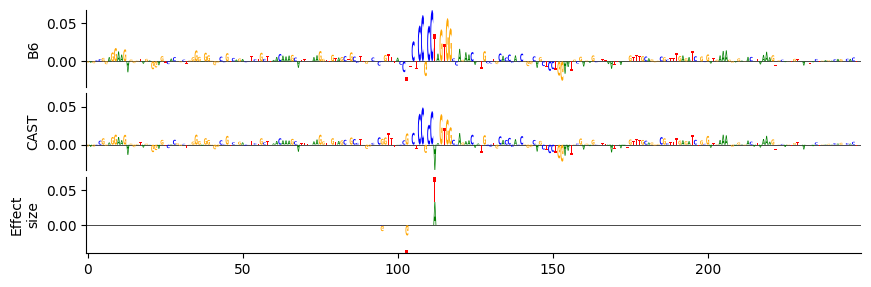

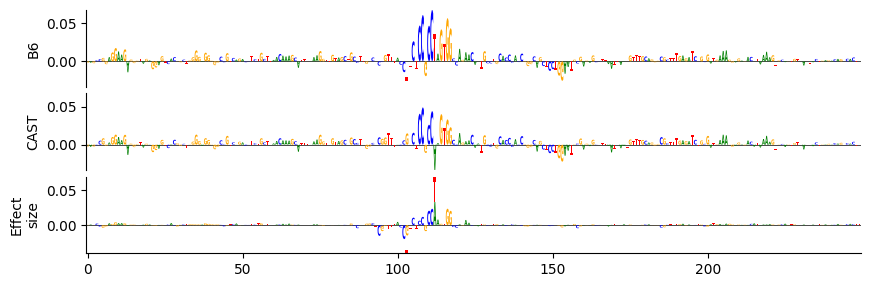

chr16-30284023-30284273mh_ig_sum.jpg
chr16-31029829-31030079 [0.14779559 0.37546545]
Ylim [np.float64(-0.04047779738903046), np.float64(0.08023187518119812)]
Ylim [np.float64(-0.04047779738903046), np.float64(0.08023187518119812)]


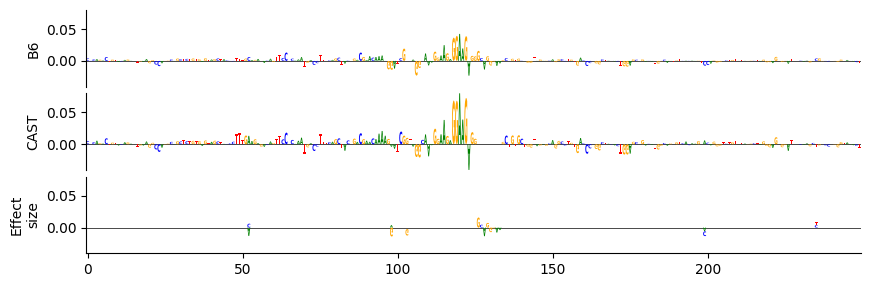

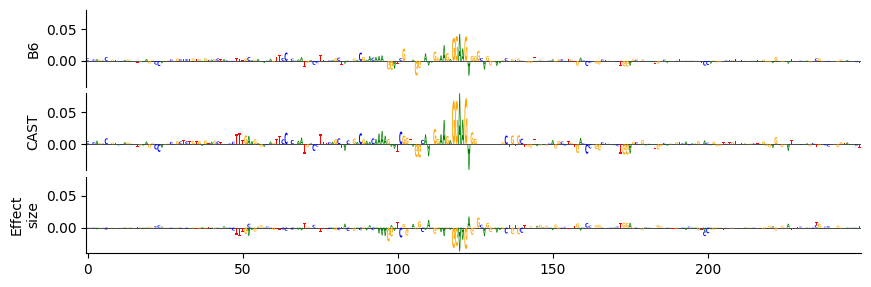

chr16-31029829-31030079mh_ig_sum.jpg
chr16-31035326-31035576 [1.1347564 0.9456565]
Ylim [np.float64(-0.047695793211460114), np.float64(0.16425764560699463)]
Ylim [np.float64(-0.047695793211460114), np.float64(0.16425764560699463)]


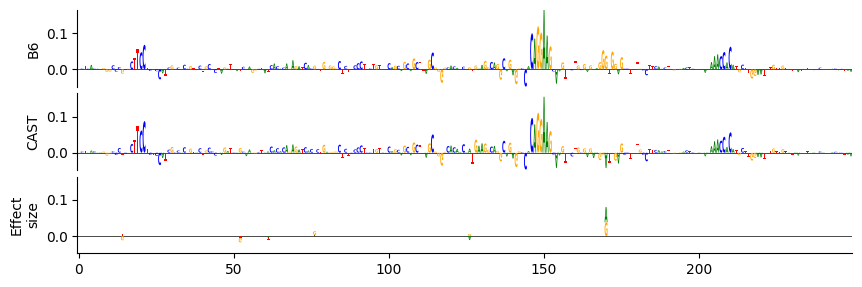

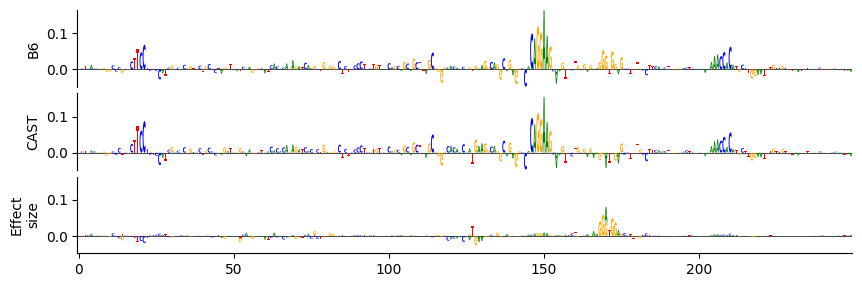

chr16-31035326-31035576mh_ig_sum.jpg
chr16-32550149-32550399 [0.964146  0.8277189]
Ylim [np.float64(-0.0638633519411087), np.float64(0.14184585213661194)]
Ylim [np.float64(-0.0638633519411087), np.float64(0.14184585213661194)]


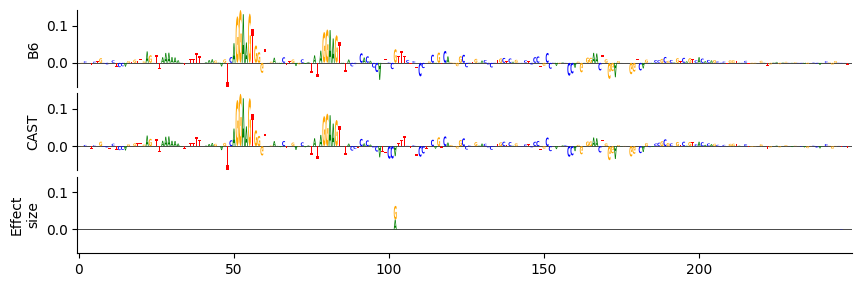

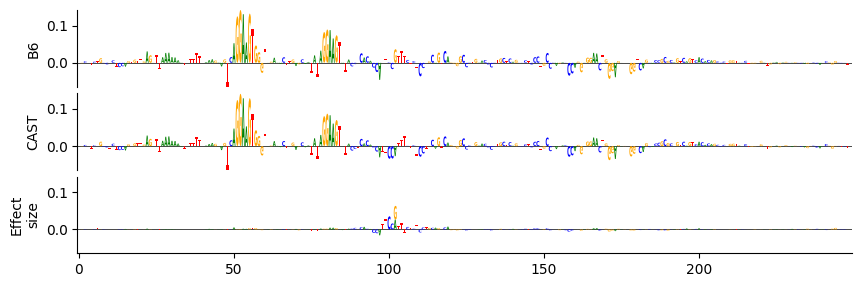

chr16-32550149-32550399mh_ig_sum.jpg
chr16-32632740-32632990 [0.26590982 0.17987299]
Ylim [np.float64(-0.008627861738204956), np.float64(0.022223742678761482)]
Ylim [np.float64(-0.008627861738204956), np.float64(0.022223742678761482)]


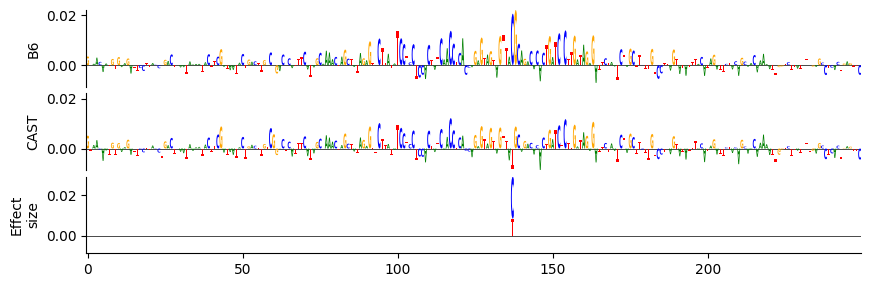

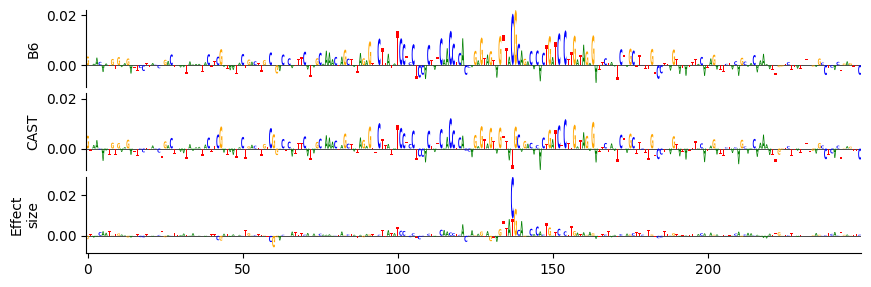

chr16-32632740-32632990mh_ig_sum.jpg
chr16-32750485-32750735 [0.8537533  0.26309592]
Ylim [np.float64(-0.03698816895484924), np.float64(0.12928488850593567)]
Ylim [np.float64(-0.03698816895484924), np.float64(0.12928488850593567)]


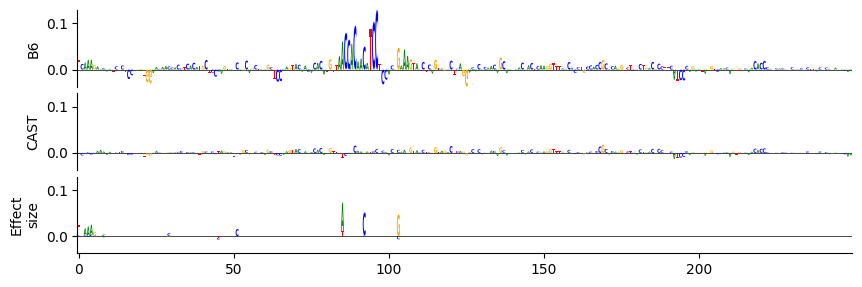

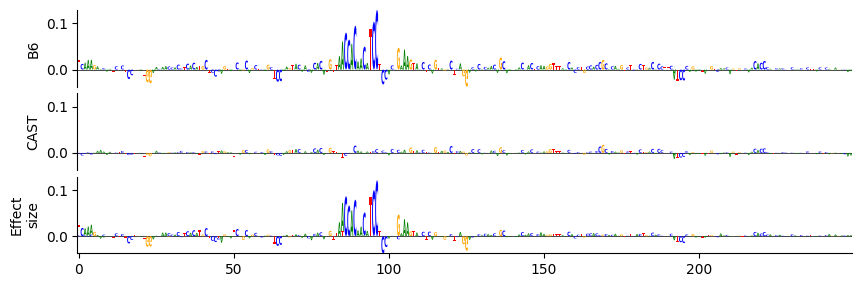

chr16-32750485-32750735mh_ig_sum.jpg
chr16-32947468-32947718 [0.50824094 0.24162269]
Ylim [np.float64(-0.027323013171553612), np.float64(0.07058882713317871)]
Ylim [np.float64(-0.027323013171553612), np.float64(0.07058882713317871)]


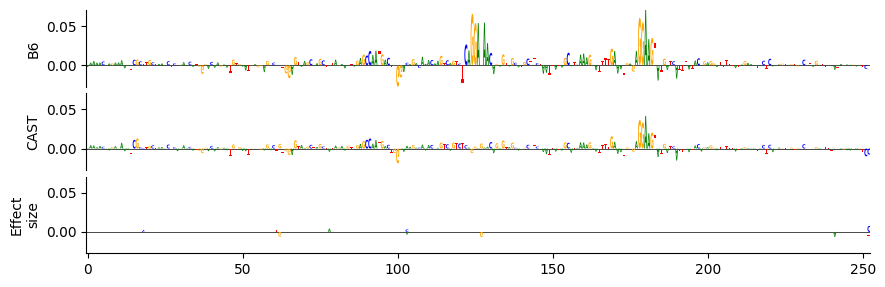

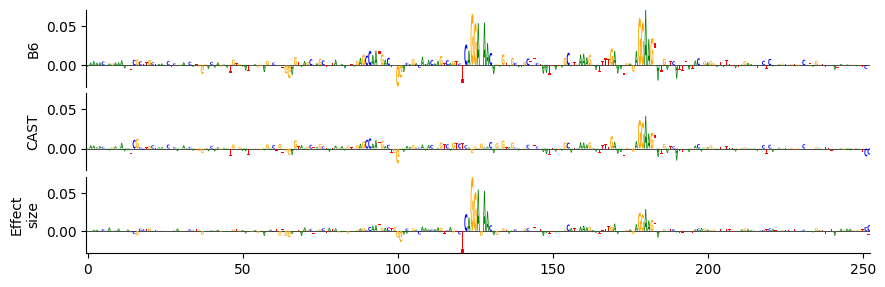

chr16-32947468-32947718mh_ig_sum.jpg
chr16-32953874-32954124 [0.5591027  0.45126218]
Ylim [np.float64(-0.05671760439872742), np.float64(0.10772968828678131)]
Ylim [np.float64(-0.05671760439872742), np.float64(0.10772968828678131)]


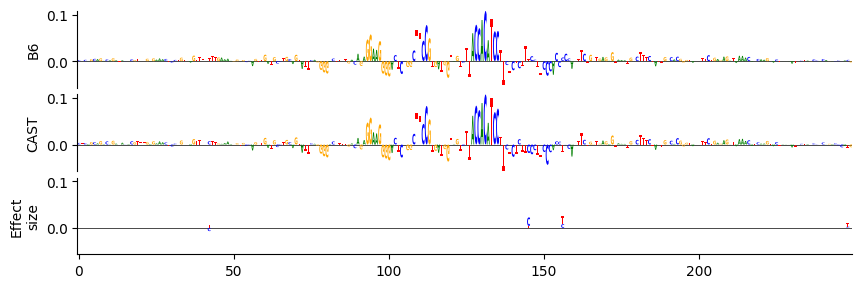

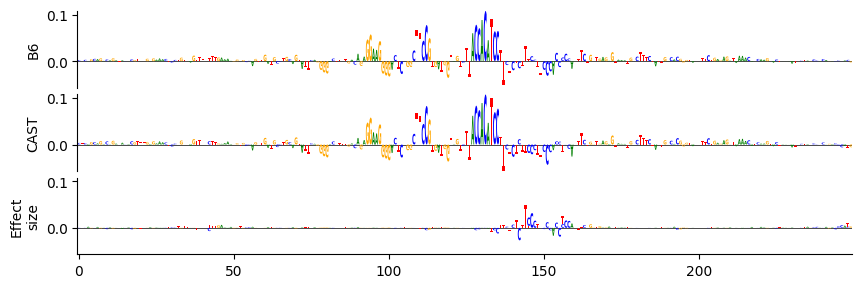

chr16-32953874-32954124mh_ig_sum.jpg
chr16-33077307-33077557 [0.613494   0.39719173]
Ylim [np.float64(-0.03231013938784599), np.float64(0.06812702119350433)]
Ylim [np.float64(-0.03231013938784599), np.float64(0.06812702119350433)]


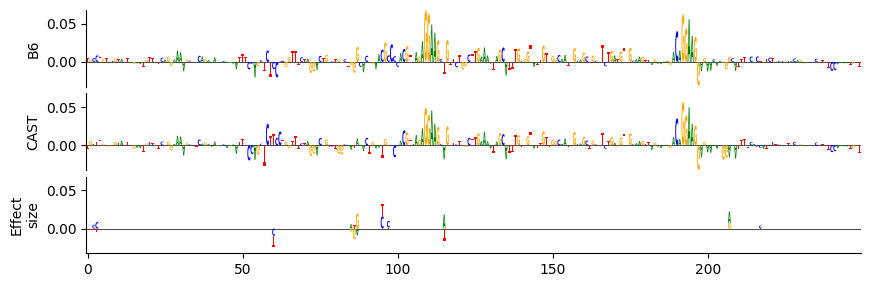

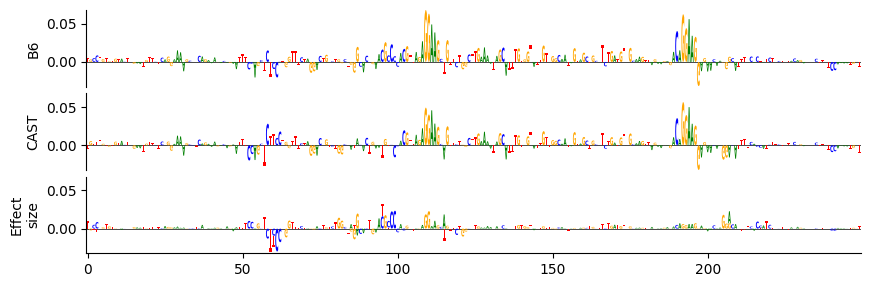

chr16-33077307-33077557mh_ig_sum.jpg
chr16-33167619-33167869 [ 0.08278753 -0.00777294]
Ylim [np.float64(-0.018044373020529747), np.float64(0.025224847719073296)]
Ylim [np.float64(-0.018044373020529747), np.float64(0.025224847719073296)]


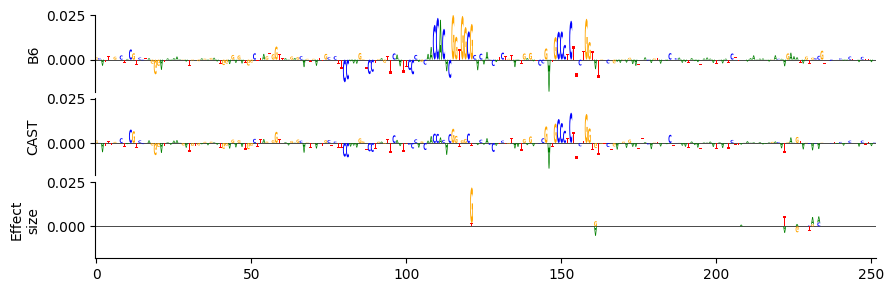

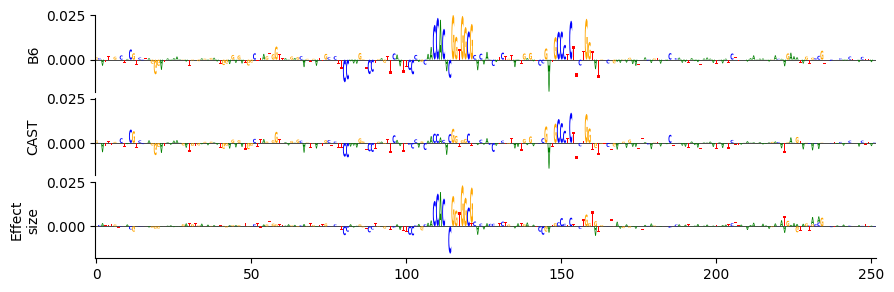

chr16-33167619-33167869mh_ig_sum.jpg
chr16-33449378-33449628 [1.1064014 0.5210661]
Ylim [np.float64(-0.03480106219649315), np.float64(0.15411841869354248)]
Ylim [np.float64(-0.03480106219649315), np.float64(0.15411841869354248)]


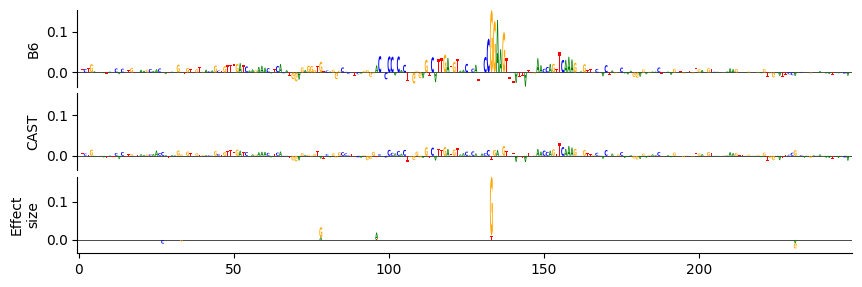

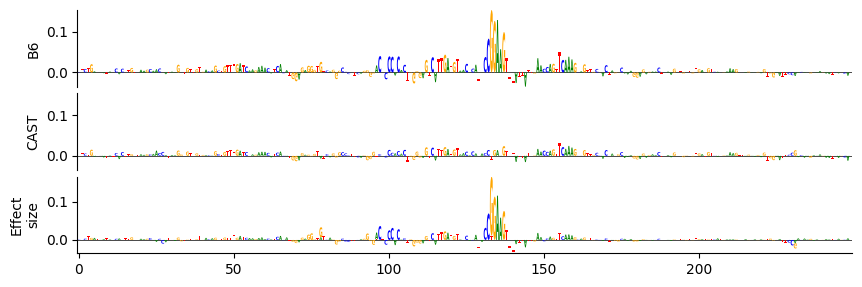

chr16-33449378-33449628mh_ig_sum.jpg
chr16-33606881-33607131 [0.3175348  0.19904992]
Ylim [np.float64(-0.0198510829359293), np.float64(0.06046023964881897)]
Ylim [np.float64(-0.0198510829359293), np.float64(0.06046023964881897)]


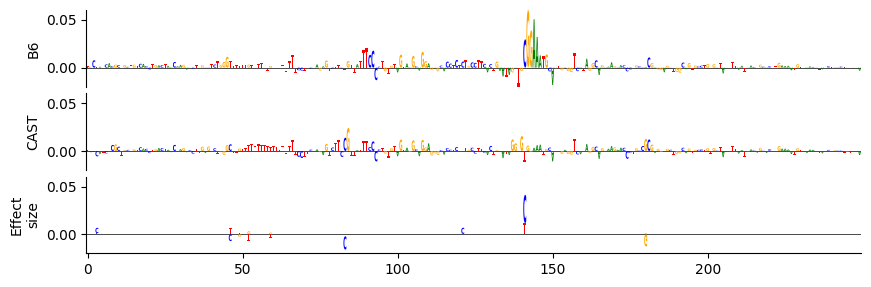

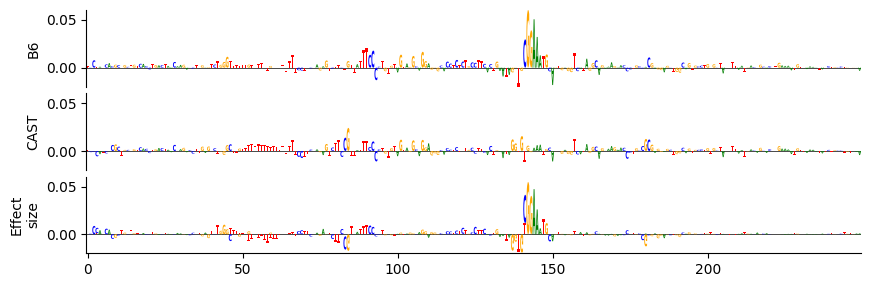

chr16-33606881-33607131mh_ig_sum.jpg
chr16-33607253-33607503 [0.2268656  0.16994506]
Ylim [np.float64(-0.029956400394439697), np.float64(0.032510530203580856)]
Ylim [np.float64(-0.029956400394439697), np.float64(0.032510530203580856)]


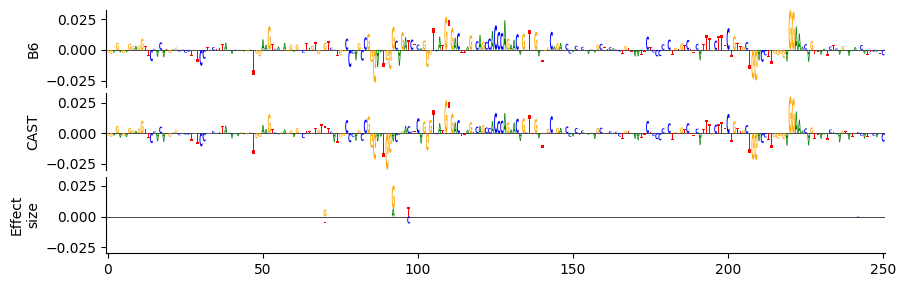

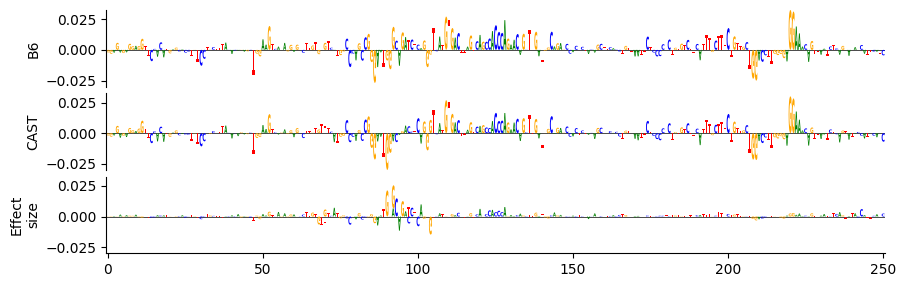

chr16-33607253-33607503mh_ig_sum.jpg
chr16-33609909-33610159 [0.25861353 0.16471097]
Ylim [np.float64(-0.02514934539794922), np.float64(0.030997971072793007)]
Ylim [np.float64(-0.02514934539794922), np.float64(0.030997971072793007)]


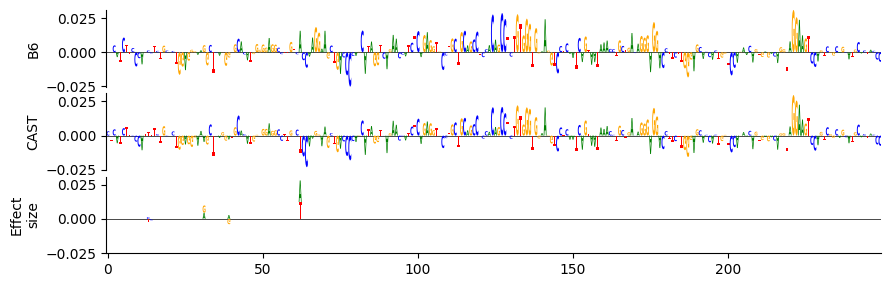

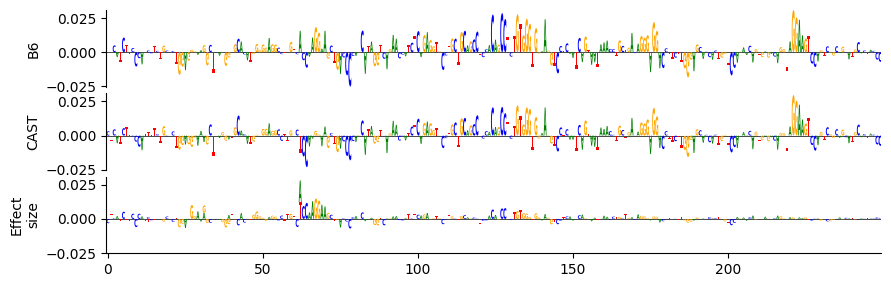

chr16-33609909-33610159mh_ig_sum.jpg
chr16-33621349-33621599 [0.23469967 0.16543889]
Ylim [np.float64(-0.025156453251838684), np.float64(0.0605388805270195)]
Ylim [np.float64(-0.025156453251838684), np.float64(0.0605388805270195)]


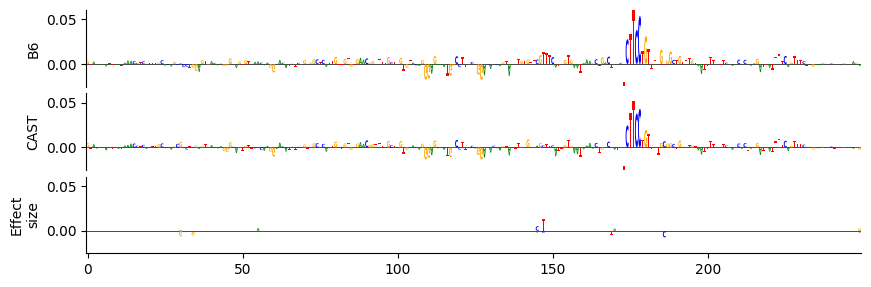

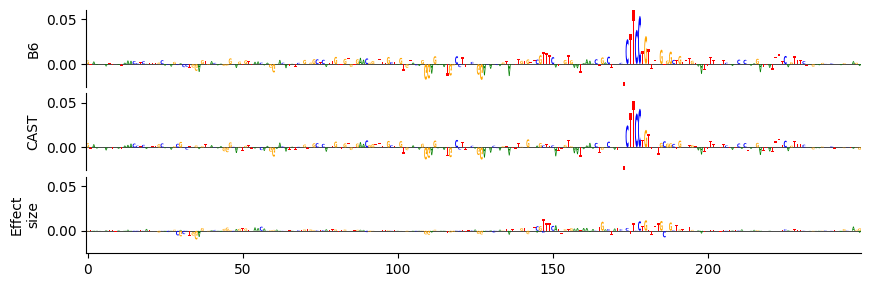

chr16-33621349-33621599mh_ig_sum.jpg
chr16-33713568-33713818 [0.25739598 0.1629897 ]
Ylim [np.float64(-0.02706899121403694), np.float64(0.028302840888500214)]
Ylim [np.float64(-0.02706899121403694), np.float64(0.028302840888500214)]


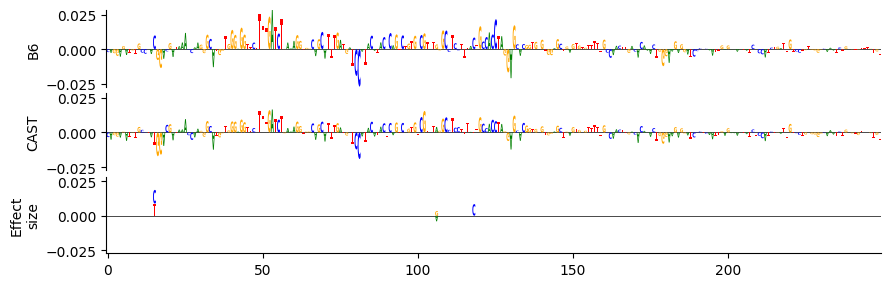

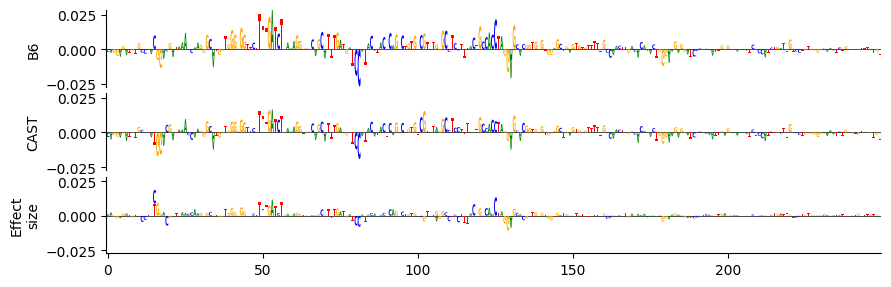

chr16-33713568-33713818mh_ig_sum.jpg
chr16-33747416-33747666 [0.91107905 0.5732867 ]
Ylim [np.float64(-0.0632515549659729), np.float64(0.10431724041700363)]
Ylim [np.float64(-0.0632515549659729), np.float64(0.10431724041700363)]


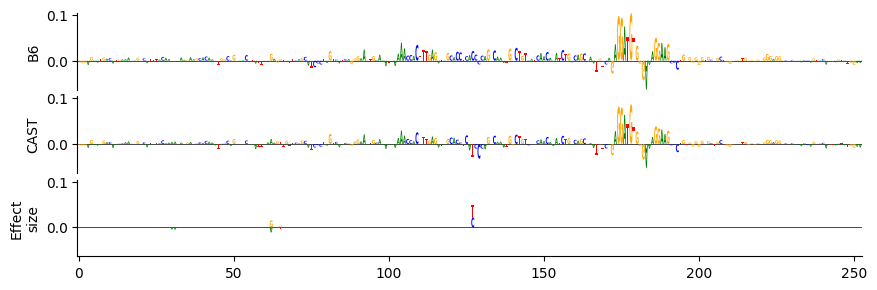

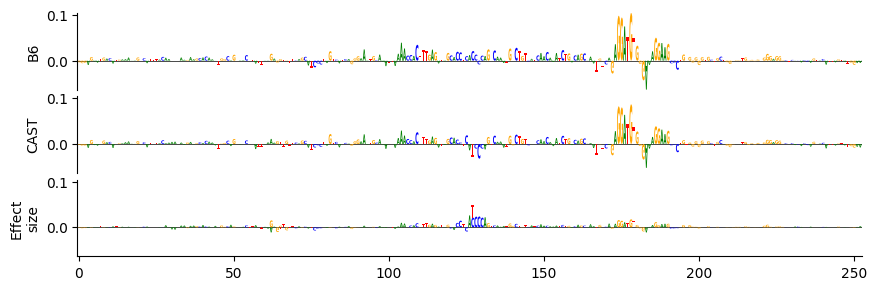

chr16-33747416-33747666mh_ig_sum.jpg
chr16-33755397-33755647 [0.5324945  0.39488992]
Ylim [np.float64(-0.025527844205498695), np.float64(0.05331262946128845)]
Ylim [np.float64(-0.025527844205498695), np.float64(0.05331262946128845)]


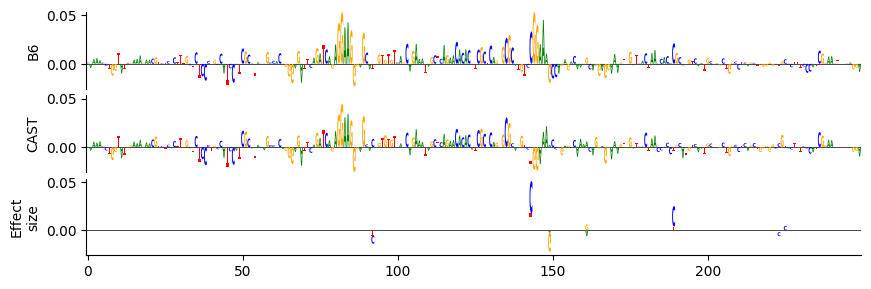

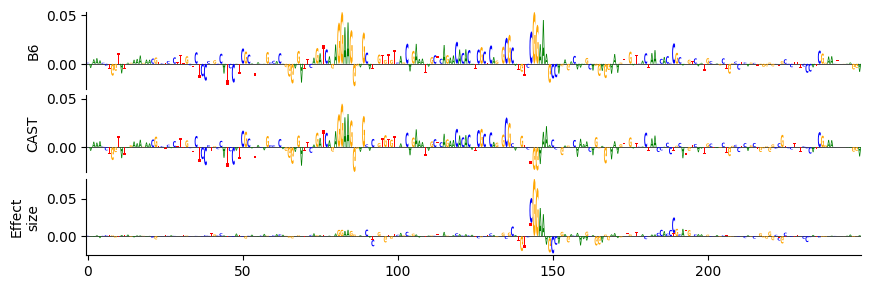

chr16-33755397-33755647mh_ig_sum.jpg
chr16-34120868-34121118 [1.6699692 1.2805045]
Ylim [np.float64(-0.0475299097597599), np.float64(0.12274596840143204)]
Ylim [np.float64(-0.0475299097597599), np.float64(0.12274596840143204)]


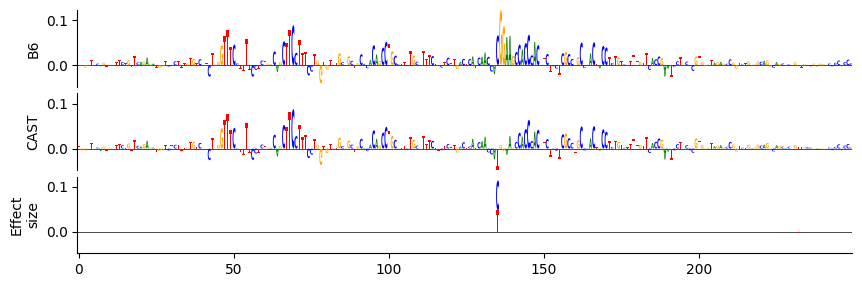

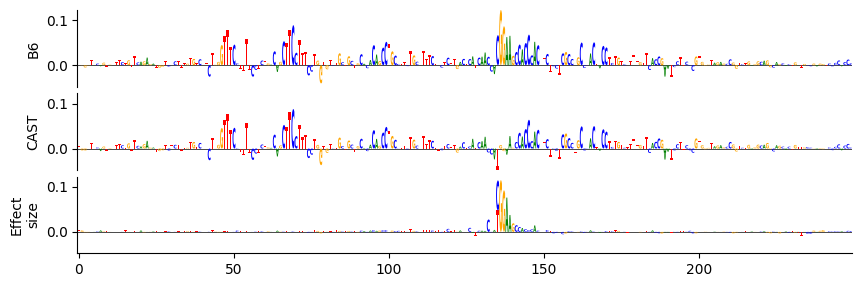

chr16-34120868-34121118mh_ig_sum.jpg
chr16-35696155-35696405 [1.1152446 1.1015065]
Ylim [np.float64(-0.05182630568742752), np.float64(0.16387882828712463)]
Ylim [np.float64(-0.05182630568742752), np.float64(0.16387882828712463)]


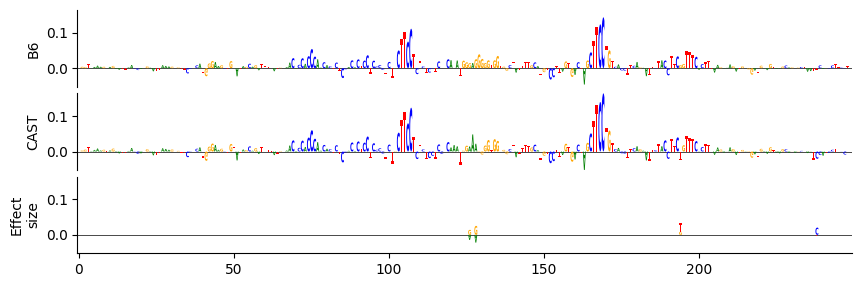

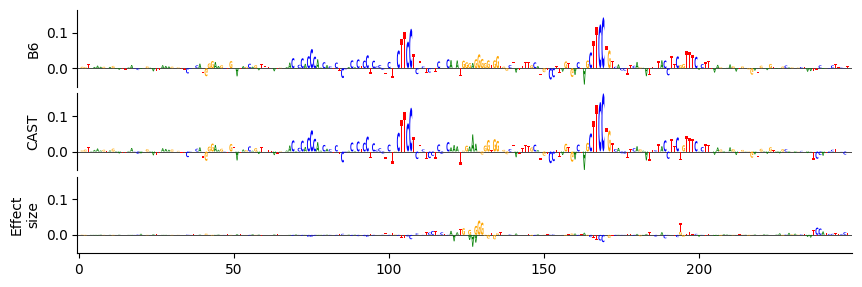

chr16-35696155-35696405mh_ig_sum.jpg
chr16-36540855-36541105 [1.5443919 0.881688 ]
Ylim [np.float64(-0.06442335247993469), np.float64(0.21009200811386108)]
Ylim [np.float64(-0.06442335247993469), np.float64(0.21009200811386108)]


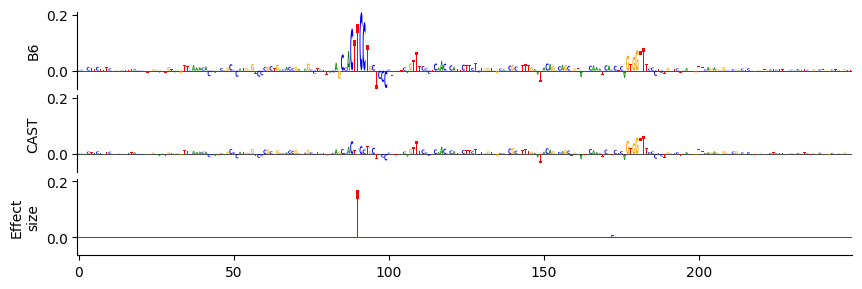

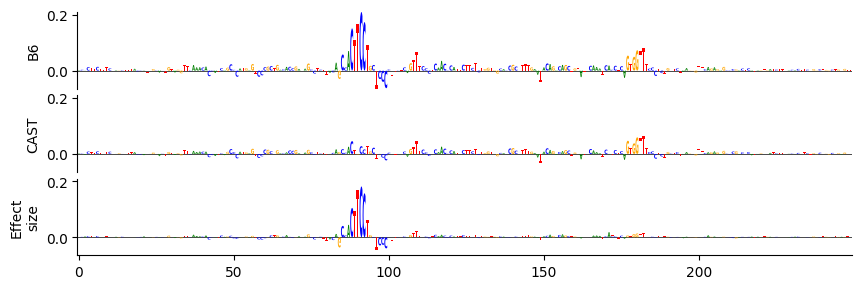

chr16-36540855-36541105mh_ig_sum.jpg
chr16-38793542-38793792 [0.6748823  0.39701694]
Ylim [np.float64(-0.032546453177928925), np.float64(0.10018686950206757)]
Ylim [np.float64(-0.032546453177928925), np.float64(0.10018686950206757)]


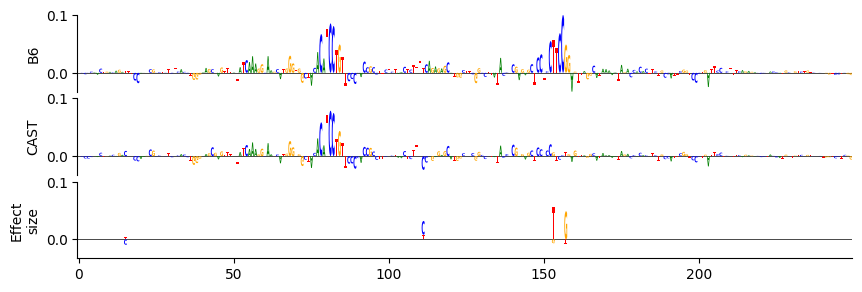

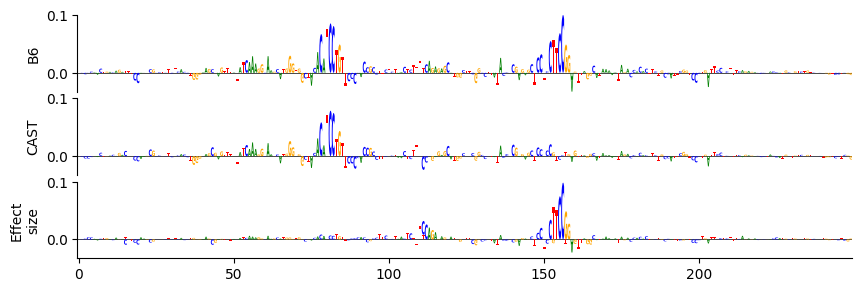

chr16-38793542-38793792mh_ig_sum.jpg
chr16-43647050-43647300 [1.233069  0.8110775]
Ylim [np.float64(-0.06101025640964508), np.float64(0.13532677292823792)]
Ylim [np.float64(-0.06101025640964508), np.float64(0.13532677292823792)]


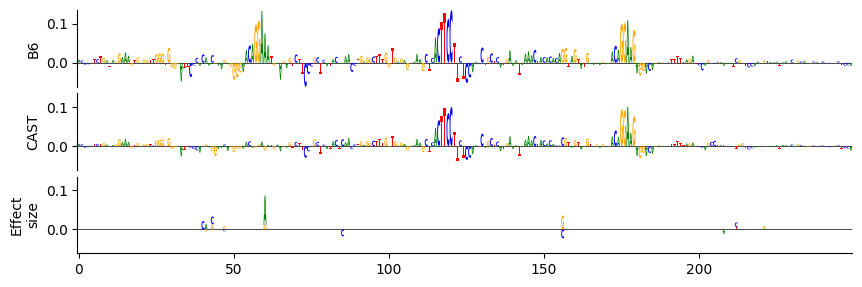

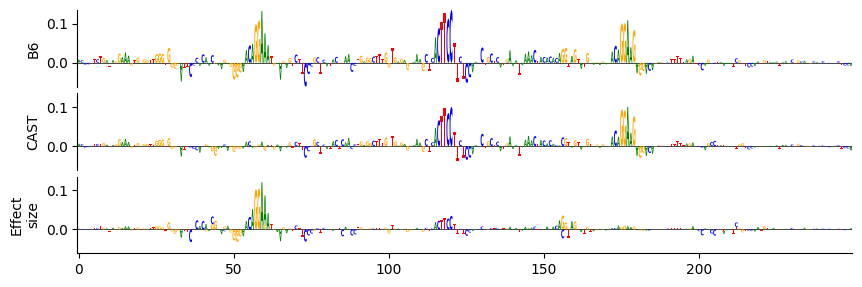

chr16-43647050-43647300mh_ig_sum.jpg
chr16-44018368-44018618 [0.6751377 0.5134427]
Ylim [np.float64(-0.09495973587036133), np.float64(0.10906264185905457)]
Ylim [np.float64(-0.09495973587036133), np.float64(0.10906264185905457)]


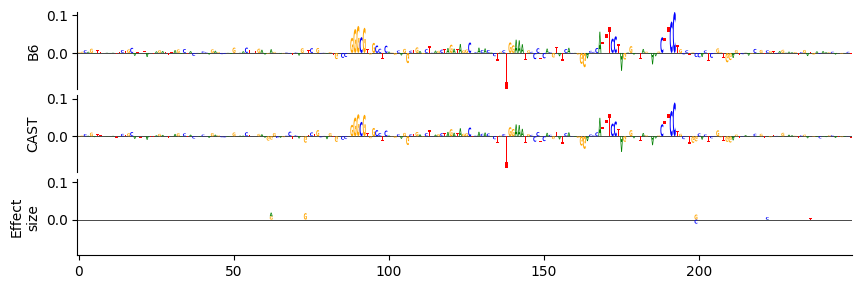

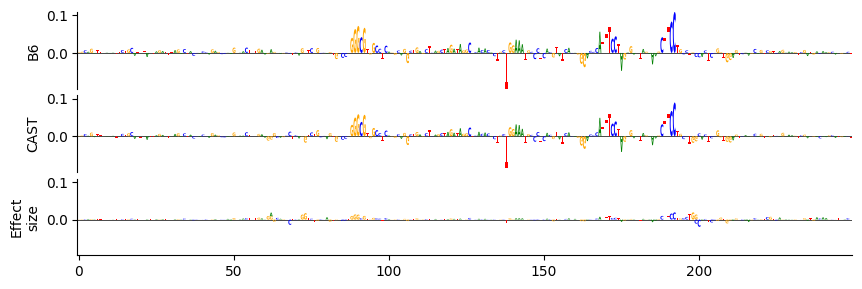

chr16-44018368-44018618mh_ig_sum.jpg
chr16-44313437-44313687 [0.547777   0.43714103]
Ylim [np.float64(-0.05675848573446274), np.float64(0.10846203565597534)]
Ylim [np.float64(-0.05675848573446274), np.float64(0.10846203565597534)]


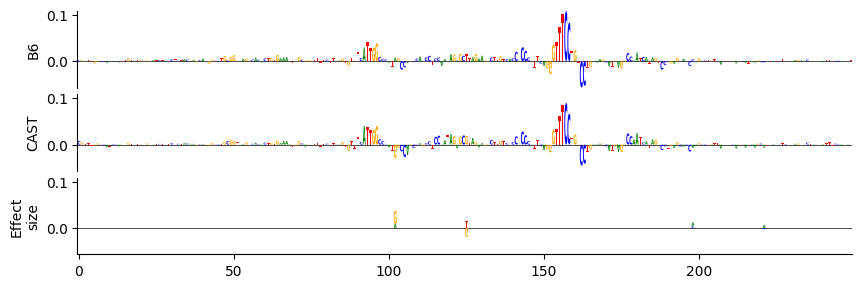

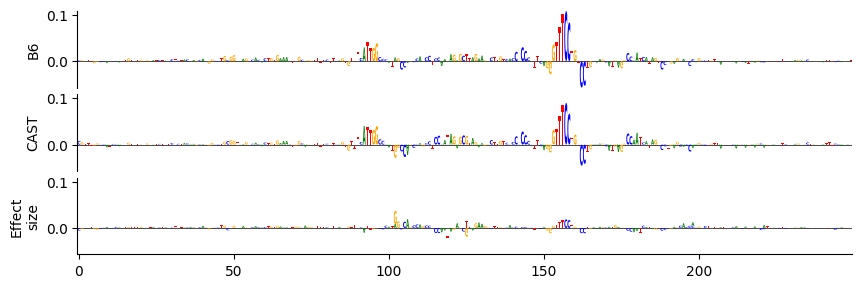

chr16-44313437-44313687mh_ig_sum.jpg
chr16-44460975-44461225 [1.1454686 1.036881 ]
Ylim [np.float64(-0.05252717807888985), np.float64(0.19265881180763245)]
Ylim [np.float64(-0.05252717807888985), np.float64(0.19265881180763245)]


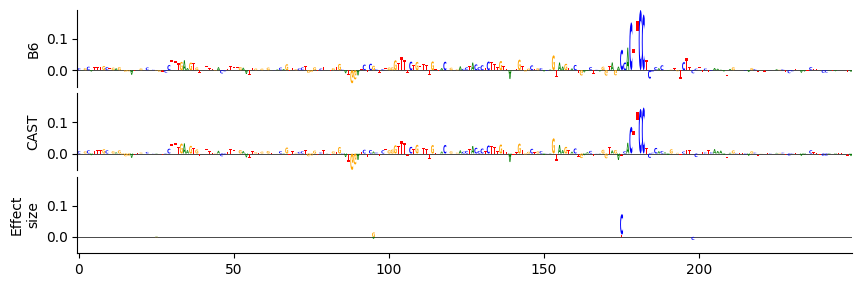

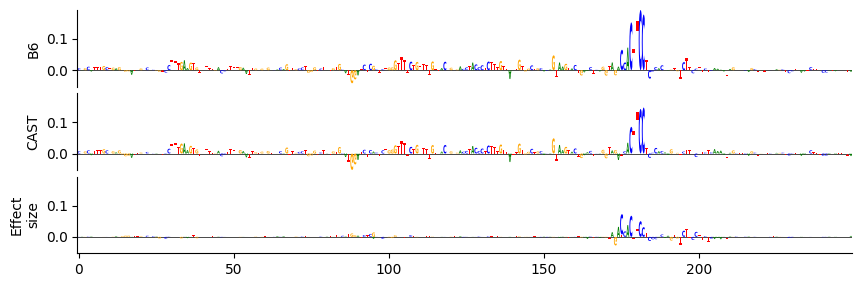

chr16-44460975-44461225mh_ig_sum.jpg
chr16-44812778-44813028 [0.3633092  0.17965914]
Ylim [np.float64(-0.026338141411542892), np.float64(0.04207213968038559)]
Ylim [np.float64(-0.026338141411542892), np.float64(0.04207213968038559)]


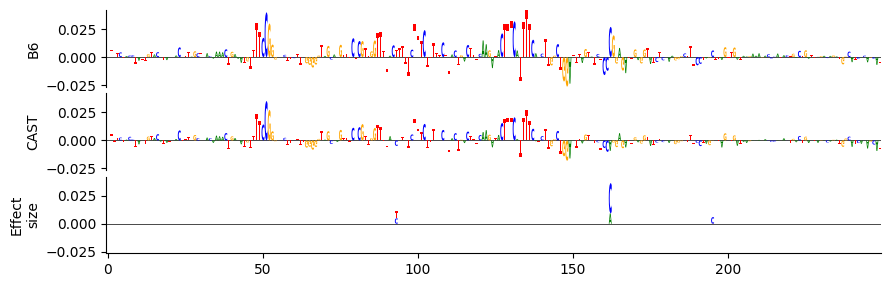

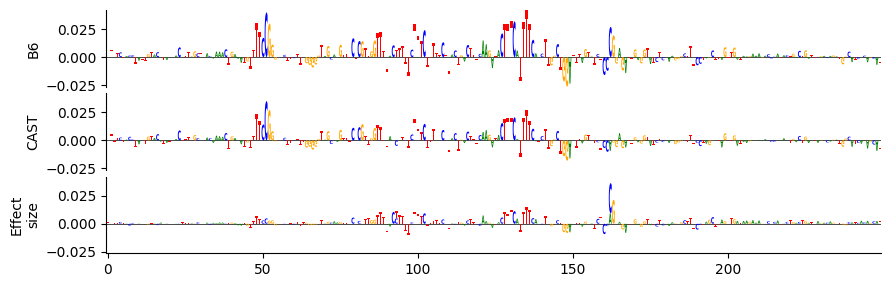

chr16-44812778-44813028mh_ig_sum.jpg
chr16-44875112-44875362 [0.5312487  0.17783198]
Ylim [np.float64(-0.042136408388614655), np.float64(0.09794530272483826)]
Ylim [np.float64(-0.042136408388614655), np.float64(0.09794530272483826)]


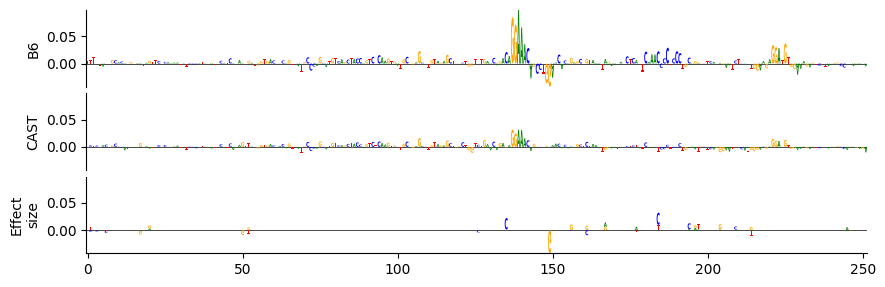

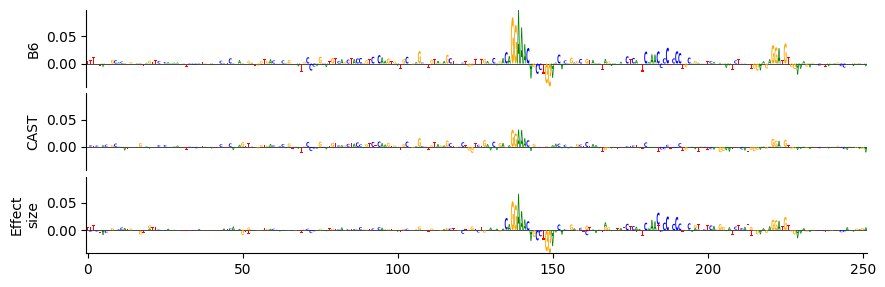

chr16-44875112-44875362mh_ig_sum.jpg
chr16-44875363-44875613 [1.1154395  0.29554003]
Ylim [np.float64(-0.033861517906188965), np.float64(0.11826375126838684)]
Ylim [np.float64(-0.033861517906188965), np.float64(0.11826375126838684)]


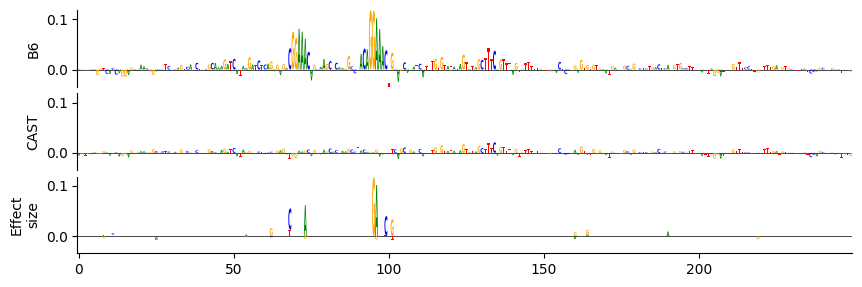

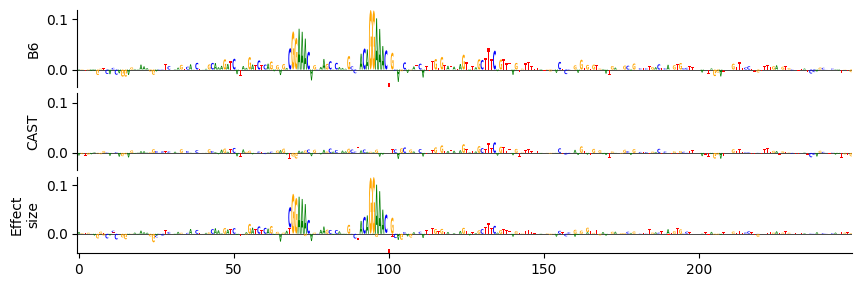

chr16-44875363-44875613mh_ig_sum.jpg
chr16-45451184-45451434 [0.4727621  0.30395374]
Ylim [np.float64(-0.042392514646053314), np.float64(0.06473998725414276)]
Ylim [np.float64(-0.042392514646053314), np.float64(0.06473998725414276)]


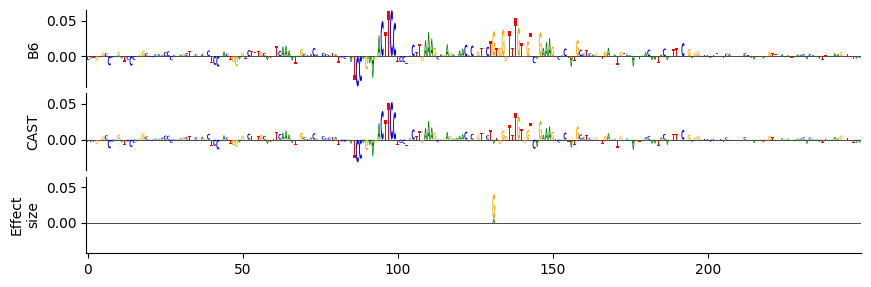

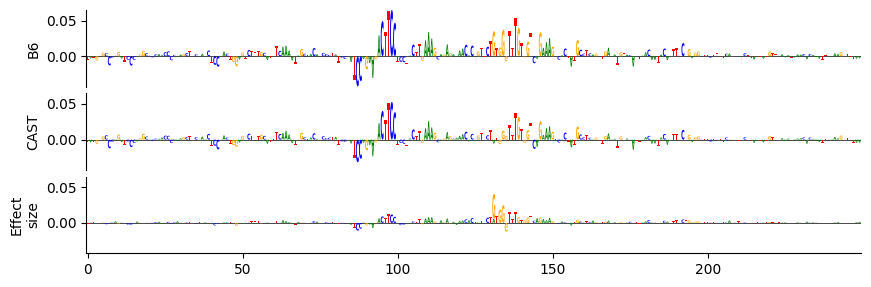

chr16-45451184-45451434mh_ig_sum.jpg
chr16-45780093-45780343 [1.0876526 0.6398997]
Ylim [np.float64(-0.0440656915307045), np.float64(0.12940022349357605)]
Ylim [np.float64(-0.0440656915307045), np.float64(0.12940022349357605)]


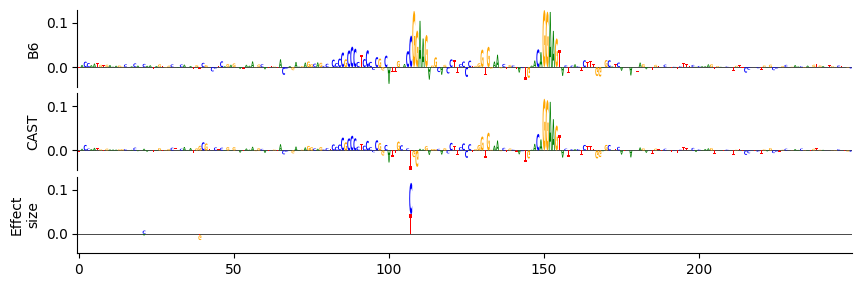

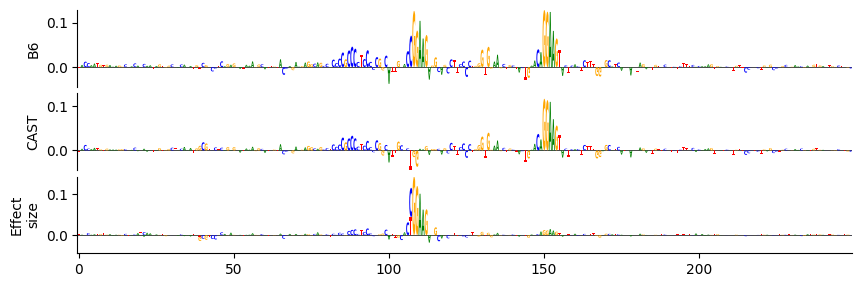

chr16-45780093-45780343mh_ig_sum.jpg
chr16-46000986-46001236 [0.56339216 0.39201614]
Ylim [np.float64(-0.03353528678417206), np.float64(0.07858249545097351)]
Ylim [np.float64(-0.03353528678417206), np.float64(0.07858249545097351)]


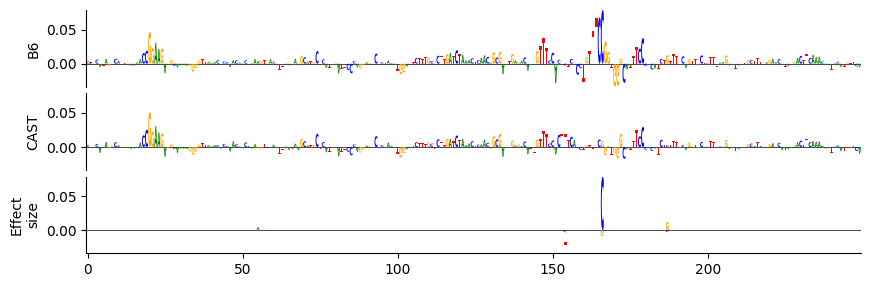

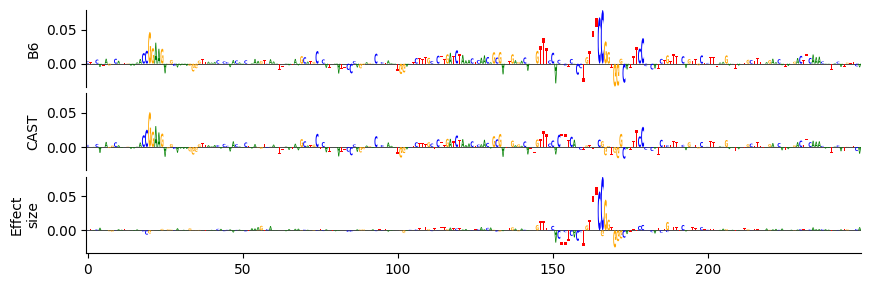

chr16-46000986-46001236mh_ig_sum.jpg
chr16-46001876-46002126 [0.29853278 0.1705544 ]
Ylim [np.float64(-0.0189194418489933), np.float64(0.0802323967218399)]
Ylim [np.float64(-0.0189194418489933), np.float64(0.0802323967218399)]


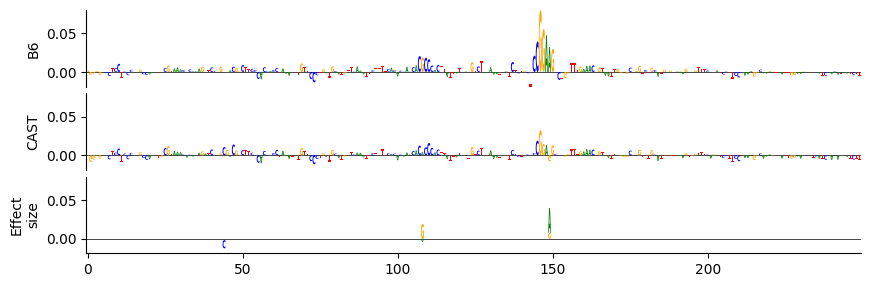

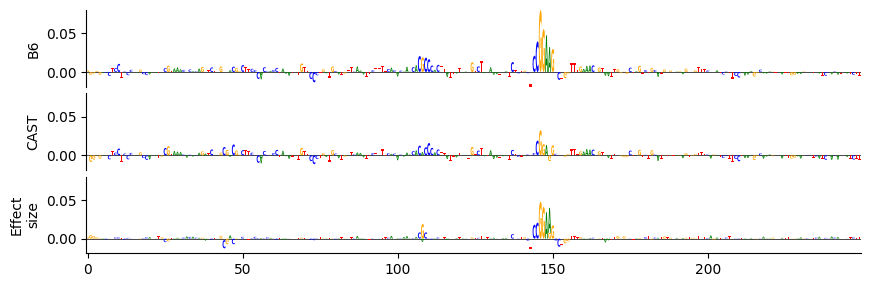

chr16-46001876-46002126mh_ig_sum.jpg
chr16-46020817-46021067 [0.16674326 0.056159  ]
Ylim [np.float64(-0.014468001201748848), np.float64(0.023551451042294502)]
Ylim [np.float64(-0.014468001201748848), np.float64(0.023551451042294502)]


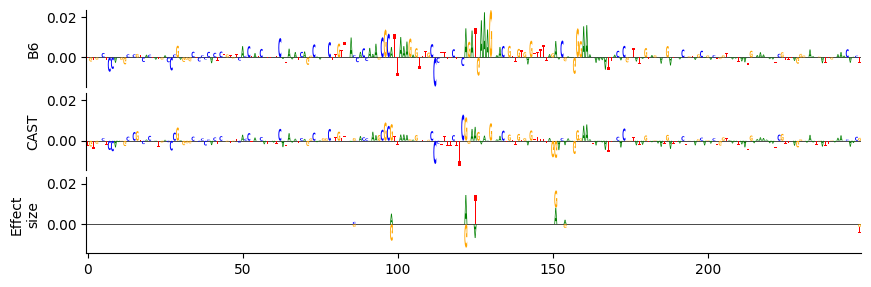

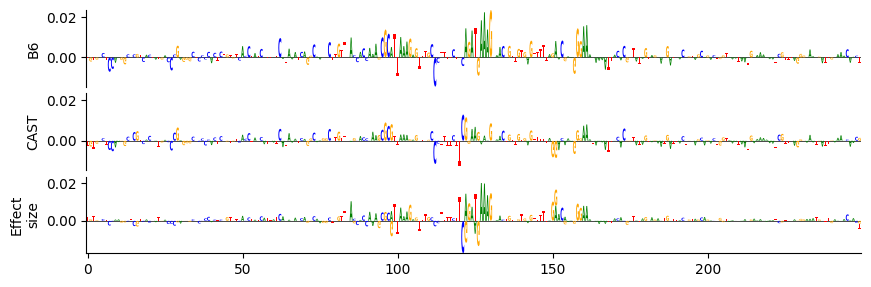

chr16-46020817-46021067mh_ig_sum.jpg
chr16-49167180-49167430 [0.3849767  0.30174437]
Ylim [np.float64(-0.02665022574365139), np.float64(0.05091225355863571)]
Ylim [np.float64(-0.02665022574365139), np.float64(0.05091225355863571)]


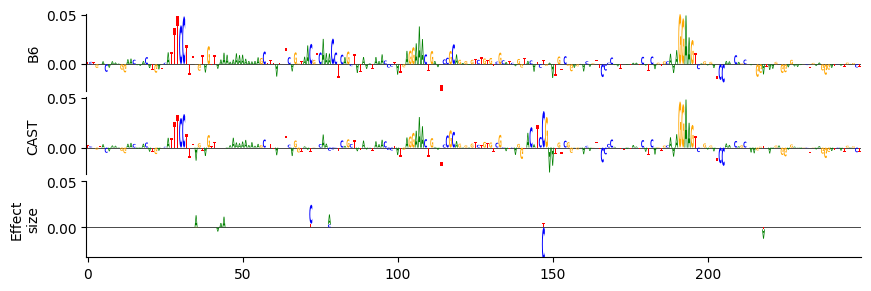

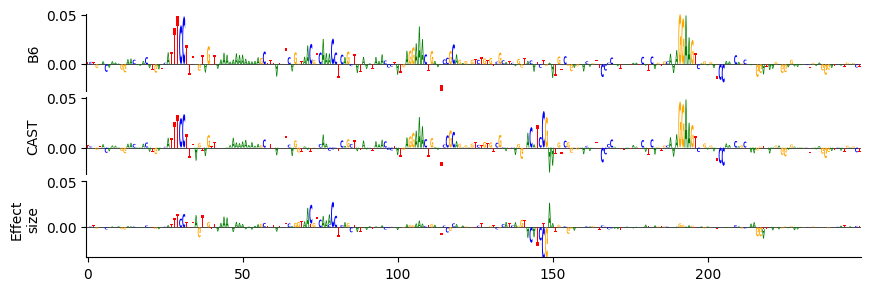

chr16-49167180-49167430mh_ig_sum.jpg
chr16-50230703-50230953 [0.5543848  0.30182767]
Ylim [np.float64(-0.01398930512368679), np.float64(0.04704221710562706)]
Ylim [np.float64(-0.01398930512368679), np.float64(0.04704221710562706)]


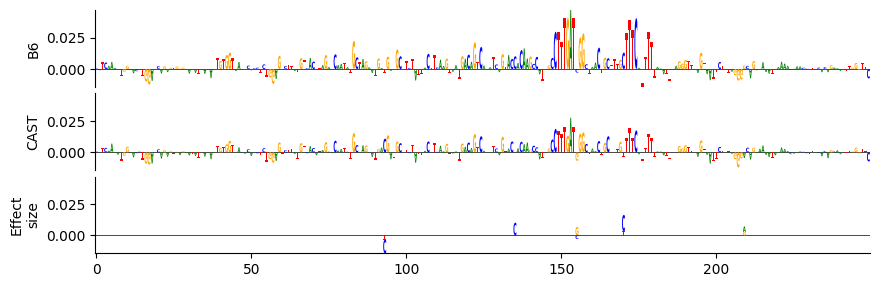

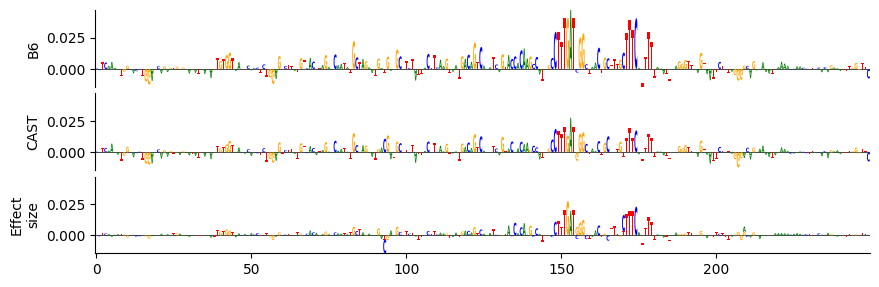

chr16-50230703-50230953mh_ig_sum.jpg
chr16-50305215-50305465 [1.1422755  0.66311735]
Ylim [np.float64(-0.08045659214258194), np.float64(0.18148504197597504)]
Ylim [np.float64(-0.08045659214258194), np.float64(0.18148504197597504)]


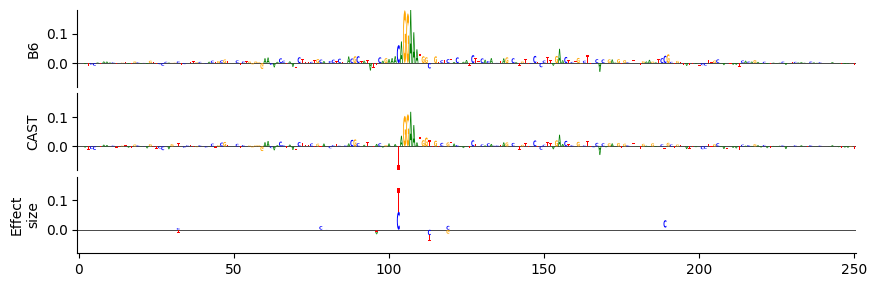

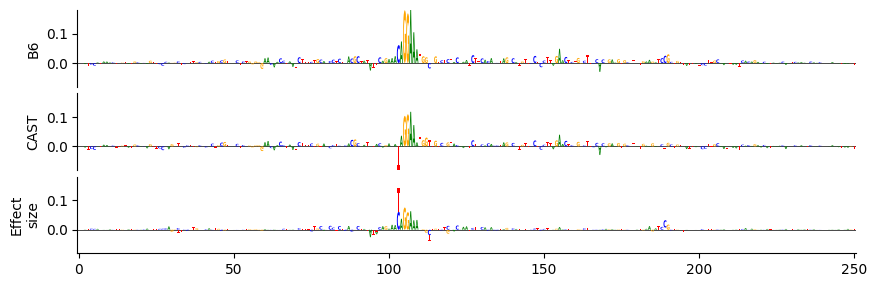

chr16-50305215-50305465mh_ig_sum.jpg
chr16-55556184-55556434 [0.09426075 0.33386892]
Ylim [np.float64(-0.017173178493976593), np.float64(0.07338690757751465)]
Ylim [np.float64(-0.017173178493976593), np.float64(0.07338690757751465)]


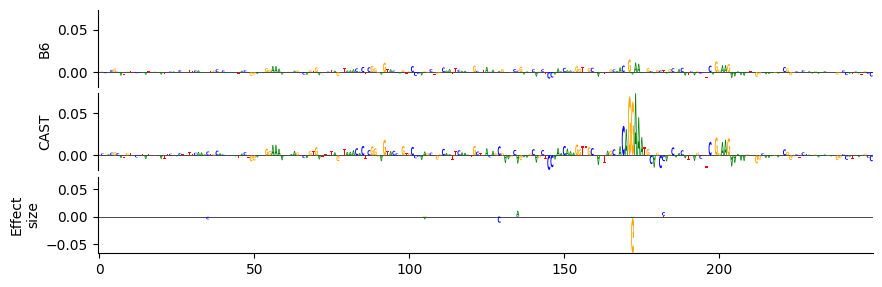

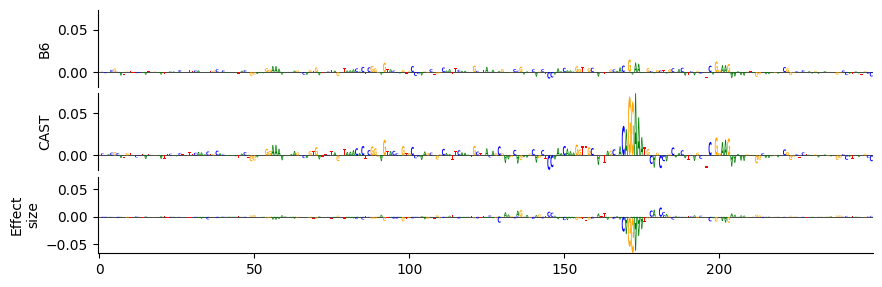

chr16-55556184-55556434mh_ig_sum.jpg
chr16-57300834-57301084 [0.6298972  0.37769935]
Ylim [np.float64(-0.023513101041316986), np.float64(0.058137811720371246)]
Ylim [np.float64(-0.023513101041316986), np.float64(0.058137811720371246)]


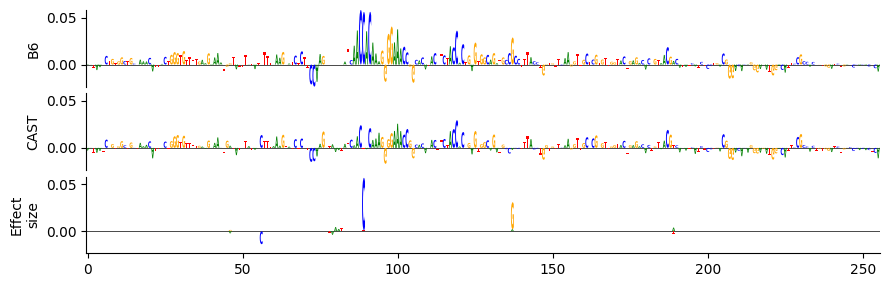

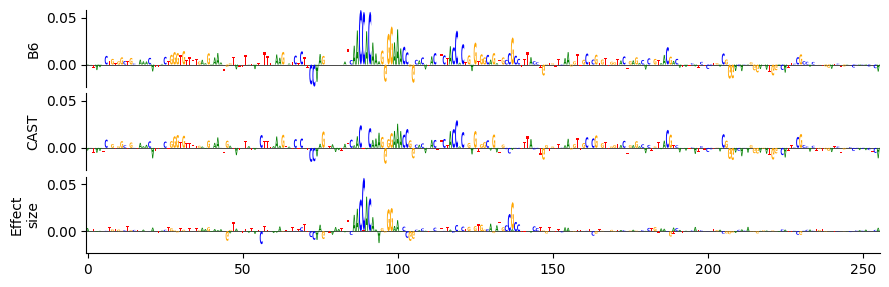

chr16-57300834-57301084mh_ig_sum.jpg
chr16-57318060-57318310 [0.8296282  0.59496385]
Ylim [np.float64(-0.030561622232198715), np.float64(0.0895419493317604)]
Ylim [np.float64(-0.030561622232198715), np.float64(0.0895419493317604)]


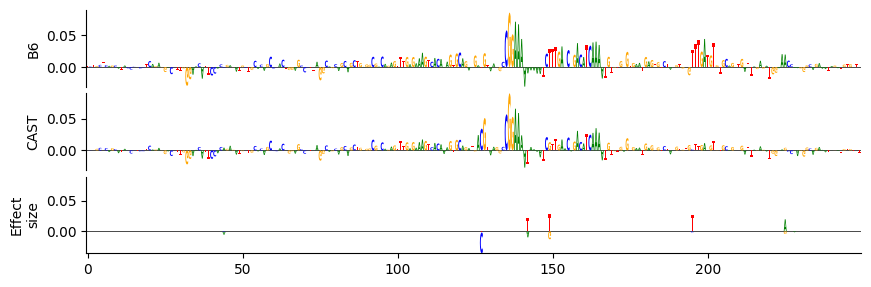

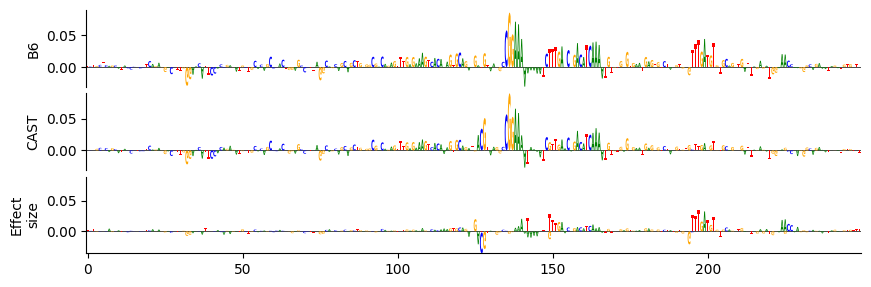

chr16-57318060-57318310mh_ig_sum.jpg
chr16-57465347-57465597 [0.66854507 0.3722258 ]
Ylim [np.float64(-0.028132440522313118), np.float64(0.0739516168832779)]
Ylim [np.float64(-0.028132440522313118), np.float64(0.0739516168832779)]


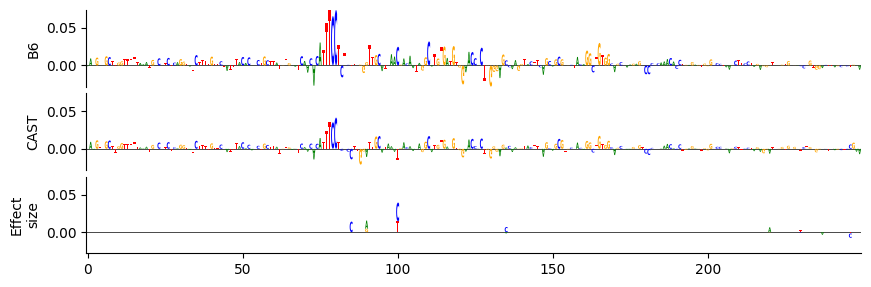

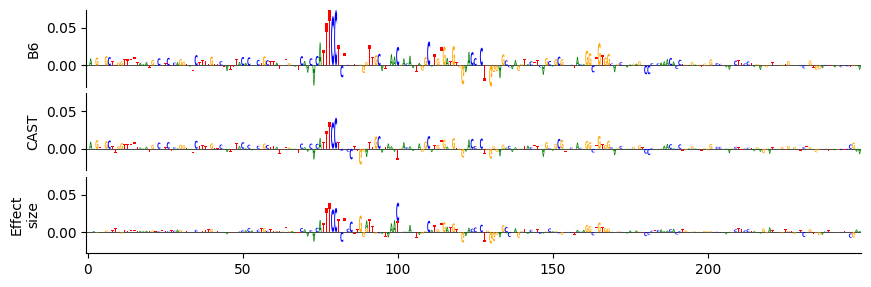

chr16-57465347-57465597mh_ig_sum.jpg
chr16-58685691-58685941 [0.50245005 0.2297431 ]
Ylim [np.float64(-0.03568755462765694), np.float64(0.0579211451113224)]
Ylim [np.float64(-0.03568755462765694), np.float64(0.0579211451113224)]


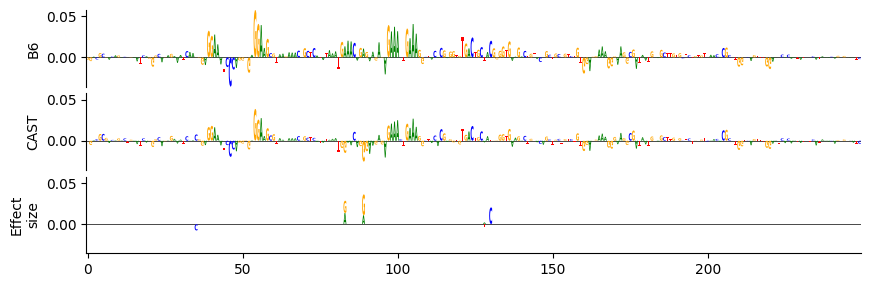

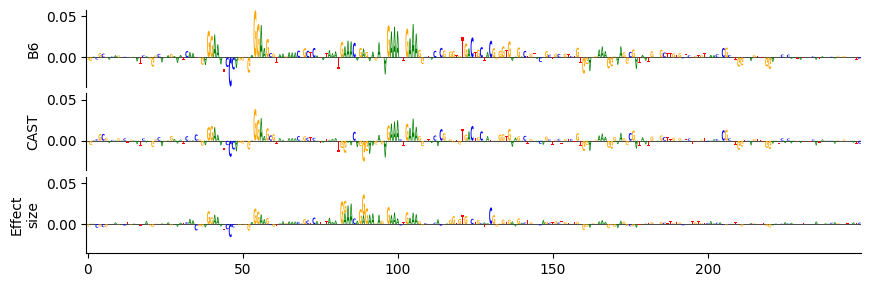

chr16-58685691-58685941mh_ig_sum.jpg
chr16-58690516-58690766 [0.7679659 0.7564439]
Ylim [np.float64(-0.0526394285261631), np.float64(0.06057114899158478)]
Ylim [np.float64(-0.0526394285261631), np.float64(0.06057114899158478)]


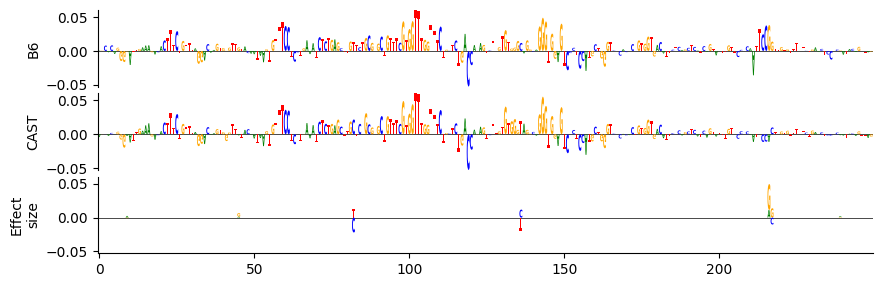

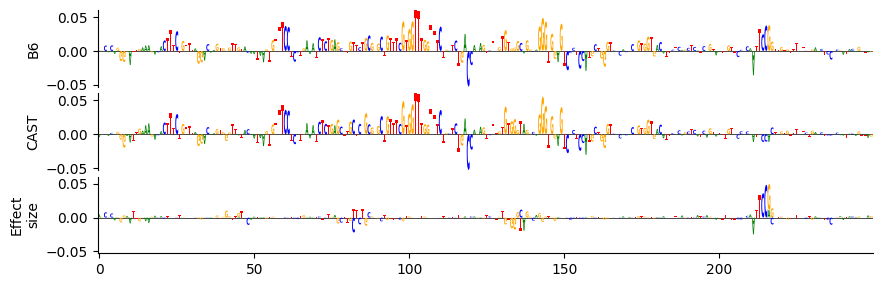

chr16-58690516-58690766mh_ig_sum.jpg
chr16-59570890-59571140 [0.5149687  0.38629556]
Ylim [np.float64(-0.04945867881178856), np.float64(0.07891763746738434)]
Ylim [np.float64(-0.04945867881178856), np.float64(0.07891763746738434)]


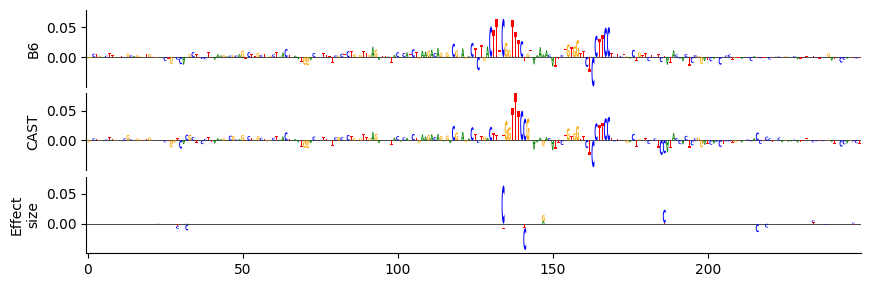

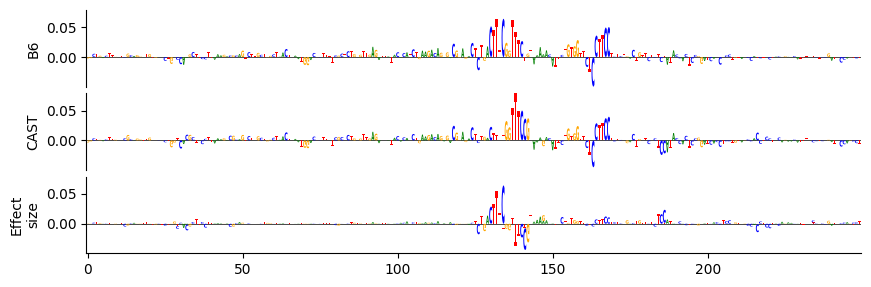

chr16-59570890-59571140mh_ig_sum.jpg
chr16-62895919-62896169 [1.2362777 1.2168968]
Ylim [np.float64(-0.053332142531871796), np.float64(0.09860467910766602)]
Ylim [np.float64(-0.053332142531871796), np.float64(0.09860467910766602)]


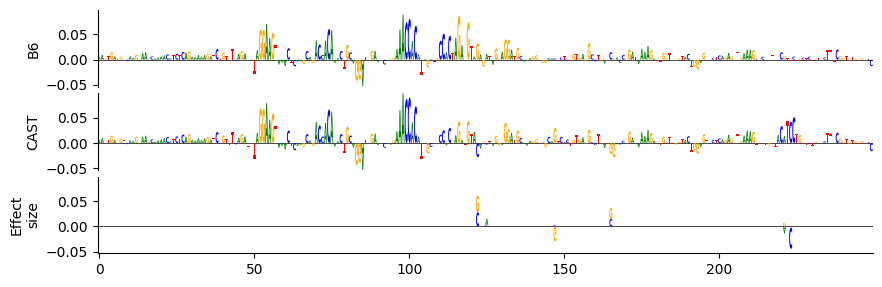

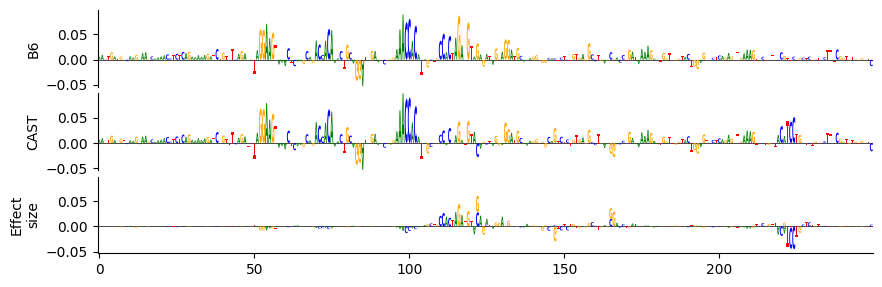

chr16-62895919-62896169mh_ig_sum.jpg
chr16-64647841-64648091 [0.99731714 0.90681154]
Ylim [np.float64(-0.044036541134119034), np.float64(0.09938886016607285)]
Ylim [np.float64(-0.044036541134119034), np.float64(0.09938886016607285)]


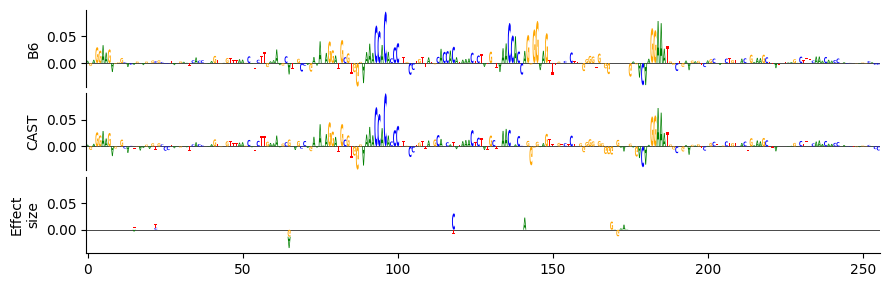

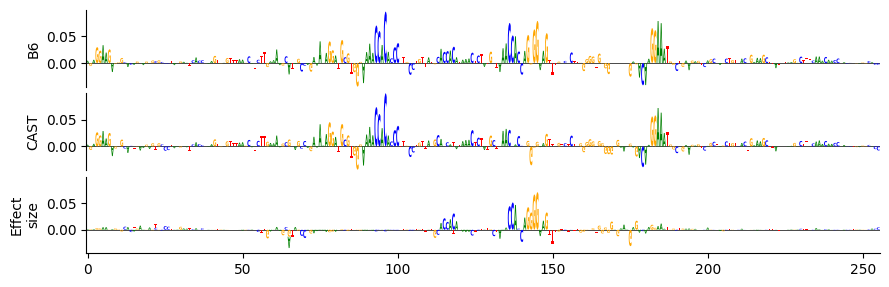

chr16-64647841-64648091mh_ig_sum.jpg
chr16-64961779-64962029 [1.1677599 1.1180366]
Ylim [np.float64(-0.0927964299917221), np.float64(0.08549803495407104)]
Ylim [np.float64(-0.0927964299917221), np.float64(0.08549803495407104)]


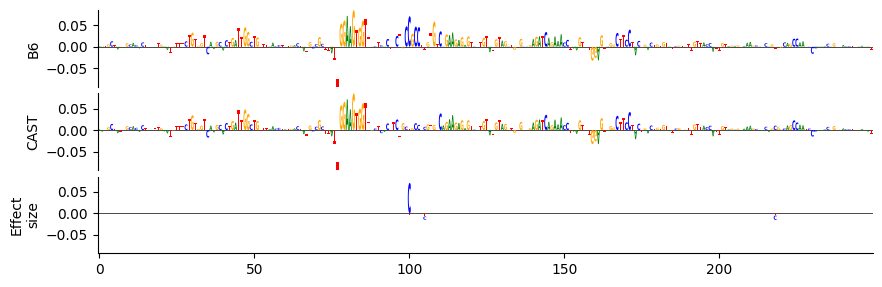

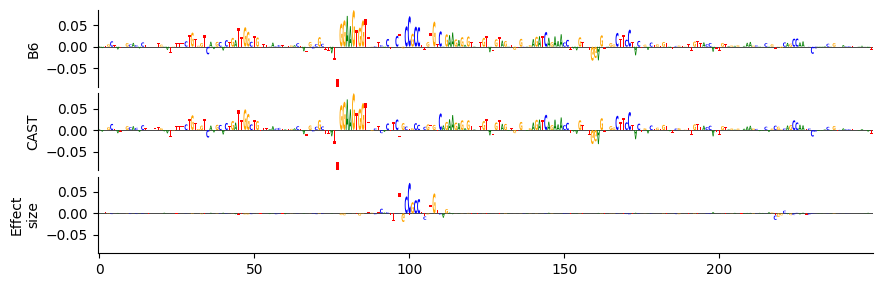

chr16-64961779-64962029mh_ig_sum.jpg
chr16-69937569-69937819 [0.6717326  0.52461857]
Ylim [np.float64(-0.02669176273047924), np.float64(0.06977687031030655)]
Ylim [np.float64(-0.02669176273047924), np.float64(0.06977687031030655)]


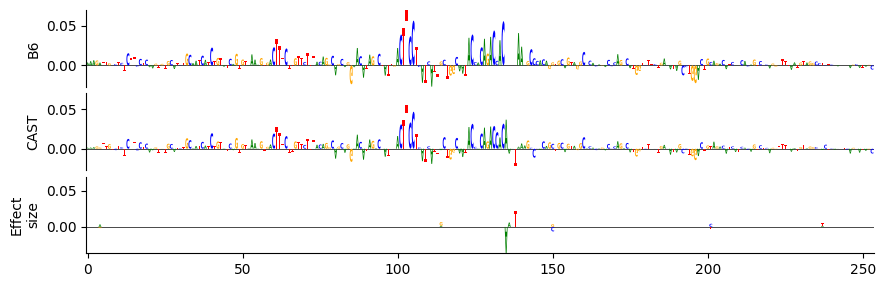

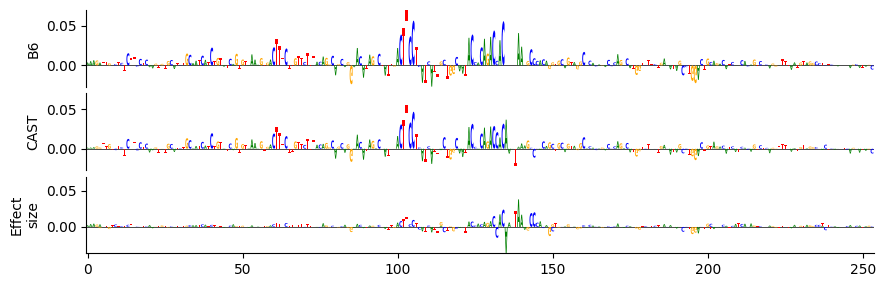

chr16-69937569-69937819mh_ig_sum.jpg
chr16-70331923-70332173 [0.84448355 0.70702827]
Ylim [np.float64(-0.025658585131168365), np.float64(0.04349978640675545)]
Ylim [np.float64(-0.025658585131168365), np.float64(0.04349978640675545)]


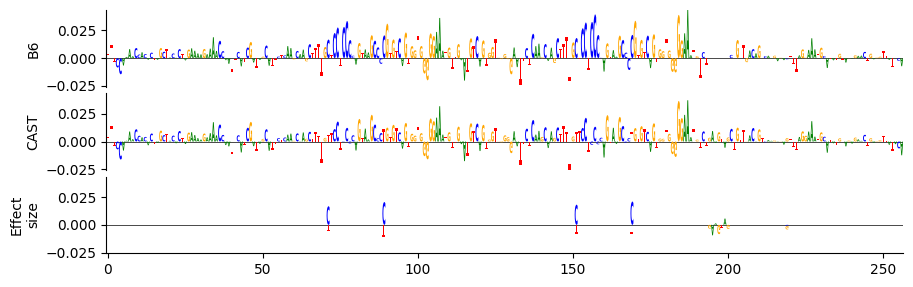

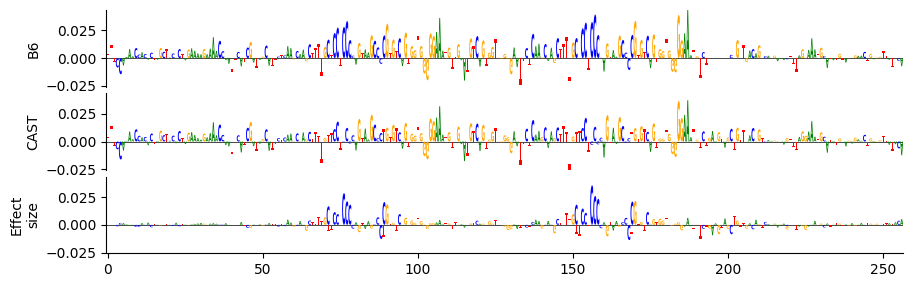

chr16-70331923-70332173mh_ig_sum.jpg
chr16-70395345-70395595 [1.6224042 1.3679768]
Ylim [np.float64(-0.04434673860669136), np.float64(0.24064911901950836)]
Ylim [np.float64(-0.04434673860669136), np.float64(0.24064911901950836)]


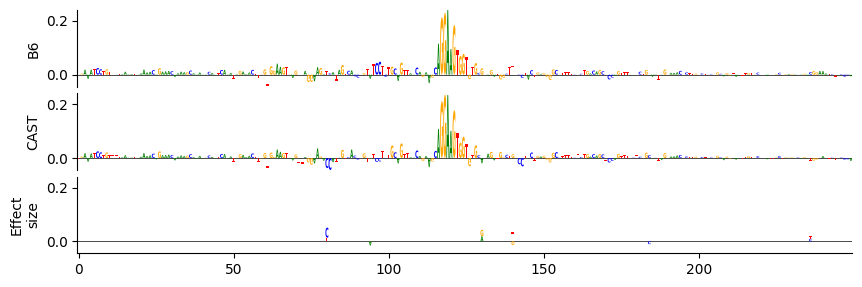

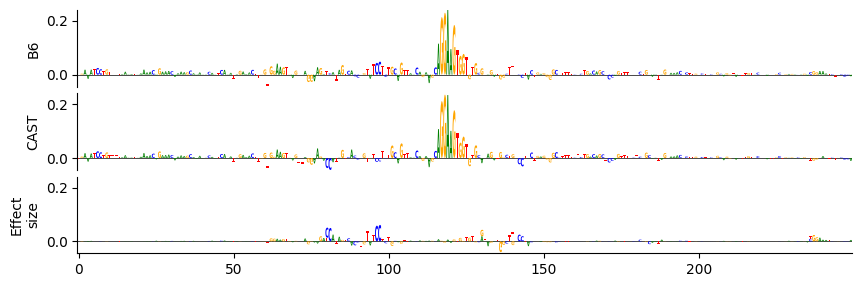

chr16-70395345-70395595mh_ig_sum.jpg
chr16-70395602-70395852 [0.43713516 0.27178884]
Ylim [np.float64(-0.025649117305874825), np.float64(0.06949368119239807)]
Ylim [np.float64(-0.025649117305874825), np.float64(0.06949368119239807)]


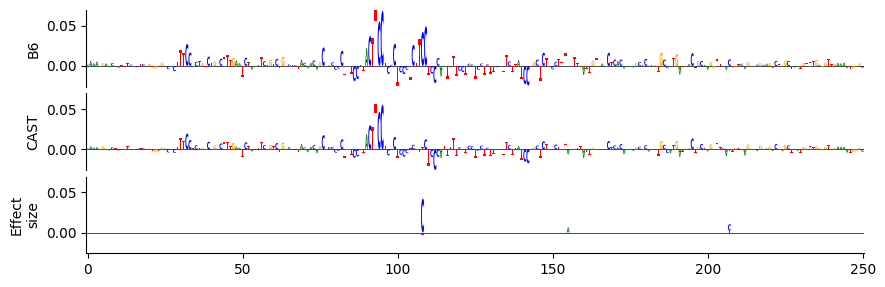

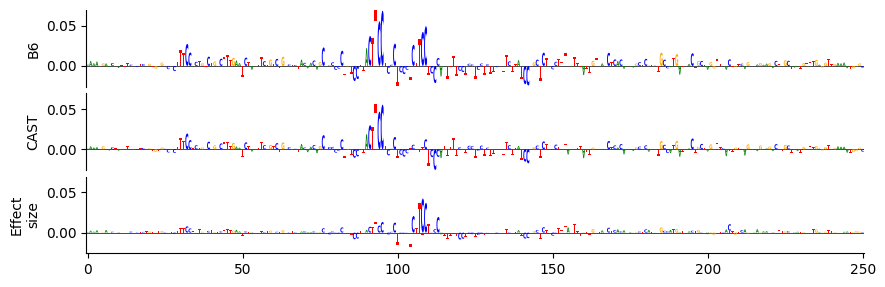

chr16-70395602-70395852mh_ig_sum.jpg
chr16-76246310-76246560 [1.1904601 1.1379   ]
Ylim [np.float64(-0.04307572543621063), np.float64(0.14119769632816315)]
Ylim [np.float64(-0.04307572543621063), np.float64(0.14119769632816315)]


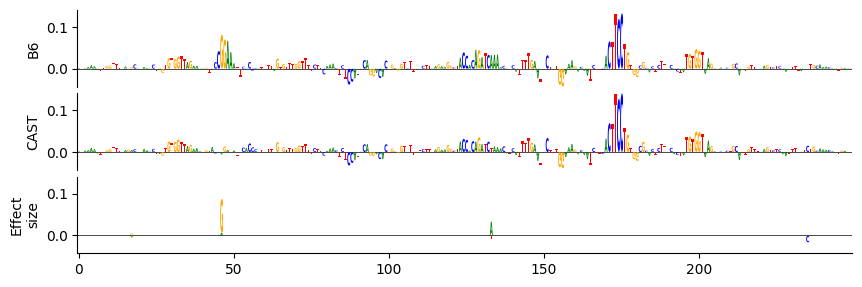

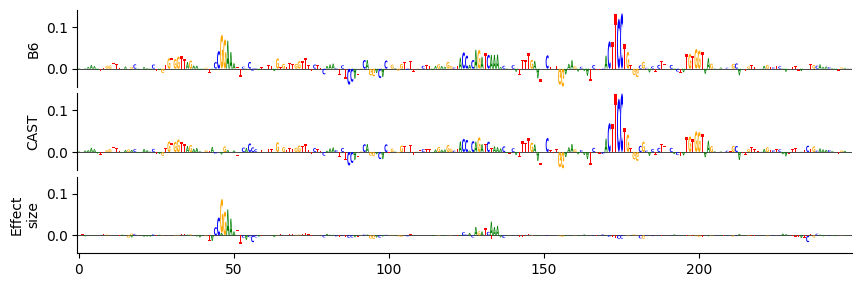

chr16-76246310-76246560mh_ig_sum.jpg
chr16-76334432-76334682 [1.0472814  0.33145723]
Ylim [np.float64(-0.05104570835828781), np.float64(0.12581805884838104)]
Ylim [np.float64(-0.05104570835828781), np.float64(0.12581805884838104)]


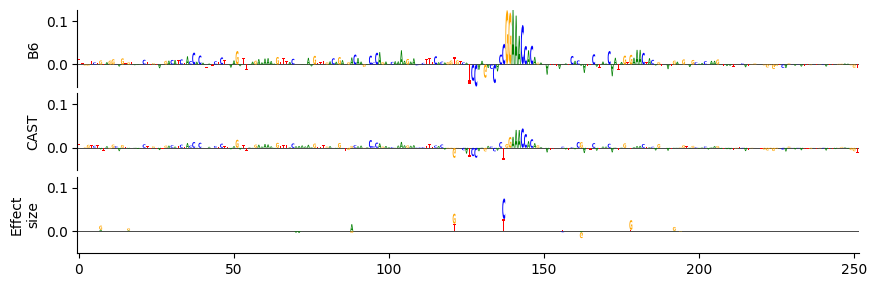

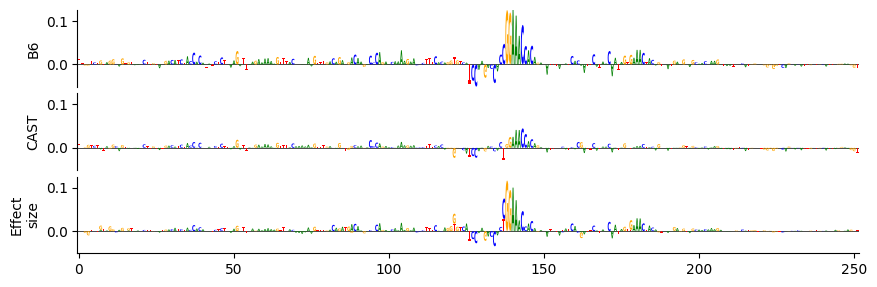

chr16-76334432-76334682mh_ig_sum.jpg
chr16-76341790-76342040 [0.29646015 0.27770045]
Ylim [np.float64(-0.0425536148250103), np.float64(0.12235957384109497)]
Ylim [np.float64(-0.0425536148250103), np.float64(0.12235957384109497)]


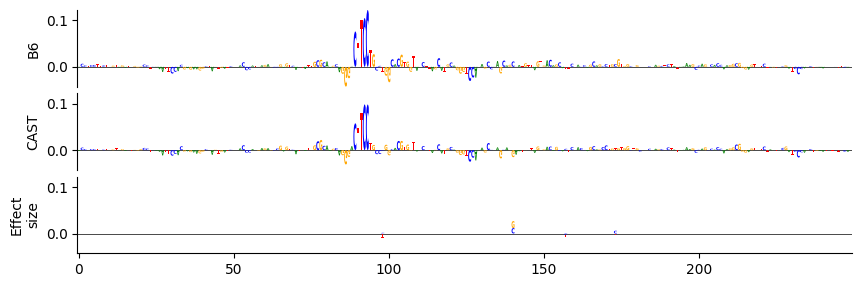

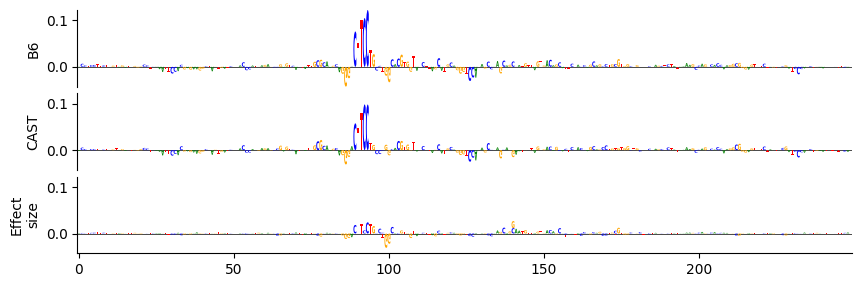

chr16-76341790-76342040mh_ig_sum.jpg
chr16-76436351-76436601 [0.81219643 0.58816004]
Ylim [np.float64(-0.016535239294171333), np.float64(0.06890065968036652)]
Ylim [np.float64(-0.016535239294171333), np.float64(0.06890065968036652)]


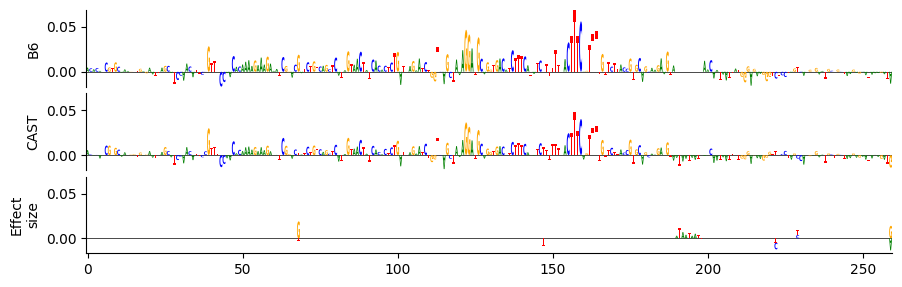

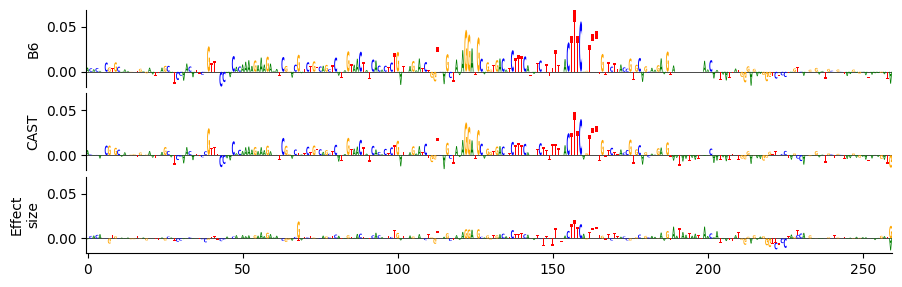

chr16-76436351-76436601mh_ig_sum.jpg
chr16-76529820-76530070 [1.1179049 0.4521446]
Ylim [np.float64(-0.027236413210630417), np.float64(0.13709942996501923)]
Ylim [np.float64(-0.027236413210630417), np.float64(0.13709942996501923)]


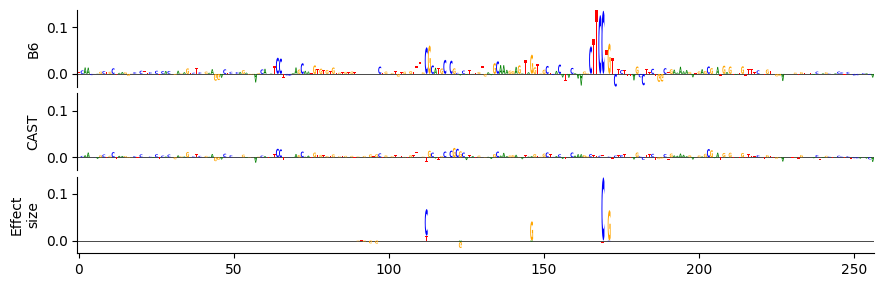

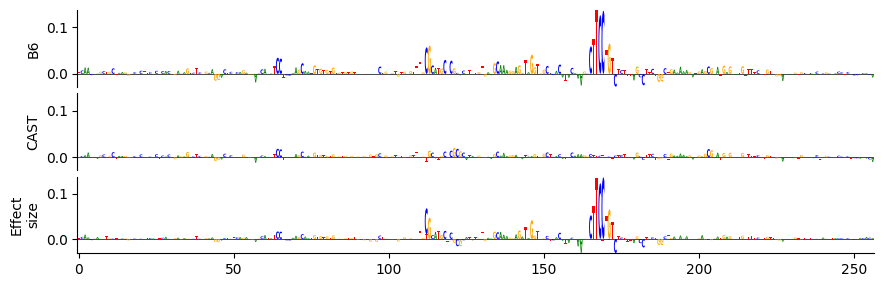

chr16-76529820-76530070mh_ig_sum.jpg
chr16-84546147-84546397 [0.18170914 0.03717866]
Ylim [np.float64(-0.03647975996136665), np.float64(0.06532950699329376)]
Ylim [np.float64(-0.03647975996136665), np.float64(0.06532950699329376)]


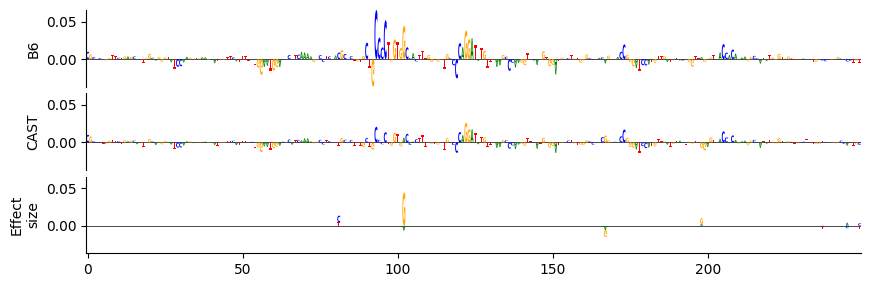

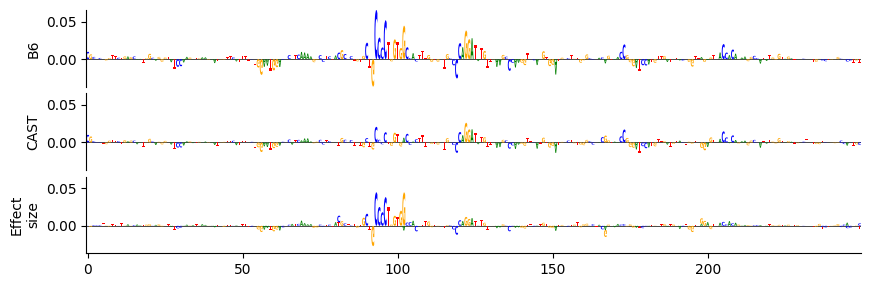

chr16-84546147-84546397mh_ig_sum.jpg
chr16-85000303-85000553 [0.580507  0.3434731]
Ylim [np.float64(-0.023731188848614693), np.float64(0.12502923607826233)]
Ylim [np.float64(-0.023731188848614693), np.float64(0.12502923607826233)]


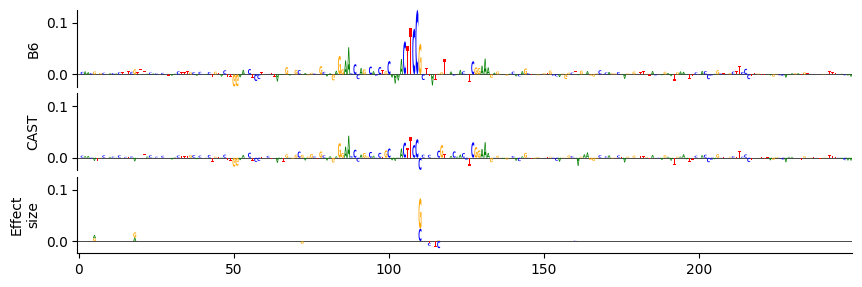

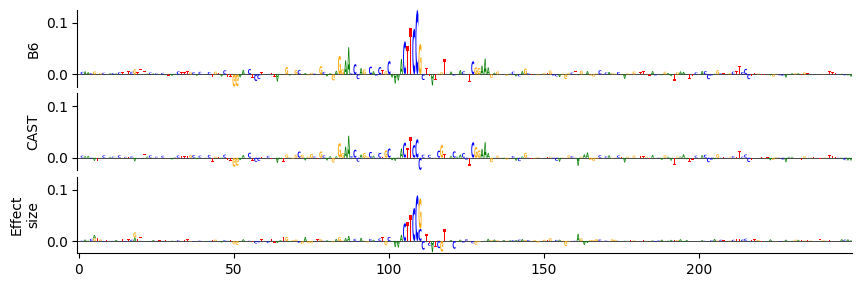

chr16-85000303-85000553mh_ig_sum.jpg
chr16-87284869-87285119 [1.043169   0.87840086]
Ylim [np.float64(-0.04433051496744156), np.float64(0.12916770577430725)]
Ylim [np.float64(-0.04433051496744156), np.float64(0.12916770577430725)]


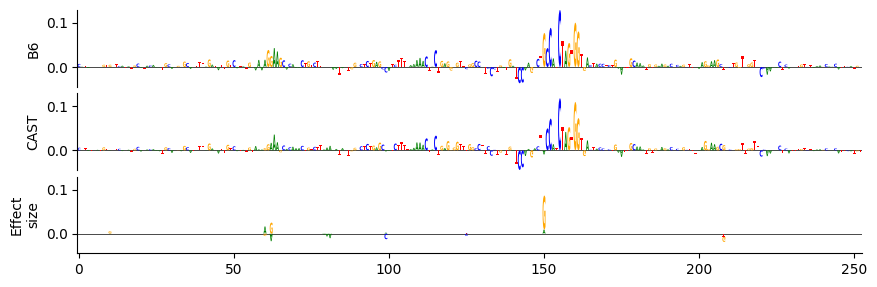

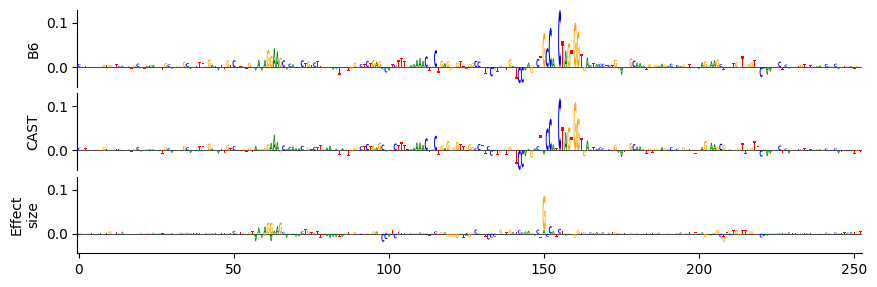

chr16-87284869-87285119mh_ig_sum.jpg
chr16-87652970-87653220 [0.61862445 0.28197417]
Ylim [np.float64(-0.0232213344424963), np.float64(0.055206578224897385)]
Ylim [np.float64(-0.0232213344424963), np.float64(0.055206578224897385)]


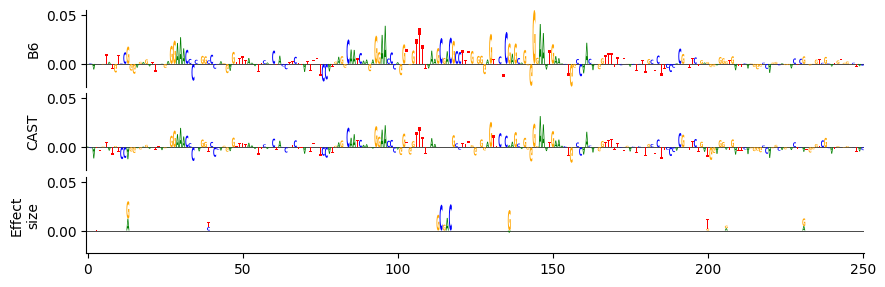

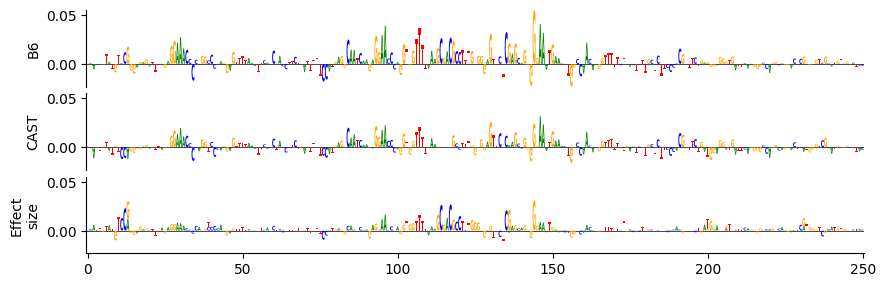

chr16-87652970-87653220mh_ig_sum.jpg
chr16-87723538-87723788 [0.6683998  0.33676022]
Ylim [np.float64(-0.03881736844778061), np.float64(0.08139209449291229)]
Ylim [np.float64(-0.03881736844778061), np.float64(0.08139209449291229)]


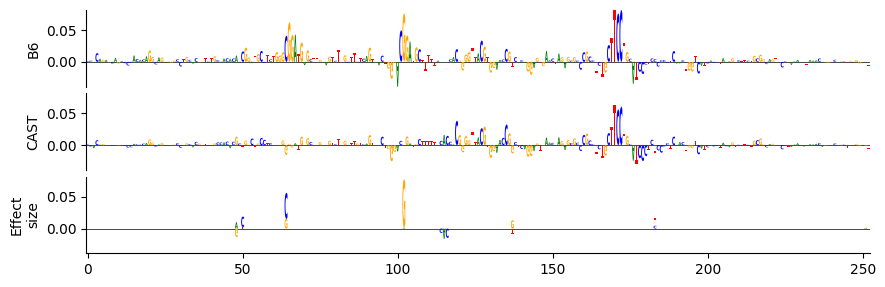

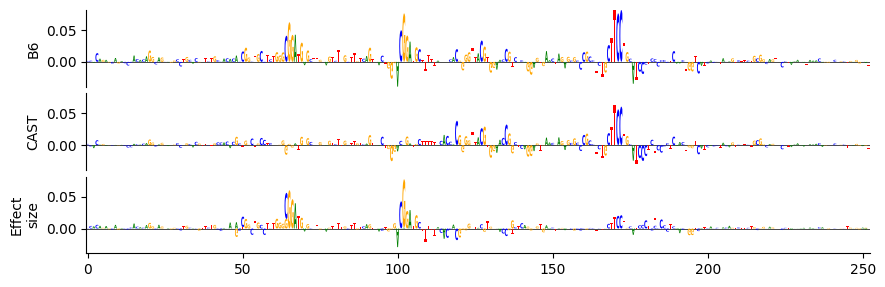

chr16-87723538-87723788mh_ig_sum.jpg
chr16-89906692-89906942 [0.26620468 0.14633562]
Ylim [np.float64(-0.01574208214879036), np.float64(0.029457584023475647)]
Ylim [np.float64(-0.01574208214879036), np.float64(0.029457584023475647)]


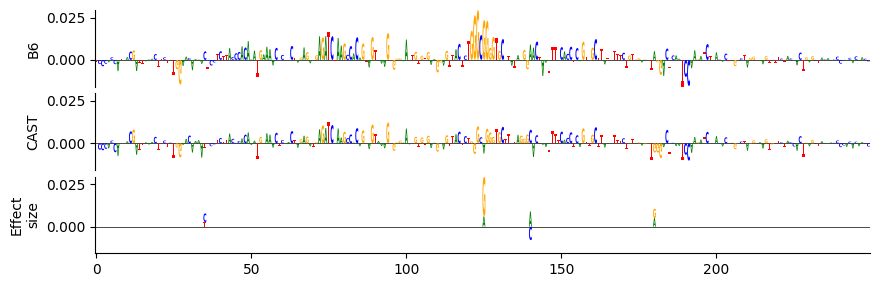

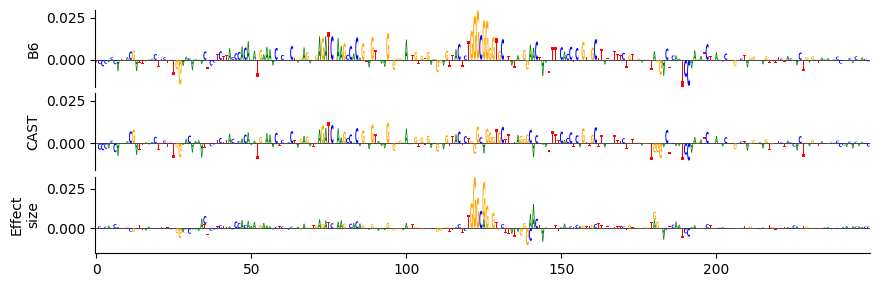

chr16-89906692-89906942mh_ig_sum.jpg
chr16-90333649-90333899 [0.46457192 0.37110448]
Ylim [np.float64(-0.01489945687353611), np.float64(0.041893817484378815)]
Ylim [np.float64(-0.01489945687353611), np.float64(0.041893817484378815)]


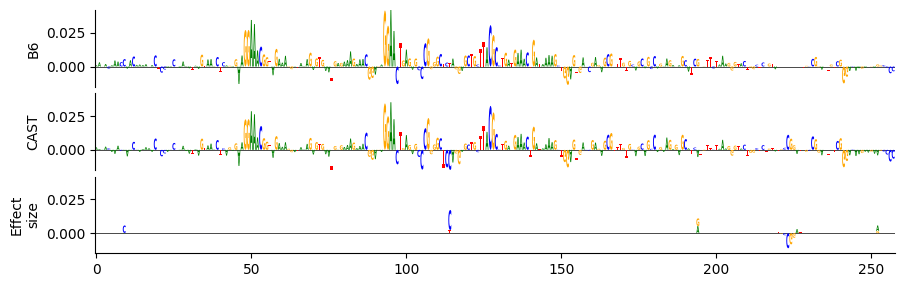

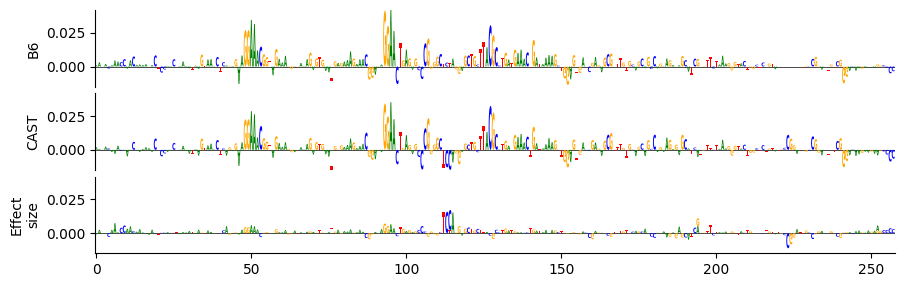

chr16-90333649-90333899mh_ig_sum.jpg
chr16-90455642-90455892 [0.36905867 0.27898508]
Ylim [np.float64(-0.05246223881840706), np.float64(0.058181315660476685)]
Ylim [np.float64(-0.05246223881840706), np.float64(0.058181315660476685)]


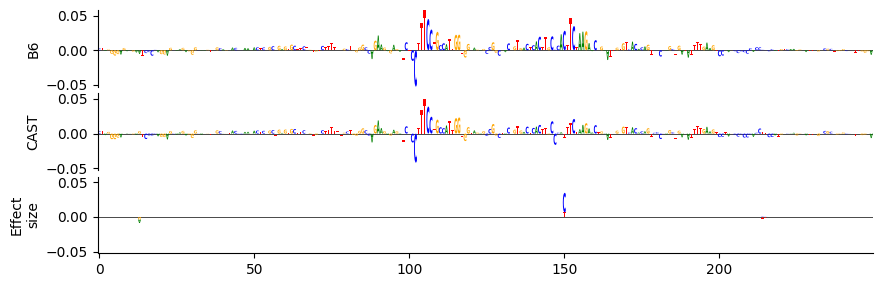

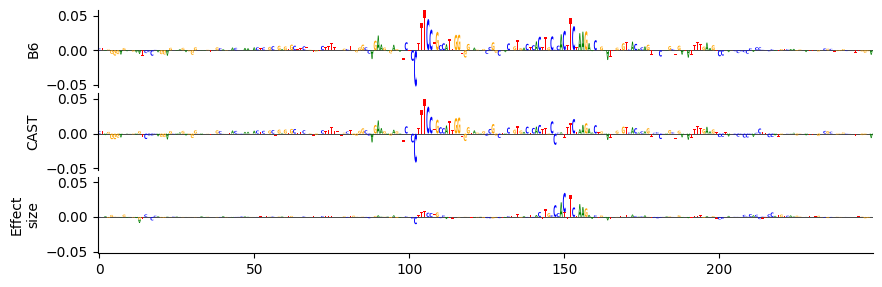

chr16-90455642-90455892mh_ig_sum.jpg
chr16-91063835-91064085 [0.9562605 0.8444862]
Ylim [np.float64(-0.04342927038669586), np.float64(0.13799378275871277)]
Ylim [np.float64(-0.04342927038669586), np.float64(0.13799378275871277)]


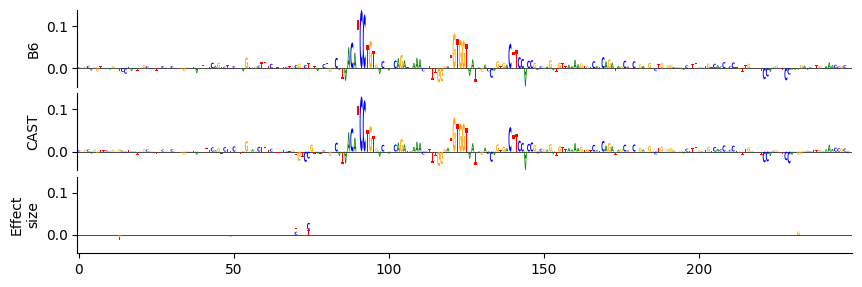

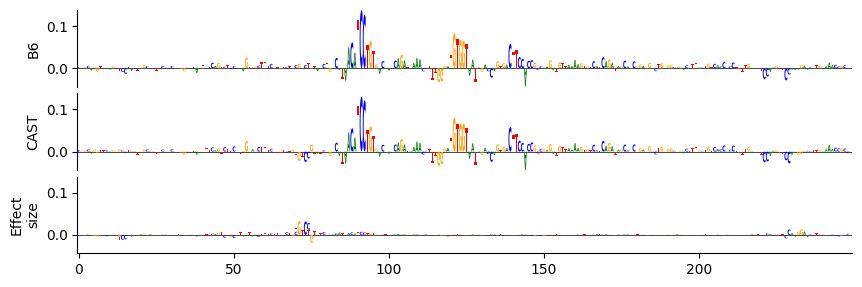

chr16-91063835-91064085mh_ig_sum.jpg
chr16-91064698-91064948 [0.82750154 0.52015847]
Ylim [np.float64(-0.022812215611338615), np.float64(0.05294701084494591)]
Ylim [np.float64(-0.022812215611338615), np.float64(0.05294701084494591)]


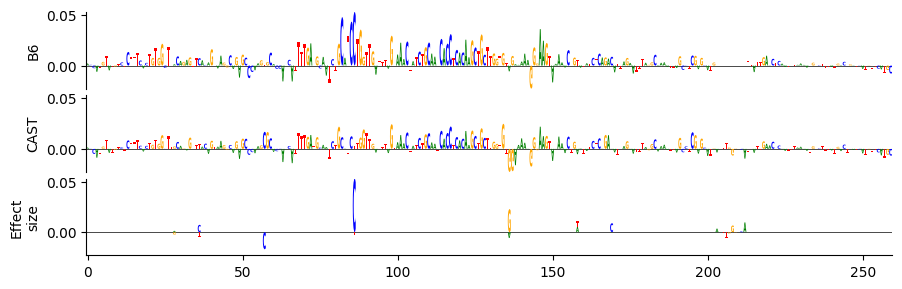

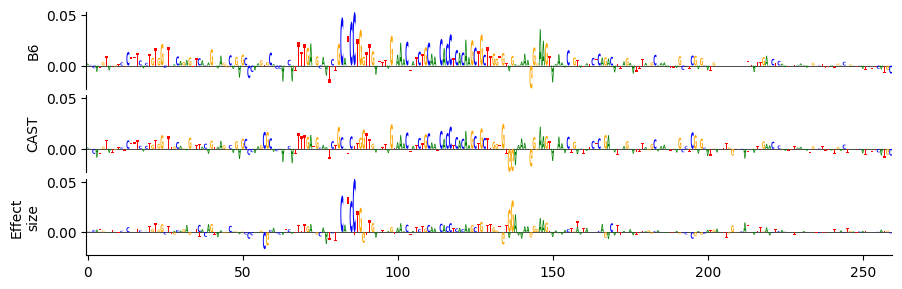

chr16-91064698-91064948mh_ig_sum.jpg
chr16-92899776-92900026 [0.5337895  0.27415904]
Ylim [np.float64(-0.03366687148809433), np.float64(0.0932525172829628)]
Ylim [np.float64(-0.03366687148809433), np.float64(0.0932525172829628)]


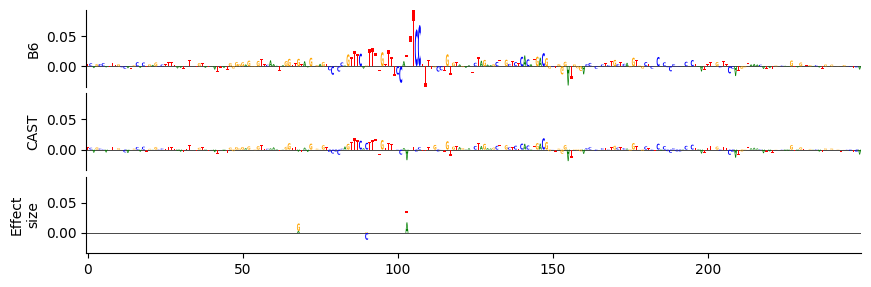

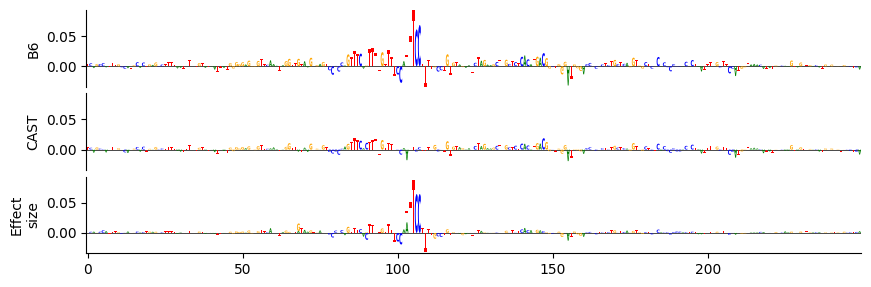

chr16-92899776-92900026mh_ig_sum.jpg
chr16-92980021-92980271 [0.6915599  0.56616586]
Ylim [np.float64(-0.03306182101368904), np.float64(0.09437484294176102)]
Ylim [np.float64(-0.03306182101368904), np.float64(0.09437484294176102)]


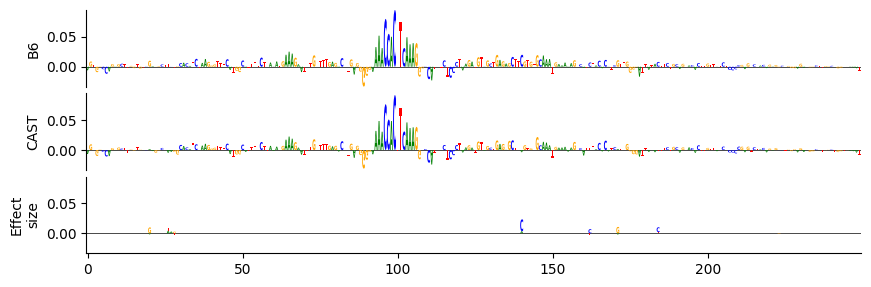

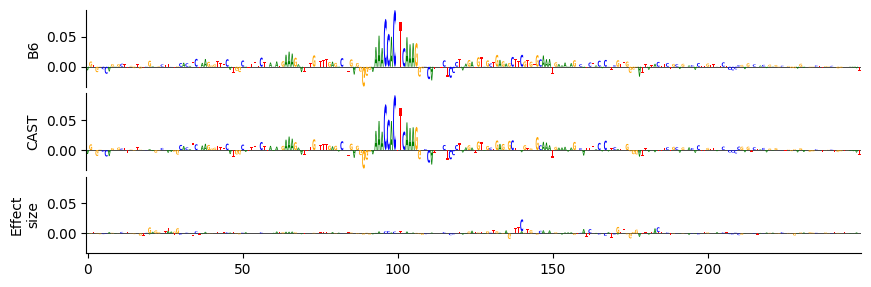

chr16-92980021-92980271mh_ig_sum.jpg
chr16-93052441-93052691 [0.23616011 0.10712746]
Ylim [np.float64(-0.01909668557345867), np.float64(0.04693375527858734)]
Ylim [np.float64(-0.01909668557345867), np.float64(0.04693375527858734)]


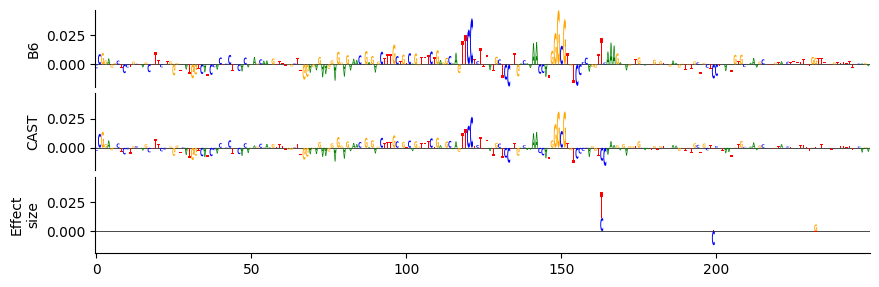

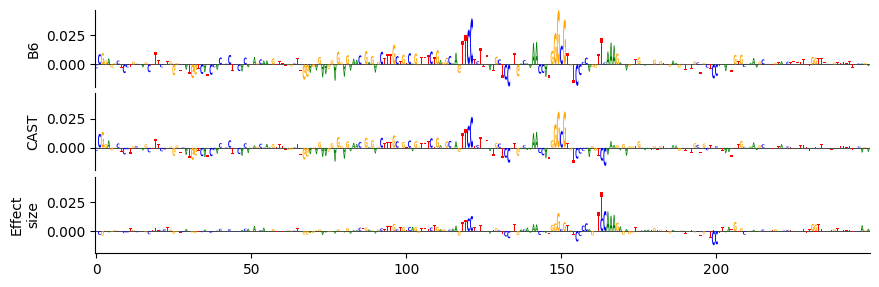

chr16-93052441-93052691mh_ig_sum.jpg
chr16-93766635-93766885 [0.8319384  0.54585403]
Ylim [np.float64(-0.04037629812955856), np.float64(0.10203009098768234)]
Ylim [np.float64(-0.04037629812955856), np.float64(0.10203009098768234)]


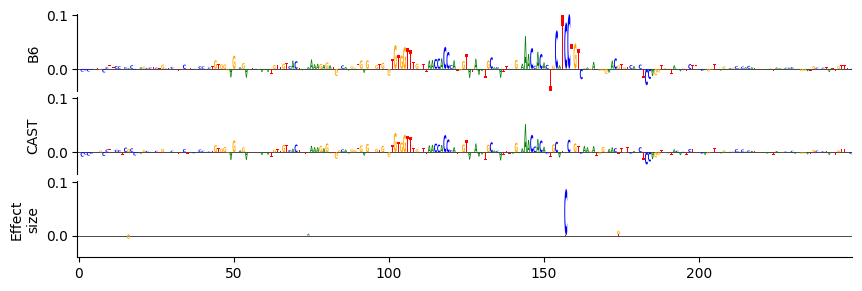

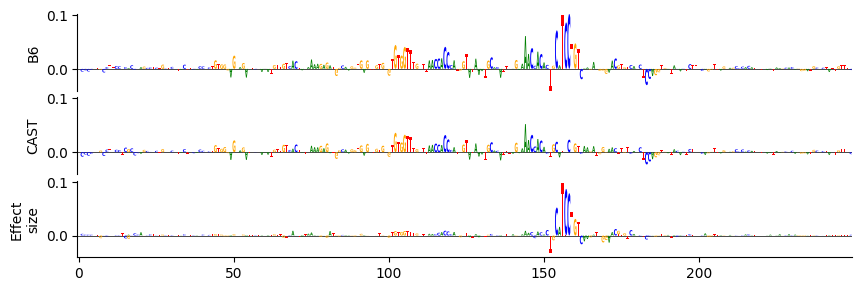

chr16-93766635-93766885mh_ig_sum.jpg
chr16-93908252-93908502 [0.5759757  0.43658653]
Ylim [np.float64(-0.05052945762872696), np.float64(0.07575307041406631)]
Ylim [np.float64(-0.05052945762872696), np.float64(0.07575307041406631)]


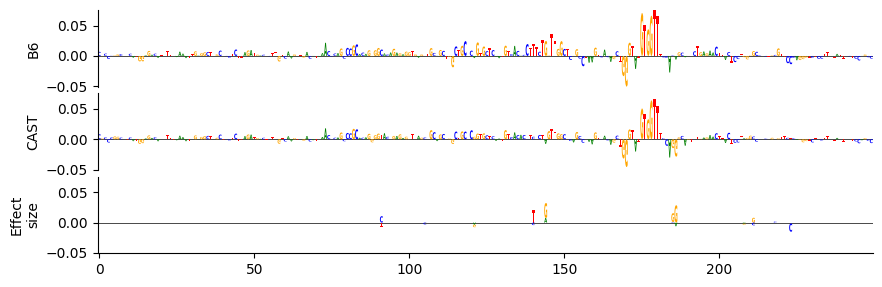

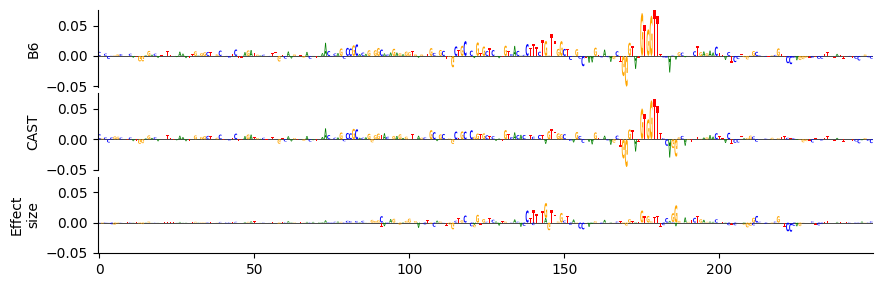

chr16-93908252-93908502mh_ig_sum.jpg
chr16-93920898-93921148 [0.6545186  0.41422895]
Ylim [np.float64(-0.044455718249082565), np.float64(0.10248401015996933)]
Ylim [np.float64(-0.044455718249082565), np.float64(0.10248401015996933)]


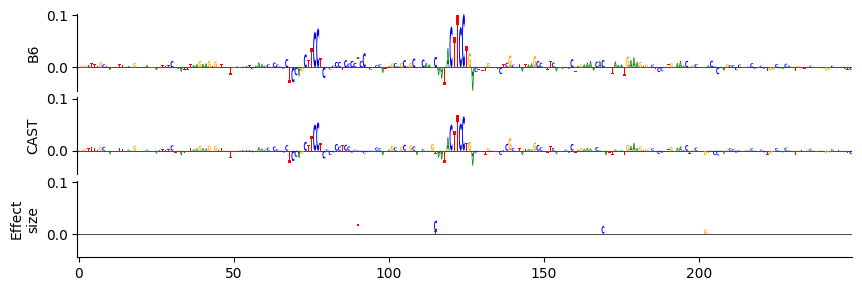

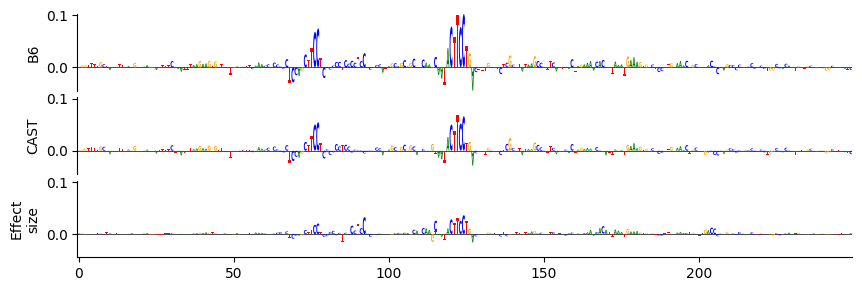

chr16-93920898-93921148mh_ig_sum.jpg
chr16-94299930-94300180 [0.1211811  0.00646753]
Ylim [np.float64(-0.021655140444636345), np.float64(0.03106425702571869)]
Ylim [np.float64(-0.021655140444636345), np.float64(0.03106425702571869)]


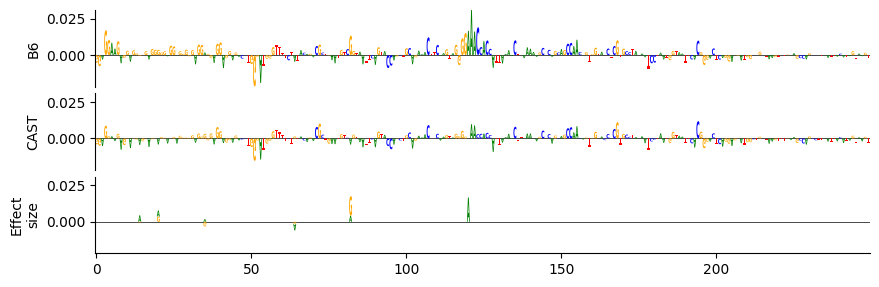

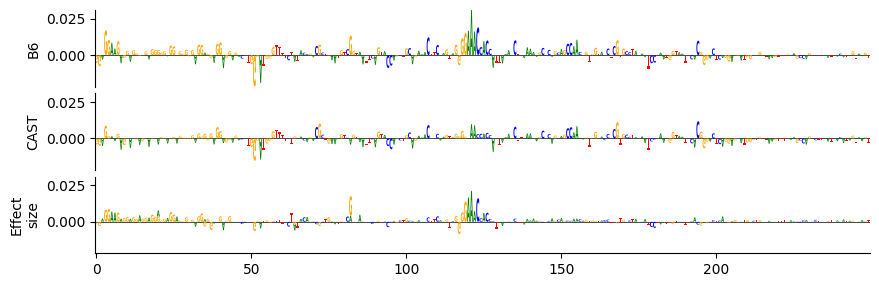

chr16-94299930-94300180mh_ig_sum.jpg
chr16-94303376-94303626 [0.04866819 0.02971041]
Ylim [np.float64(-0.028818193823099136), np.float64(0.020578183233737946)]
Ylim [np.float64(-0.028818193823099136), np.float64(0.020578183233737946)]


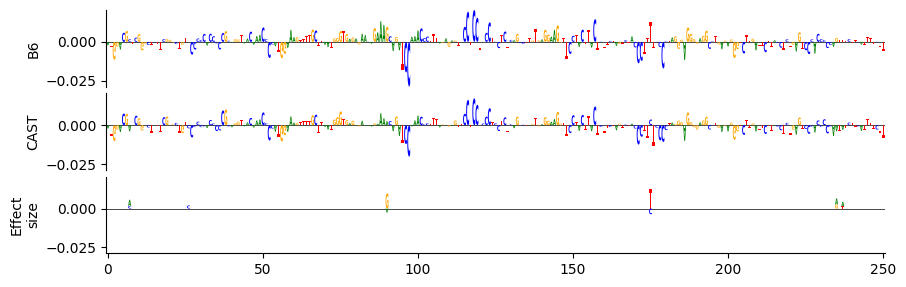

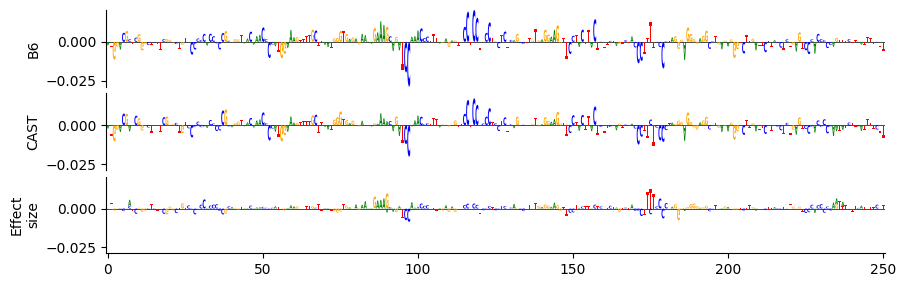

chr16-94303376-94303626mh_ig_sum.jpg
chr16-95280094-95280344 [0.29043448 0.17631267]
Ylim [np.float64(-0.025327151641249657), np.float64(0.04577656090259552)]
Ylim [np.float64(-0.025327151641249657), np.float64(0.04577656090259552)]


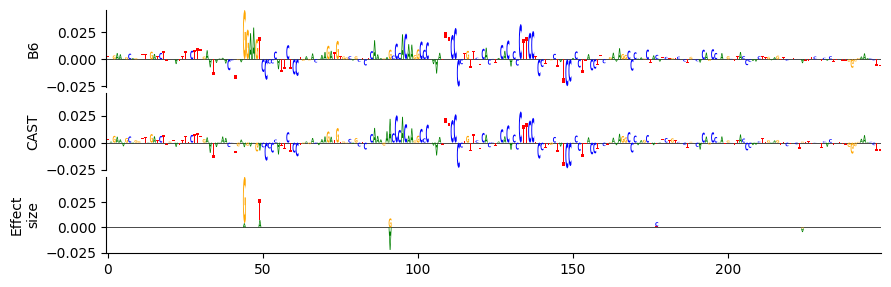

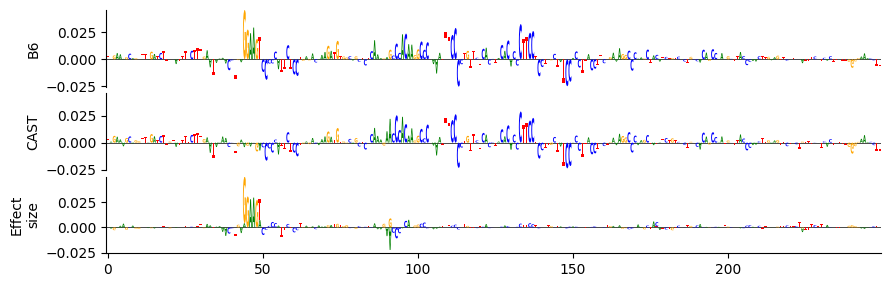

chr16-95280094-95280344mh_ig_sum.jpg
chr16-95455953-95456203 [0.681796 0.622798]
Ylim [np.float64(-0.0653769001364708), np.float64(0.10988141596317291)]
Ylim [np.float64(-0.0653769001364708), np.float64(0.10988141596317291)]


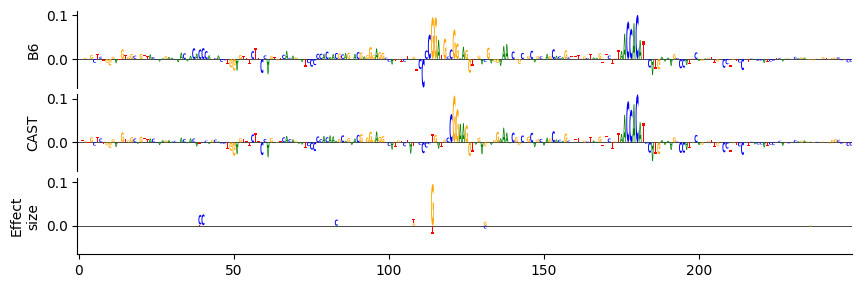

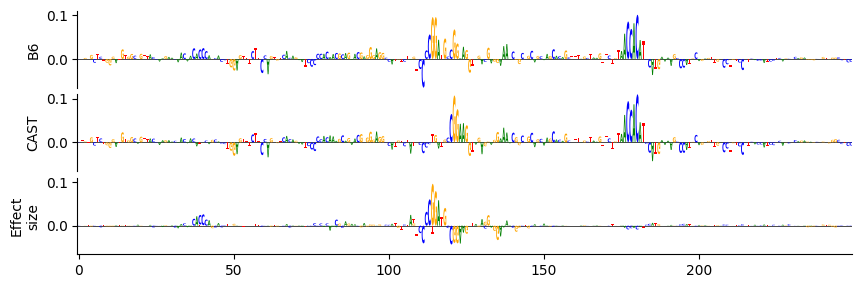

chr16-95455953-95456203mh_ig_sum.jpg
chr16-95964481-95964731 [0.32030362 0.1331721 ]
Ylim [np.float64(-0.033033210784196854), np.float64(0.06404177099466324)]
Ylim [np.float64(-0.033033210784196854), np.float64(0.06404177099466324)]


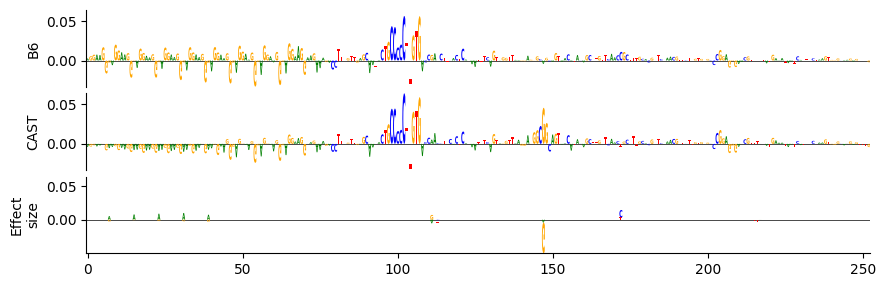

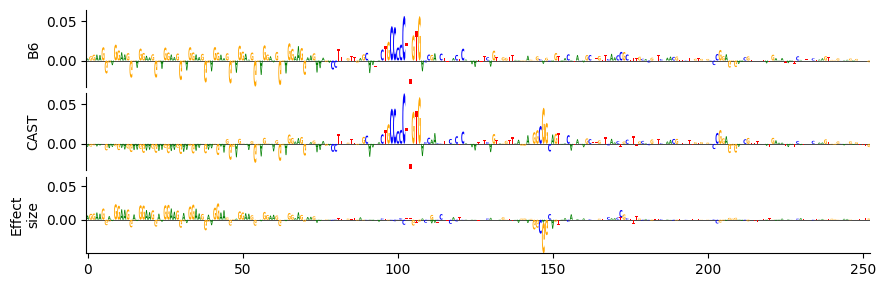

chr16-95964481-95964731mh_ig_sum.jpg
chr16-97269004-97269254 [0.847924   0.66695106]
Ylim [np.float64(-0.02347099781036377), np.float64(0.1236463114619255)]
Ylim [np.float64(-0.02347099781036377), np.float64(0.1236463114619255)]


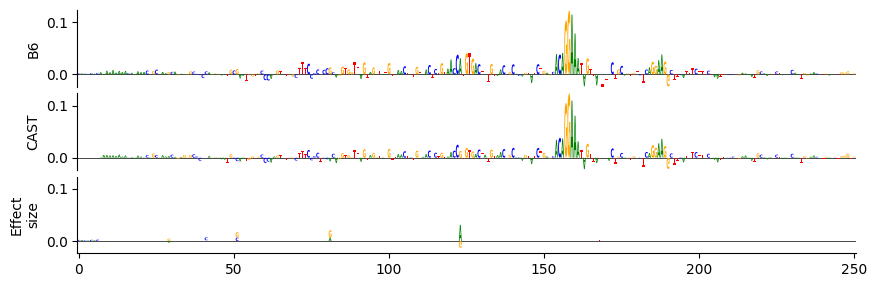

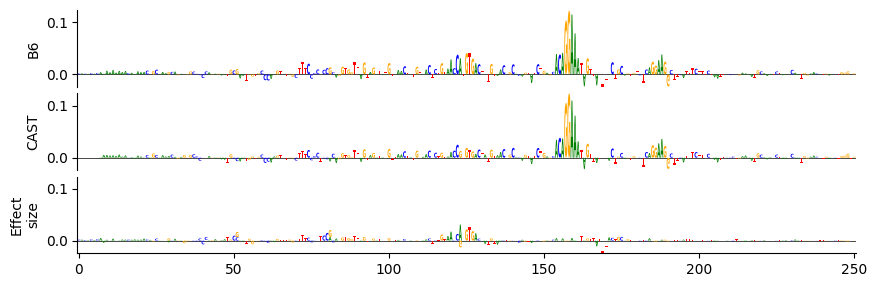

chr16-97269004-97269254mh_ig_sum.jpg
chr16-97460597-97460847 [0.24642466 0.4678992 ]
Ylim [np.float64(-0.03960549831390381), np.float64(0.08341467380523682)]
Ylim [np.float64(-0.03960549831390381), np.float64(0.08341467380523682)]


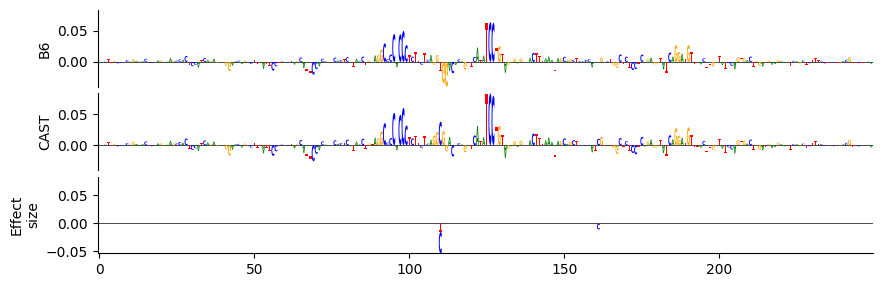

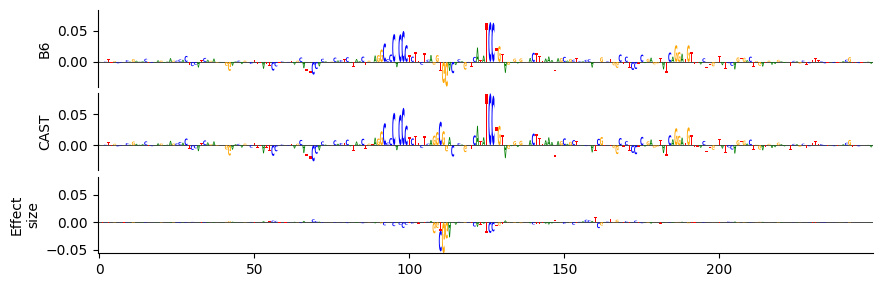

chr16-97460597-97460847mh_ig_sum.jpg
chr16-97523129-97523379 [0.49868682 0.173751  ]
Ylim [np.float64(-0.02374379336833954), np.float64(0.071955107152462)]
Ylim [np.float64(-0.02374379336833954), np.float64(0.071955107152462)]


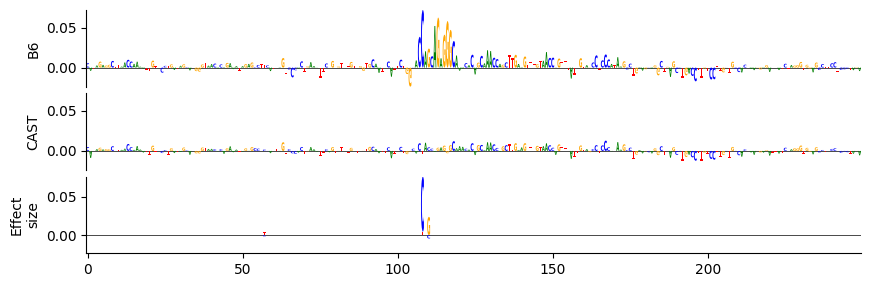

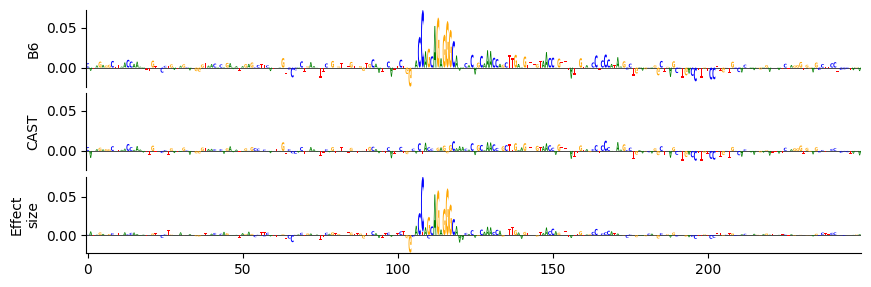

chr16-97523129-97523379mh_ig_sum.jpg
chr17-3156242-3156492 [1.2575808 1.0055214]
Ylim [np.float64(-0.04642239212989807), np.float64(0.16897600889205933)]
Ylim [np.float64(-0.04642239212989807), np.float64(0.16897600889205933)]


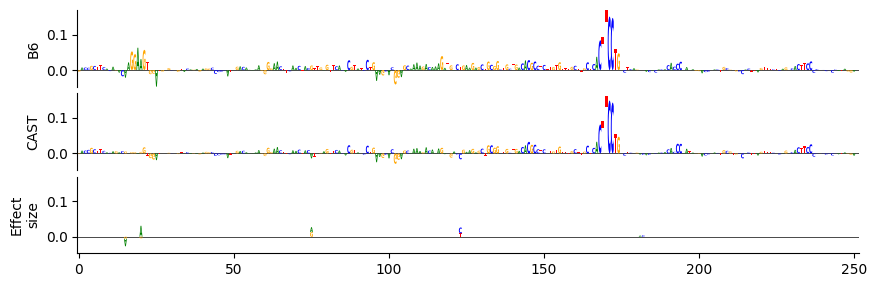

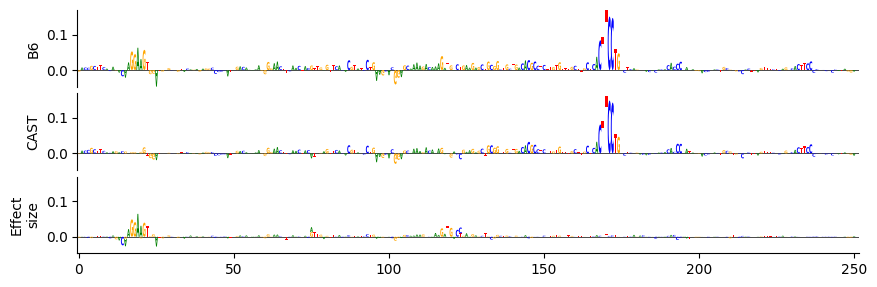

chr17-3156242-3156492mh_ig_sum.jpg
chr17-3506565-3506815 [0.3771447 0.3591496]
Ylim [np.float64(-0.03329244256019592), np.float64(0.14088892936706543)]
Ylim [np.float64(-0.03329244256019592), np.float64(0.14088892936706543)]


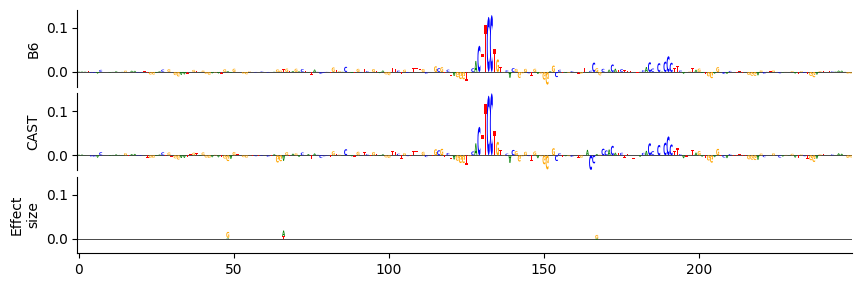

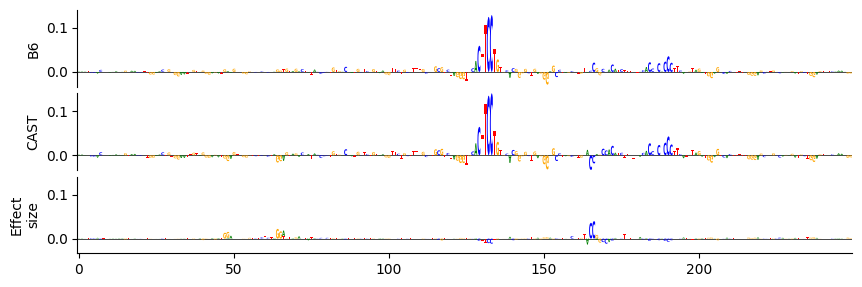

chr17-3506565-3506815mh_ig_sum.jpg
chr17-5063518-5063768 [0.06747656 0.2446885 ]
Ylim [np.float64(-0.03242383524775505), np.float64(0.0773017406463623)]
Ylim [np.float64(-0.03242383524775505), np.float64(0.0773017406463623)]


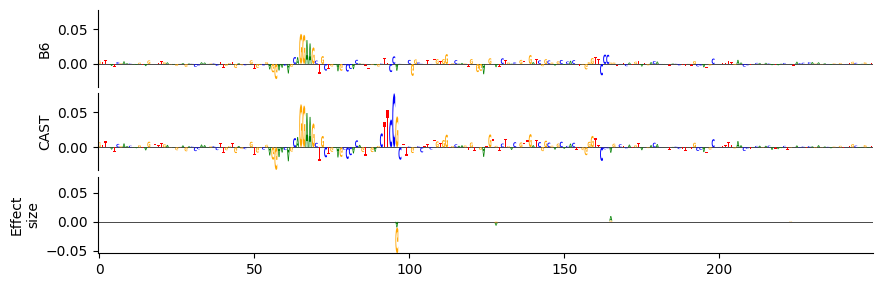

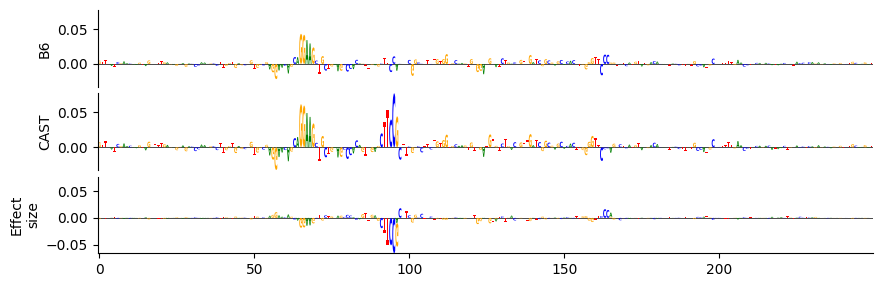

chr17-5063518-5063768mh_ig_sum.jpg
chr17-5088889-5089139 [0.49882564 0.33216733]
Ylim [np.float64(-0.04853181168437004), np.float64(0.059449367225170135)]
Ylim [np.float64(-0.04853181168437004), np.float64(0.059449367225170135)]


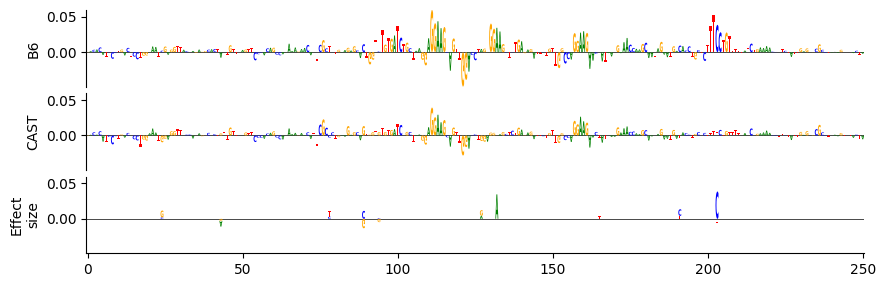

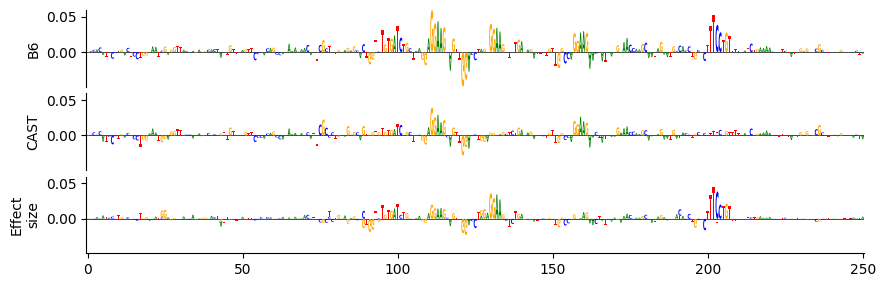

chr17-5088889-5089139mh_ig_sum.jpg
chr17-5303442-5303692 [0.79673046 0.6145986 ]
Ylim [np.float64(-0.036948781460523605), np.float64(0.07466822862625122)]
Ylim [np.float64(-0.036948781460523605), np.float64(0.07466822862625122)]


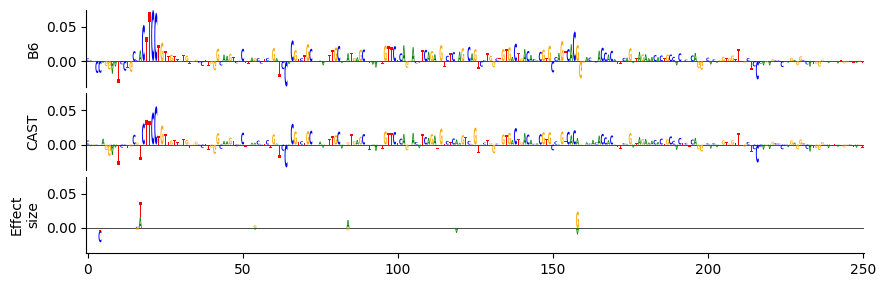

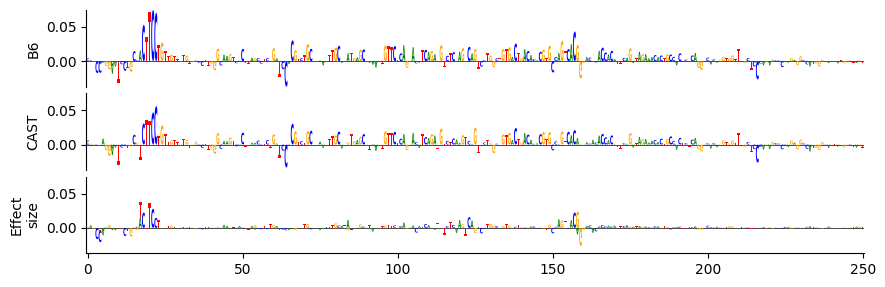

chr17-5303442-5303692mh_ig_sum.jpg
chr17-5421925-5422175 [0.9615026  0.69478875]
Ylim [np.float64(-0.046588022261857986), np.float64(0.09009554237127304)]
Ylim [np.float64(-0.046588022261857986), np.float64(0.09009554237127304)]


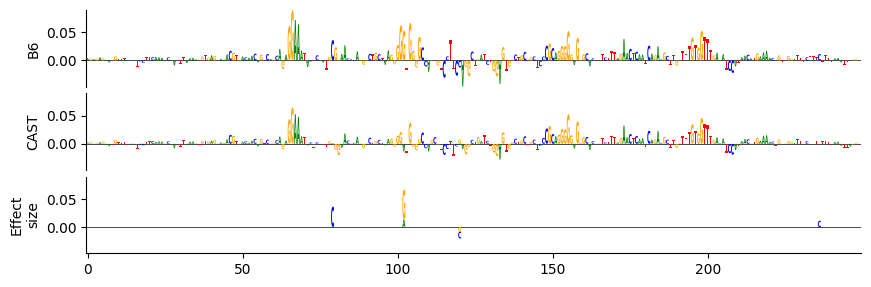

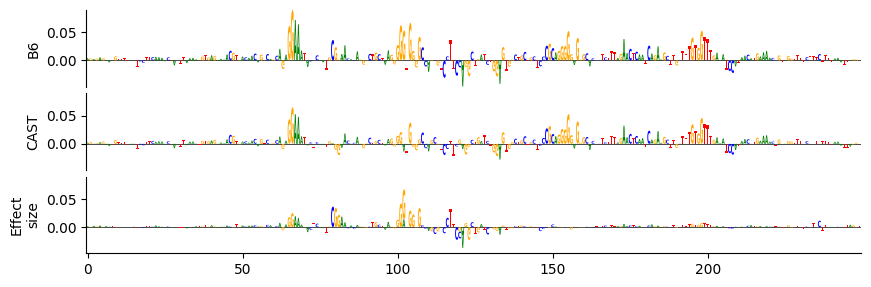

chr17-5421925-5422175mh_ig_sum.jpg
chr17-5700814-5701064 [0.5456143  0.45036623]
Ylim [np.float64(-0.04332096129655838), np.float64(0.10178735852241516)]
Ylim [np.float64(-0.04332096129655838), np.float64(0.10178735852241516)]


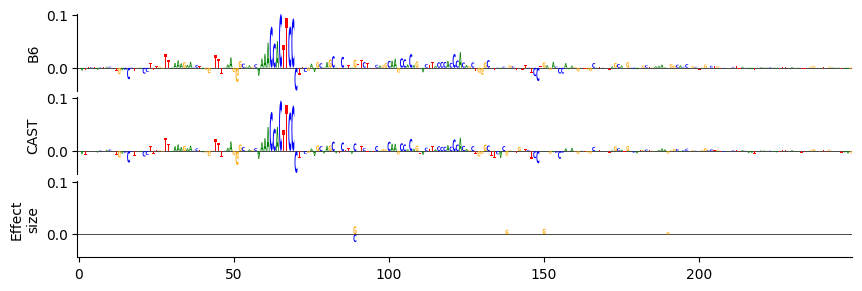

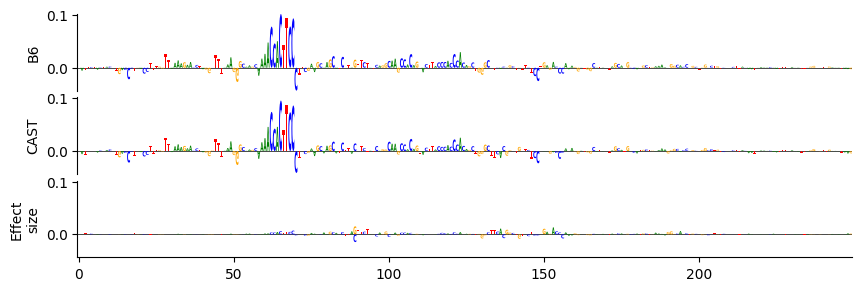

chr17-5700814-5701064mh_ig_sum.jpg
chr17-5887504-5887754 [0.6103697  0.27152488]
Ylim [np.float64(-0.03499045968055725), np.float64(0.09769288450479507)]
Ylim [np.float64(-0.03499045968055725), np.float64(0.09769288450479507)]


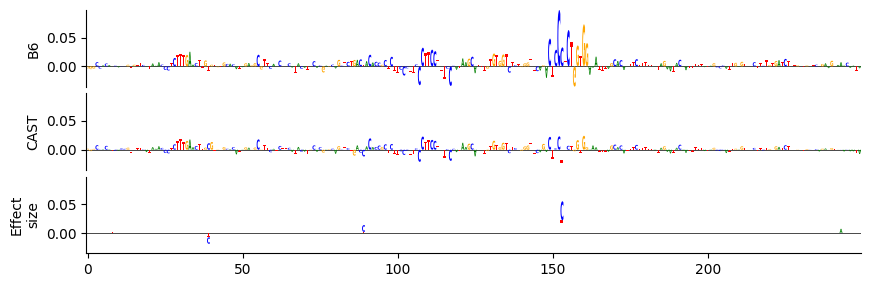

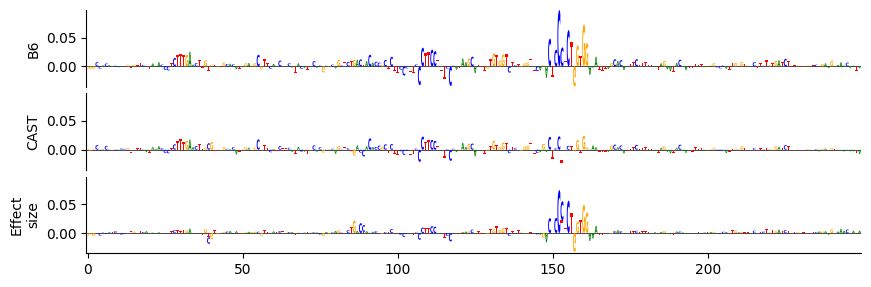

chr17-5887504-5887754mh_ig_sum.jpg
chr17-6743076-6743326 [1.0023439  0.47840577]
Ylim [np.float64(-0.0623011440038681), np.float64(0.1316308230161667)]
Ylim [np.float64(-0.0623011440038681), np.float64(0.1316308230161667)]


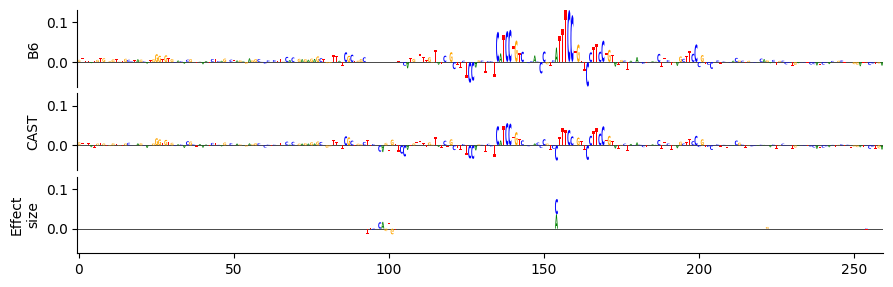

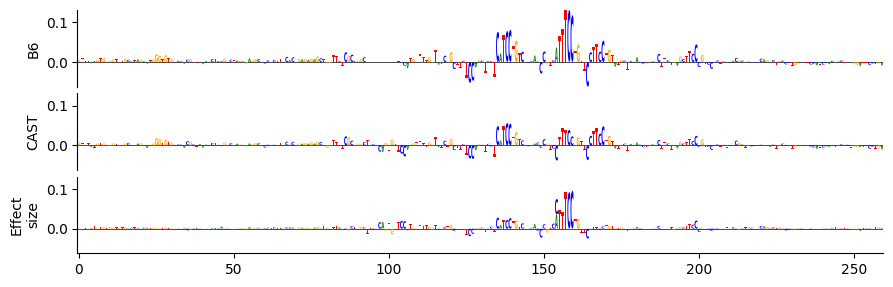

chr17-6743076-6743326mh_ig_sum.jpg
chr17-13684488-13684738 [0.2072606  0.12146299]
Ylim [np.float64(-0.012190769426524639), np.float64(0.02805521711707115)]
Ylim [np.float64(-0.012190769426524639), np.float64(0.02805521711707115)]


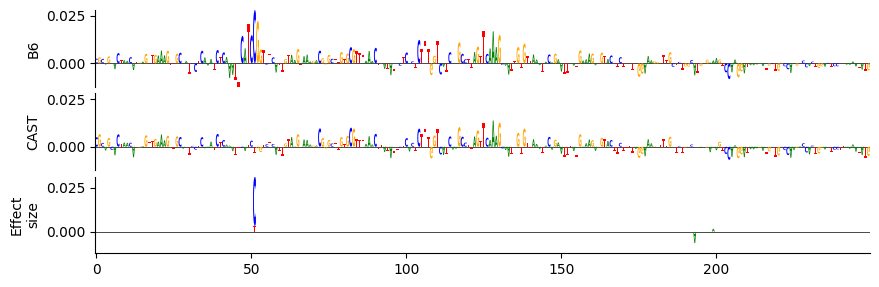

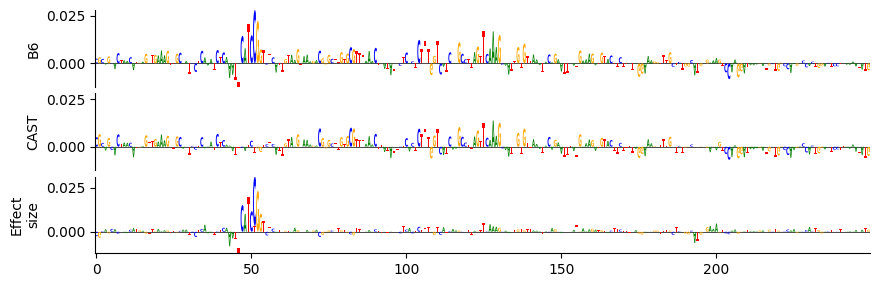

chr17-13684488-13684738mh_ig_sum.jpg
chr17-15518839-15519089 [1.0013317  0.82465845]
Ylim [np.float64(-0.04194922372698784), np.float64(0.16545259952545166)]
Ylim [np.float64(-0.04194922372698784), np.float64(0.16545259952545166)]


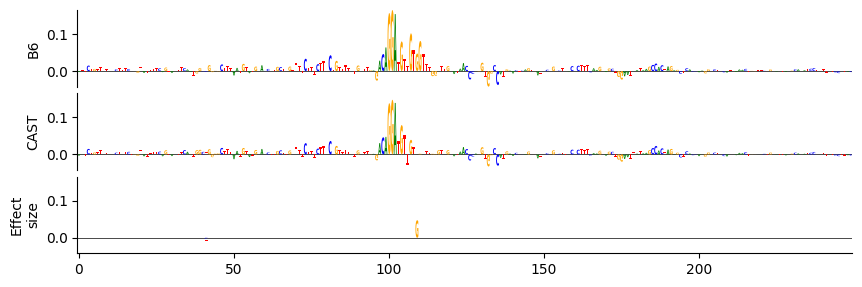

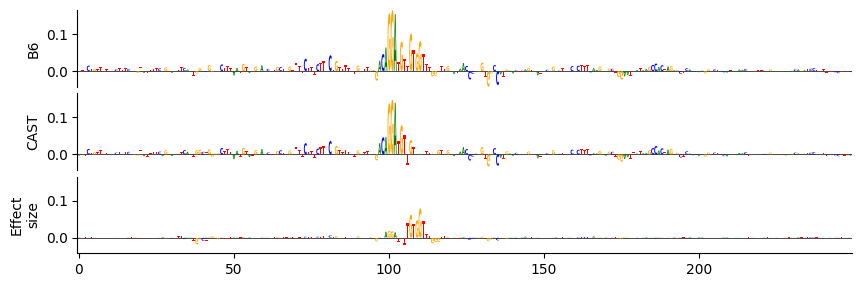

chr17-15518839-15519089mh_ig_sum.jpg
chr17-15591257-15591507 [0.40291998 0.20970656]
Ylim [np.float64(-0.04533329978585243), np.float64(0.09058302640914917)]
Ylim [np.float64(-0.04533329978585243), np.float64(0.09058302640914917)]


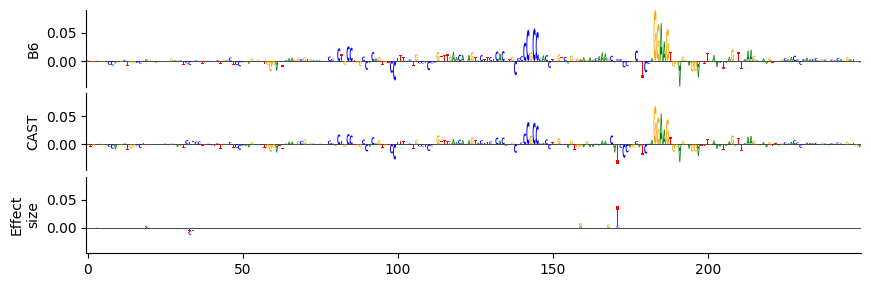

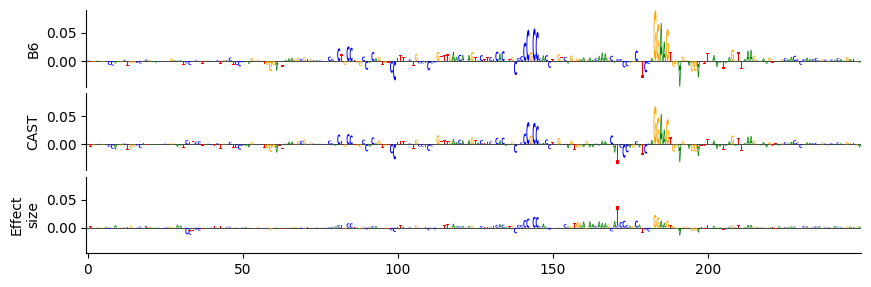

chr17-15591257-15591507mh_ig_sum.jpg
chr17-17910168-17910418 [0.5598739  0.49730226]
Ylim [np.float64(-0.041296157985925674), np.float64(0.10872530937194824)]
Ylim [np.float64(-0.041296157985925674), np.float64(0.10872530937194824)]


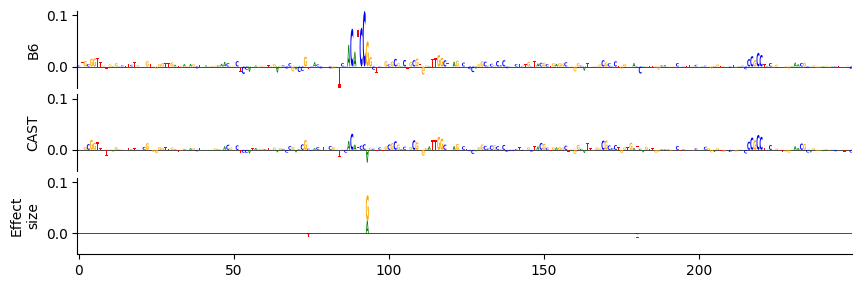

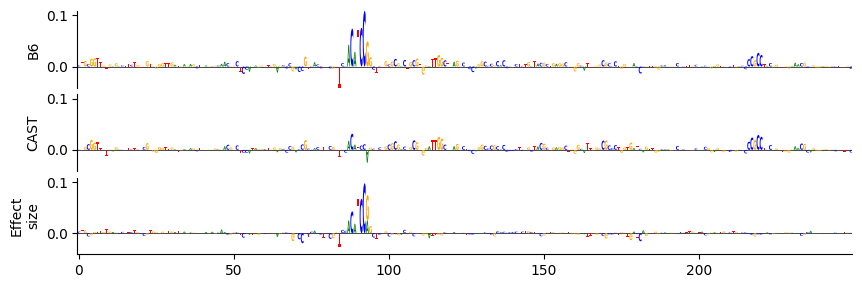

chr17-17910168-17910418mh_ig_sum.jpg
chr17-21617462-21617712 [1.1015311  0.97290426]
Ylim [np.float64(-0.0407864935696125), np.float64(0.07641447335481644)]
Ylim [np.float64(-0.0407864935696125), np.float64(0.07641447335481644)]


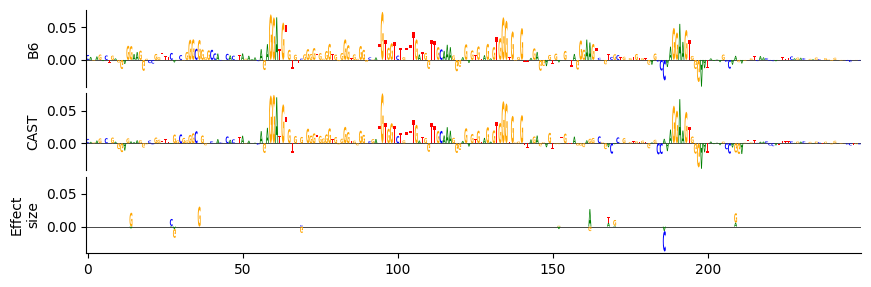

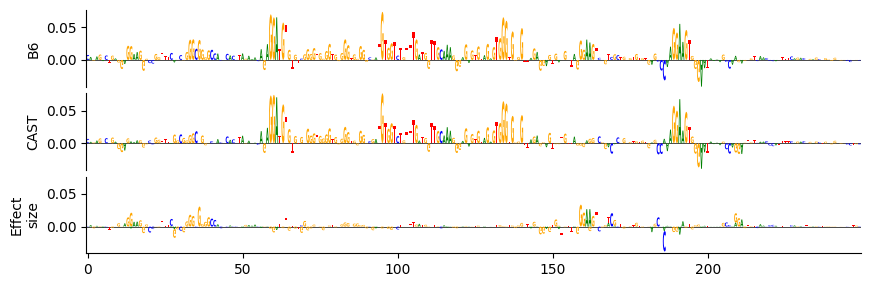

chr17-21617462-21617712mh_ig_sum.jpg
chr17-25583664-25583914 [0.24501102 0.16091095]
Ylim [np.float64(-0.03266056999564171), np.float64(0.028064187616109848)]
Ylim [np.float64(-0.03266056999564171), np.float64(0.028064187616109848)]


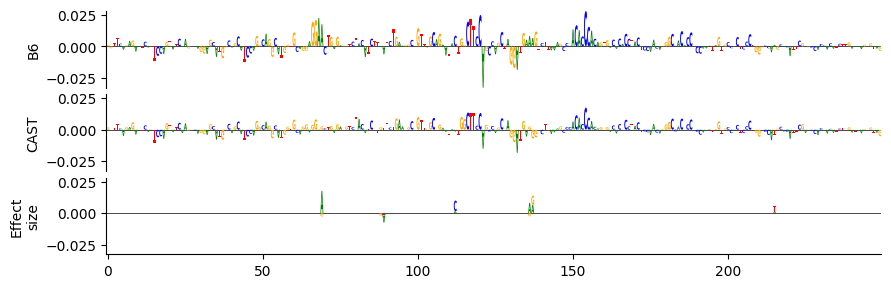

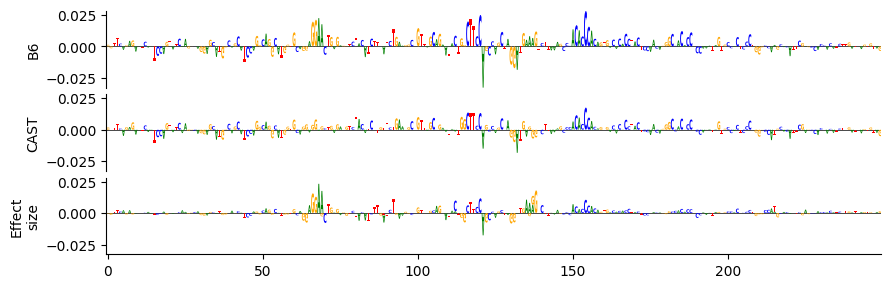

chr17-25583664-25583914mh_ig_sum.jpg
chr17-26594214-26594464 [0.55564076 0.43383175]
Ylim [np.float64(-0.037611428648233414), np.float64(0.18790985643863678)]
Ylim [np.float64(-0.037611428648233414), np.float64(0.18790985643863678)]


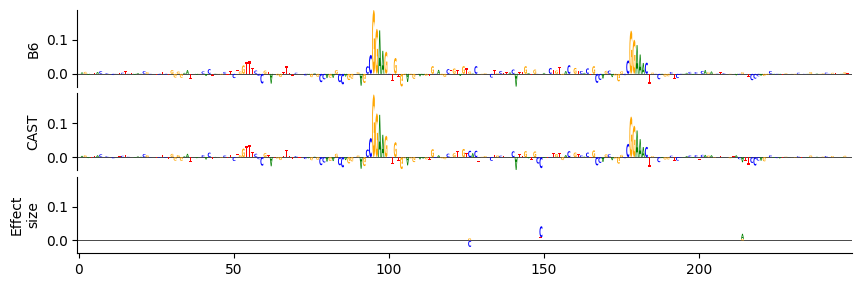

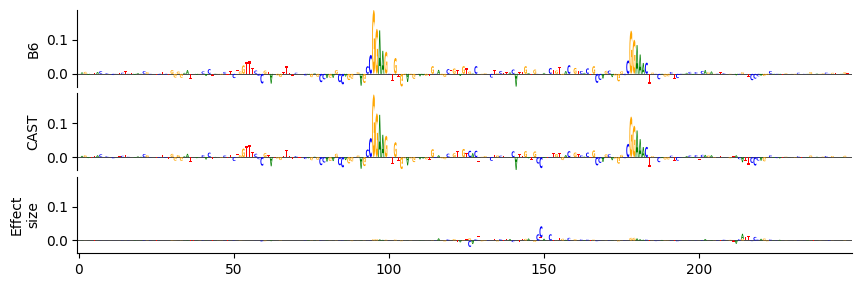

chr17-26594214-26594464mh_ig_sum.jpg
chr17-27362615-27362865 [0.5163235  0.42994186]
Ylim [np.float64(-0.024469107389450073), np.float64(0.06606356054544449)]
Ylim [np.float64(-0.024469107389450073), np.float64(0.06606356054544449)]


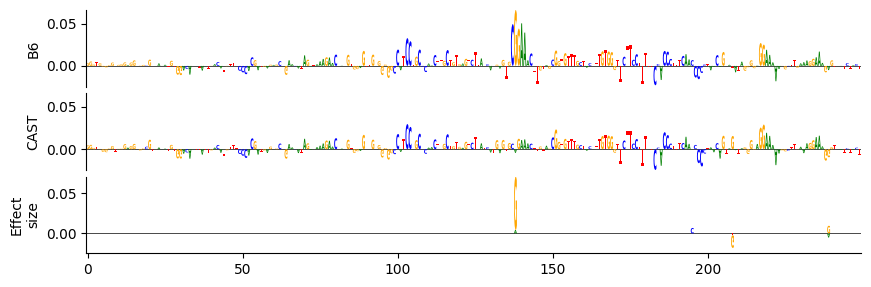

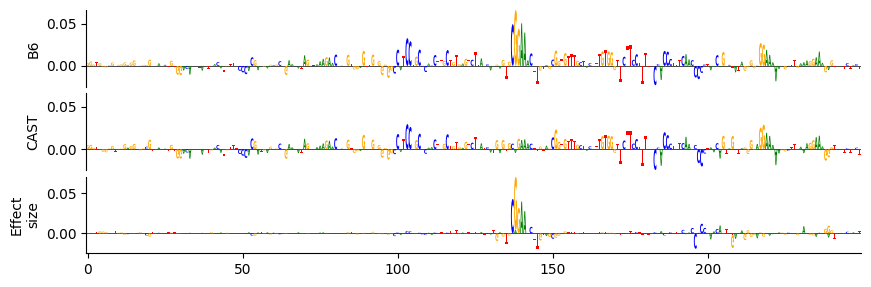

chr17-27362615-27362865mh_ig_sum.jpg
chr17-28922182-28922432 [0.41550082 0.23698561]
Ylim [np.float64(-0.05899114906787872), np.float64(0.09574849903583527)]
Ylim [np.float64(-0.05899114906787872), np.float64(0.09574849903583527)]


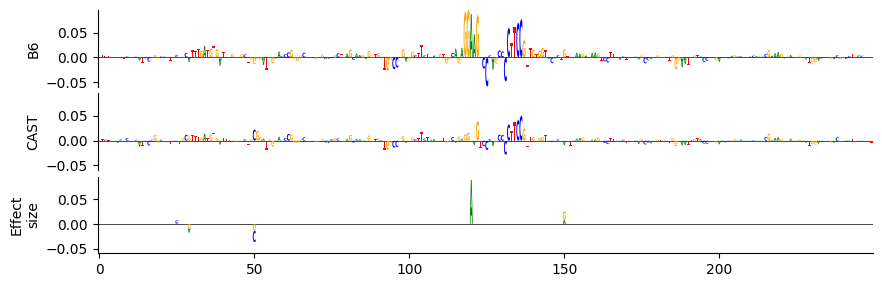

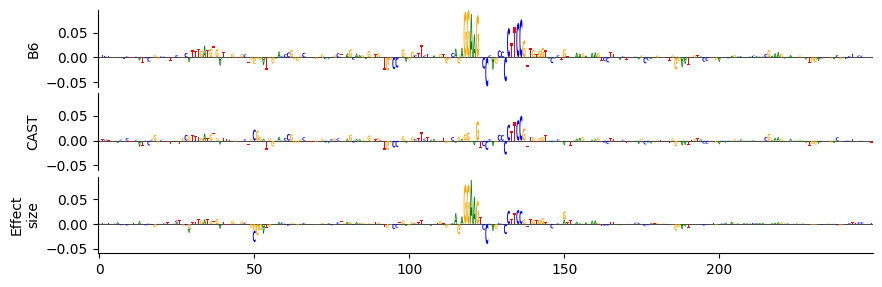

chr17-28922182-28922432mh_ig_sum.jpg
chr17-29212707-29212957 [0.46864435 0.27367622]
Ylim [np.float64(-0.04476599767804146), np.float64(0.07876603305339813)]
Ylim [np.float64(-0.04476599767804146), np.float64(0.07876603305339813)]


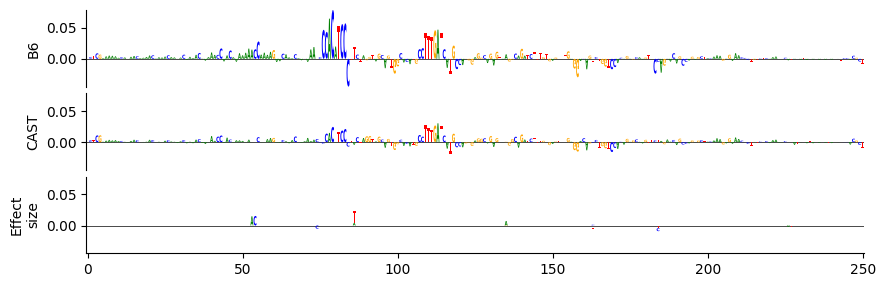

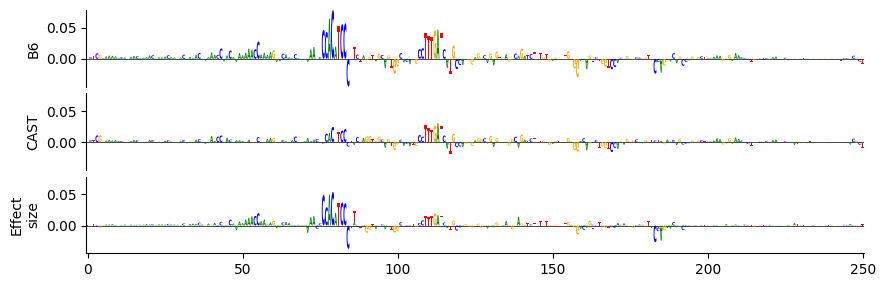

chr17-29212707-29212957mh_ig_sum.jpg
chr17-29261882-29262132 [1.0746667 0.9290918]
Ylim [np.float64(-0.052244920283555984), np.float64(0.13659708201885223)]
Ylim [np.float64(-0.052244920283555984), np.float64(0.13659708201885223)]


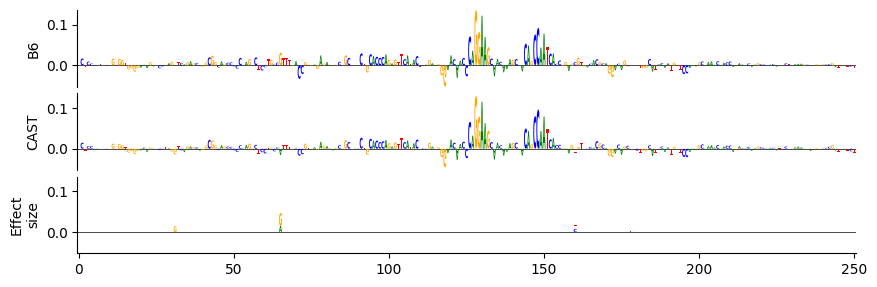

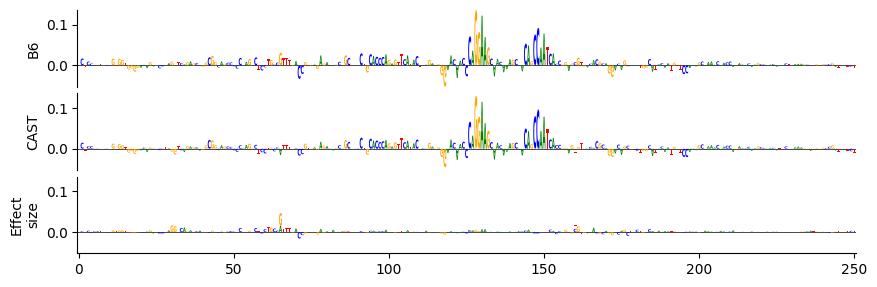

chr17-29261882-29262132mh_ig_sum.jpg
chr17-29264919-29265169 [1.6621734 1.5345792]
Ylim [np.float64(-0.04813531041145325), np.float64(0.24026909470558167)]
Ylim [np.float64(-0.04813531041145325), np.float64(0.24026909470558167)]


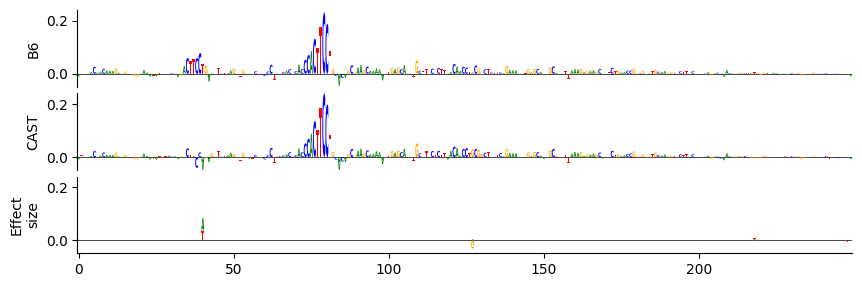

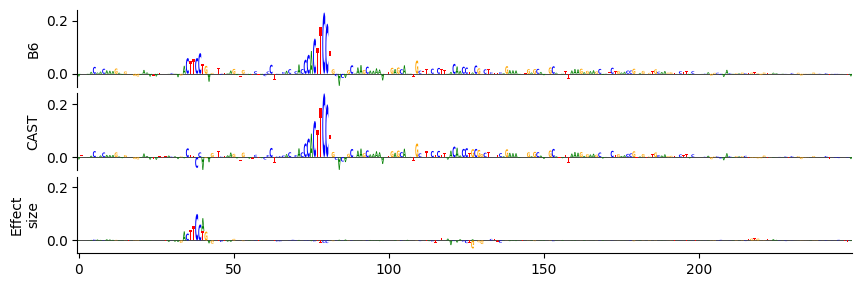

chr17-29264919-29265169mh_ig_sum.jpg
chr17-29532057-29532307 [0.55200064 0.3894846 ]
Ylim [np.float64(-0.03362011909484863), np.float64(0.11099325120449066)]
Ylim [np.float64(-0.03362011909484863), np.float64(0.11099325120449066)]


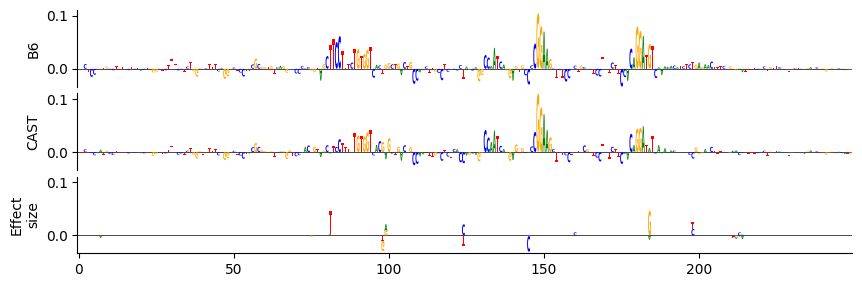

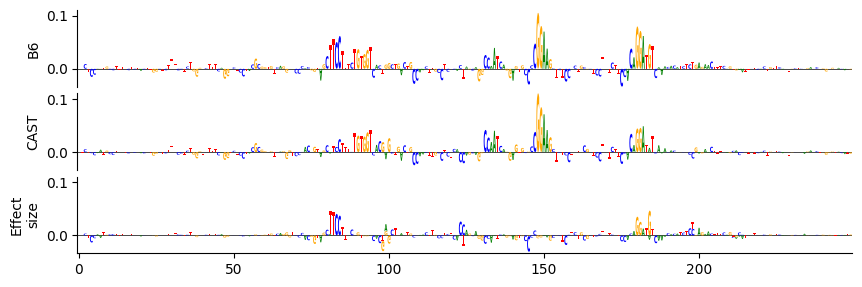

chr17-29532057-29532307mh_ig_sum.jpg
chr17-29584371-29584621 [0.74376994 1.0936388 ]
Ylim [np.float64(-0.05822538584470749), np.float64(0.16851010918617249)]
Ylim [np.float64(-0.05822538584470749), np.float64(0.16851010918617249)]


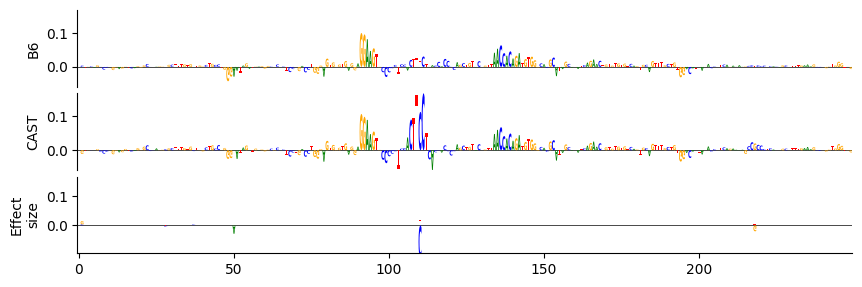

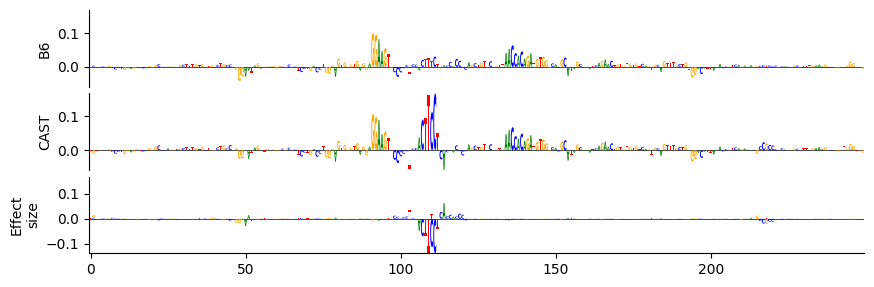

chr17-29584371-29584621mh_ig_sum.jpg
chr17-29989681-29989931 [0.9688275  0.81517935]
Ylim [np.float64(-0.036270856857299805), np.float64(0.15763206779956818)]
Ylim [np.float64(-0.036270856857299805), np.float64(0.15763206779956818)]


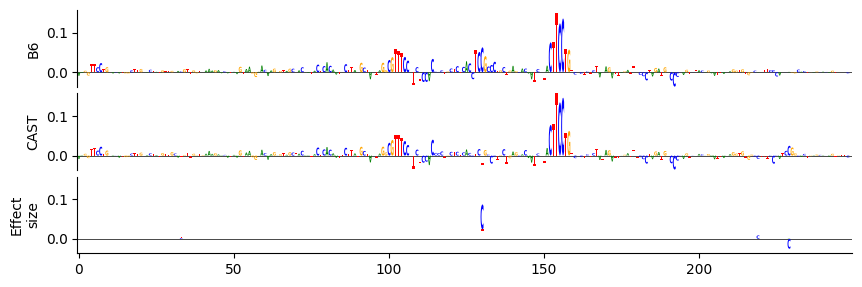

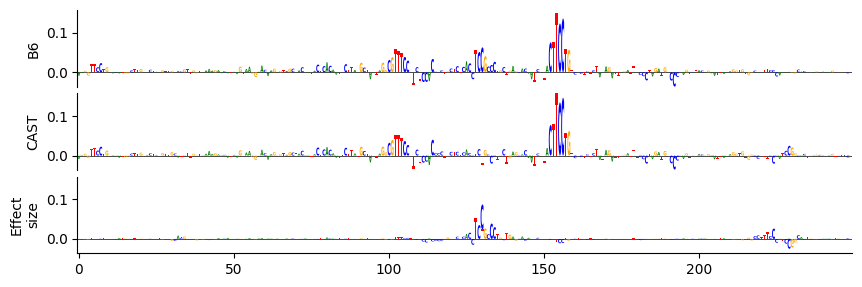

chr17-29989681-29989931mh_ig_sum.jpg
chr17-30347383-30347633 [0.5572091  0.48589918]
Ylim [np.float64(-0.03272635489702225), np.float64(0.12674380838871002)]
Ylim [np.float64(-0.03272635489702225), np.float64(0.12674380838871002)]


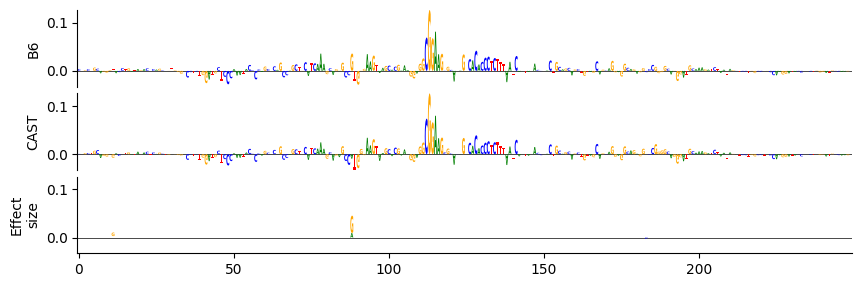

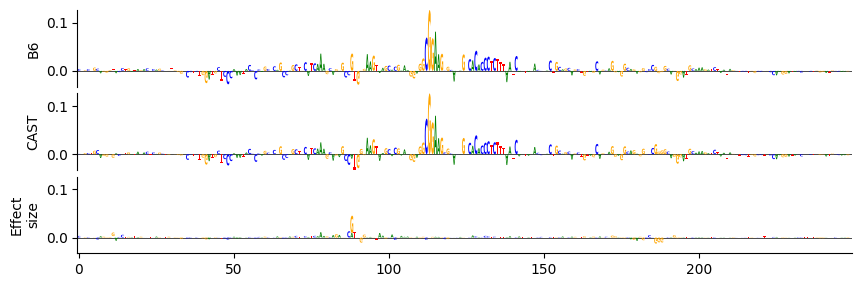

chr17-30347383-30347633mh_ig_sum.jpg
chr17-31850496-31850746 [0.66983587 0.41694123]
Ylim [np.float64(-0.027114085853099823), np.float64(0.05584188178181648)]
Ylim [np.float64(-0.027114085853099823), np.float64(0.05584188178181648)]


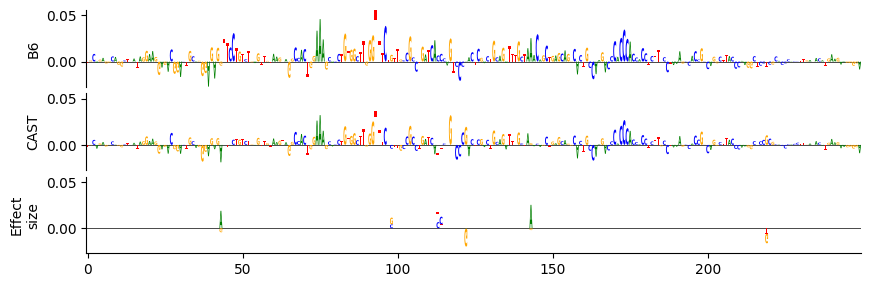

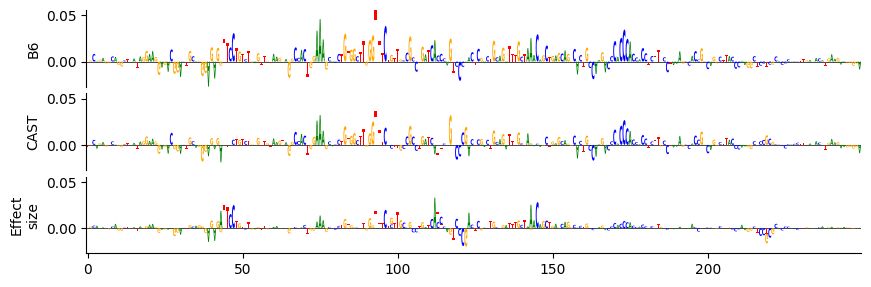

chr17-31850496-31850746mh_ig_sum.jpg
chr17-32880372-32880622 [0.7145947 0.4130098]
Ylim [np.float64(-0.06655430793762207), np.float64(0.16222254931926727)]
Ylim [np.float64(-0.06655430793762207), np.float64(0.16222254931926727)]


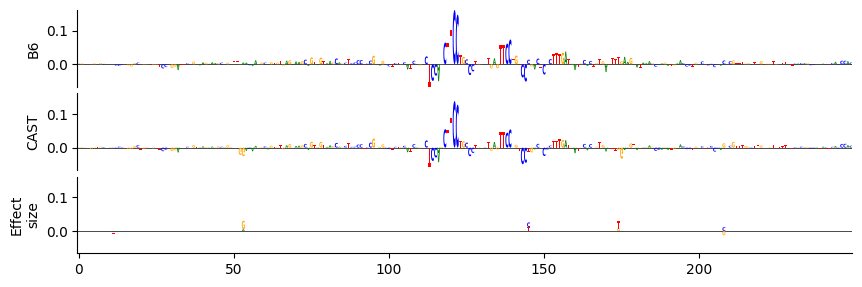

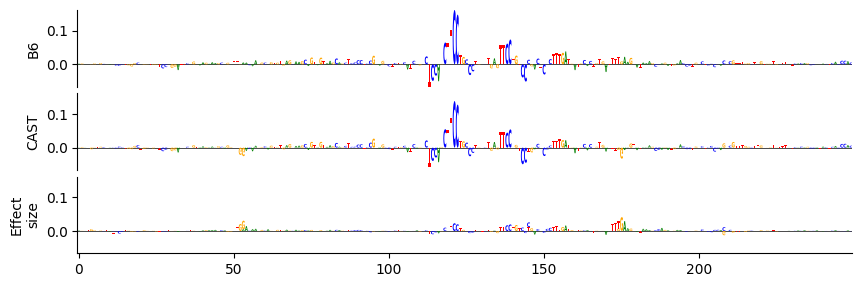

chr17-32880372-32880622mh_ig_sum.jpg
chr17-32880626-32880876 [0.5300313  0.45667103]
Ylim [np.float64(-0.044213537126779556), np.float64(0.05352339893579483)]
Ylim [np.float64(-0.044213537126779556), np.float64(0.05352339893579483)]


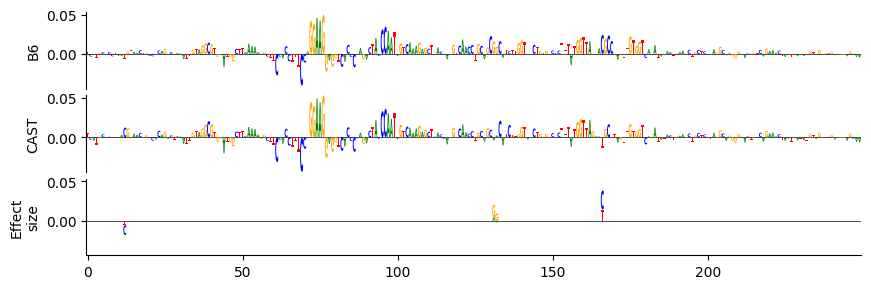

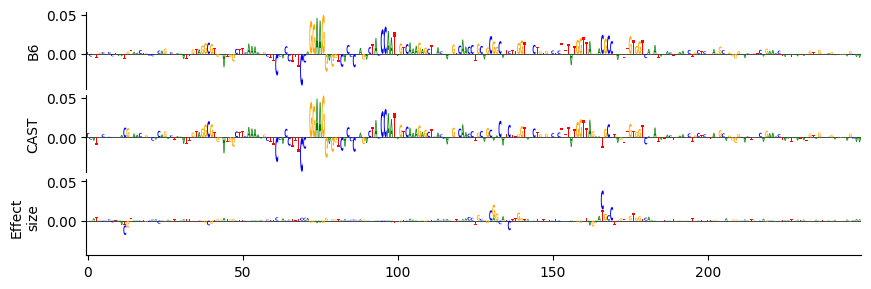

chr17-32880626-32880876mh_ig_sum.jpg
chr17-32880940-32881190 [1.015444 0.745268]
Ylim [np.float64(-0.03274829313158989), np.float64(0.12294339388608932)]
Ylim [np.float64(-0.03274829313158989), np.float64(0.12294339388608932)]


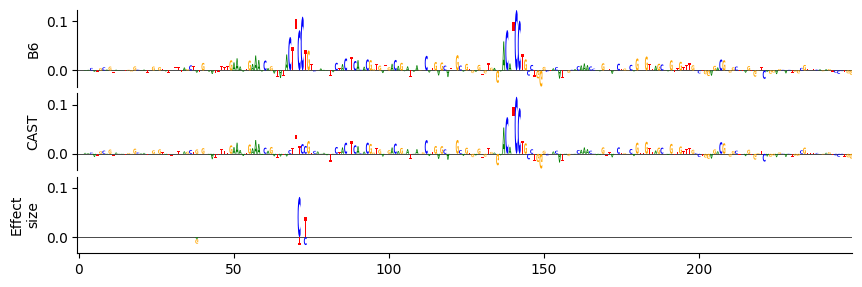

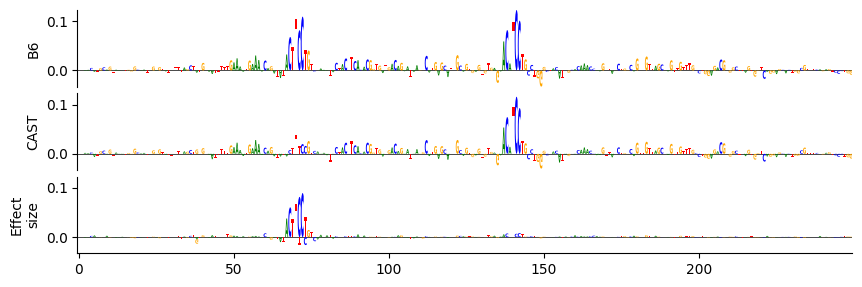

chr17-32880940-32881190mh_ig_sum.jpg
chr17-33752320-33752570 [0.51039946 0.32720044]
Ylim [np.float64(-0.05167420953512192), np.float64(0.05176892131567001)]


KeyboardInterrupt: 

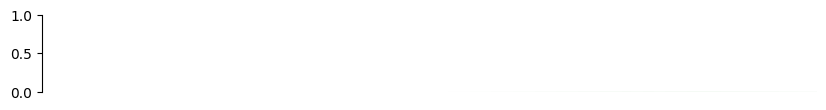

In [11]:
from DeepAllele.plotlib import plot_attribution
import matplotlib.pyplot as plt


unit=0.04
height_scale = 25
ylim = None
outname = f'mh_{attribution_type}_{batch_id}'
dpi = 200
fmt = 'jpg'

for seq_idx in range(selected_sequences.shape[0]):
    sel_att = mh_selected_attributions[seq_idx]
    sel_seq = selected_sequences[seq_idx]
    
    print(selected_sequence_labels[seq_idx], np.sum(sel_att*sel_seq, axis=(0,1)))
    
    # normalize along the base axis
    sel_att = sel_att - np.mean(sel_att, axis = -2, keepdims=True)

    fig = plot_attribution(sel_seq, sel_att, plot_effect_difference = True, plot_difference = True,
                           seq_based = True, xticks = None, xticklabels = None, ylim = None, 
                           unit = unit, height_scale = height_scale)

    figdiff = plot_attribution(sel_seq, sel_att, plot_effect_difference = False, plot_difference = True,
                           seq_based = True, xticks = None, xticklabels = None, ylim = None, 
                           unit = unit, height_scale = height_scale)
    
    plt.show()
    fig.savefig(out_path+selected_sequence_labels[seq_idx]+outname+'.'+fmt, dpi = dpi, bbox_inches = 'tight')
    figdiff.savefig(out_path+selected_sequence_labels[seq_idx]+outname+'.diff.'+fmt, dpi = dpi, bbox_inches = 'tight')
    print(selected_sequence_labels[seq_idx]+outname+'.'+fmt)
    
    plt.close(fig)